Option Pricing Masters Thesis

Author: Kyle Bistrain
Date: May 19, 2025

Walk Forward Model with early stoppage


Choices:

- Call vs Put

- Historical Volatiity 

- rolling average


Imports

In [27]:
import pandas as pd
import numpy as np
from datetime import timedelta
from dateutil.relativedelta import relativedelta
from scipy.stats import norm
from sklearn.neural_network import MLPRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import copy

Merton Model Black Scholes with Call Function

In [28]:
def bs_call_price(S, K, r, T, sigma, q=0.0):
    """
    Calculate Black-Scholes price for a European Call option with continuous dividend yield.
    
    Parameters:
    S (float): Current stock price
    K (float): Strike price
    r (float): Risk-free interest rate (annual, decimal)
    T (float): Time to expiration (in years)
    sigma (float): Volatility of the underlying asset (annual, decimal)
    q (float): Continuous dividend yield (annual, decimal)
    
    Returns:
    float: Price of the European call option
    """
    sigma = np.maximum(sigma, 1e-12)
    sqrtT = np.sqrt(T)
    d1 = (np.log(S / K) + (r - q + 0.5 * sigma ** 2) * T) / (sigma * sqrtT)
    d2 = d1 - sigma * sqrtT
    return S * np.exp(-q * T) * norm.cdf(d1) - K * np.exp(-r * T) * norm.cdf(d2)


In [29]:
def bs_put_price(S, K, r, T, sigma, q=0.0):
    """
    Calculate Black-Scholes price for a European Put option with continuous dividend yield.
    
    Parameters:
    S (float): Current stock price
    K (float): Strike price
    r (float): Risk-free interest rate (annual, decimal)
    T (float): Time to expiration (in years)
    sigma (float): Volatility of the underlying asset (annual, decimal)
    q (float): Continuous dividend yield (annual, decimal)
    
    Returns:
    float: Price of the European put option
    """
    sigma = np.maximum(sigma, 1e-12)
    sqrtT = np.sqrt(T)
    d1 = (np.log(S / K) + (r - q + 0.5 * sigma ** 2) * T) / (sigma * sqrtT)
    d2 = d1 - sigma * sqrtT
    return K * np.exp(-r * T) * norm.cdf(-d2) - S * np.exp(-q * T) * norm.cdf(-d1)

In [30]:
merged_df3 = pd.read_csv("/Users/kylebistrain/Documents/STATISTICS MASTERS/Thesis Code/merged_df3.csv", parse_dates=["expiration","quotedate"])
merged_df6 = pd.read_csv("/Users/kylebistrain/Documents/STATISTICS MASTERS/Thesis Code/merged_df6.csv", parse_dates=["expiration","quotedate"])
merged_df1 = pd.read_csv("/Users/kylebistrain/Documents/STATISTICS MASTERS/Thesis Code/merged_df1.csv", parse_dates=["expiration","quotedate"])

Modify for 3 month and 6 month risk free interest rate

In [24]:
df = merged_df3
numeric_cols = [
    "underlying_last","strike","DGS3MO","T","impliedvol",     # change for risk free interest rate
    "logvol10_annual","logvol22_annual","logvol44_annual","logvol63_annual","logvol126_annual", "logvol252_annual", "q","is_ex_date",
    "bid","ask","IVAsk","IVBid", "optionroot","Close"
]
for c in numeric_cols:
    df[c] = pd.to_numeric(df[c], errors="coerce")

df["expiration"] = pd.to_datetime(df["expiration"])
df["quotedate"]  = pd.to_datetime(df["quotedate"])
df["S"]         = df["underlying_last"]
df["K"]         = df["strike"]
df["r"]         = df["DGS3MO"]            # change for risk free interest rate
df["T"]         = df["T"]                  
df["sigma_63"]  = df["logvol63_annual"]      # change for different window
df["p_price"]   = (df["bid"] + df["ask"]) / 2
df["moneyness"] = (df["S"] / df["K"]) - 1         # ratio 
df["IV_mid"] = (df["IVAsk"]+df["IVBid"])/2
df["vol_vix"] = df['Close']/100


Walkforward Multilayer Perceptron Model with Early Stoppage 

10 months (.8 train and .2 val with no shuffling) 
2 months test

In [ ]:
df["black_scholes"] = bs_call_price(
    df["S"], df["K"], df["r"], df["T"], df["vol_vix"], df["q"] # change for risk free interest rate
)
print(df["black_scholes"].isna().sum())
run = df.loc[
    (df["type"]=="call") &   # change depending on call or put
    #df["volume"] >= 1 &
    df["moneyness"].between(-0.5,0.5) &   # +/-50% moneyness filter 
    df["black_scholes"].notna(),
    ["S","K","r","T","sigma_63","volume","openinterest","black_scholes","p_price","quotedate","moneyness", "IV_mid","q","is_ex_date", "vol_vix"]
].dropna()

# Parameters 
first_date, last_date = pd.Timestamp("2012-02-14"), pd.Timestamp("2024-05-31")
train_months, test_months = 12, 2
n_epochs   = 500
atm_thresh = 0.01
features = ["S","K","r","T","vol_vix","q","is_ex_date"]         # change for risk free interest rate added moneyness *** also use vol_vix for implied vol
#features   = ["S","K","r","T","sigma_22","volume","openinterest"]
target     = "p_price"

2750


HLN DM Test for Forecast Error Test

In [42]:
import pandas as pd
import numpy as np
from scipy import stats
import statsmodels.api as sm

def hln_dm_test_corrected(loss_diff_series, h=1):
    """
    Performs the Harvey, Leybourne, and Newbold adjusted
    Diebold-Mariano test with a robust OLS based method.
    
    Args:
        loss_diff_series: A series of loss differentials.
        h : The forecast horizon. h=1 for one step ahead forecasts.
    
    Returns:
        tuple: (Adjusted DM statistic, p-value)
    """
    if loss_diff_series.empty:
        return np.nan, np.nan
        
    T = len(loss_diff_series)
    
    # 1. Regress the loss differential on a constant to get the DM statistic
    #    using a HAC robust covariance matrix (Newey-West).
    #    The t-statistic of the intercept is the DM statistic.
    model = sm.OLS(loss_diff_series, sm.add_constant(np.zeros(T))).fit(
        cov_type='HAC', cov_kwds={'maxlags': h-1}
    )
    dm_stat = model.tvalues[0]
    
    # 2. Apply the HLN small-sample adjustment
    adjustment_factor = np.sqrt((T + 1 - 2*h + h*(h-1)/T) / T)
    dm_adj_stat = dm_stat * adjustment_factor
    
    # 3. Calculate the p-value using a t-distribution
    p_value = 2 * stats.t.sf(np.abs(dm_adj_stat), df=T-1)
    
    return dm_adj_stat, p_value

[Fold 1] Immediate stop at epoch 33


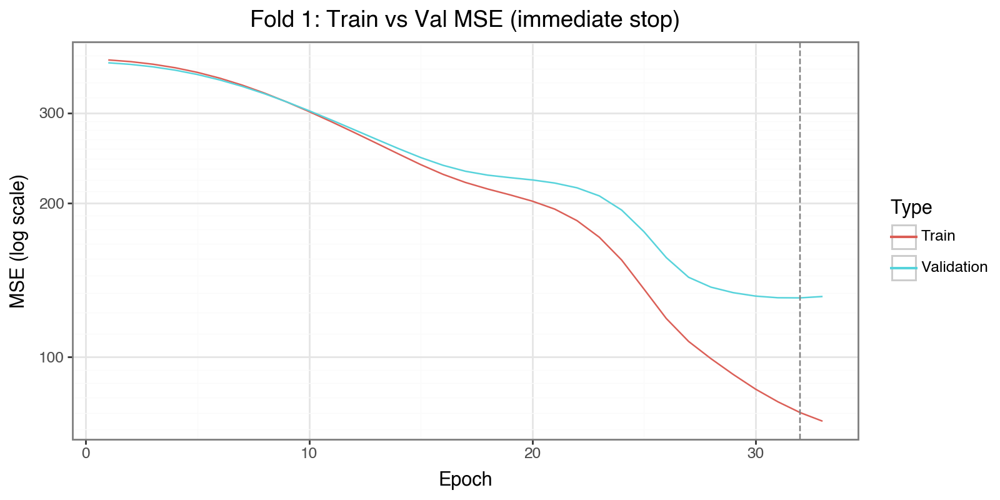

[Fold 2] Immediate stop at epoch 89


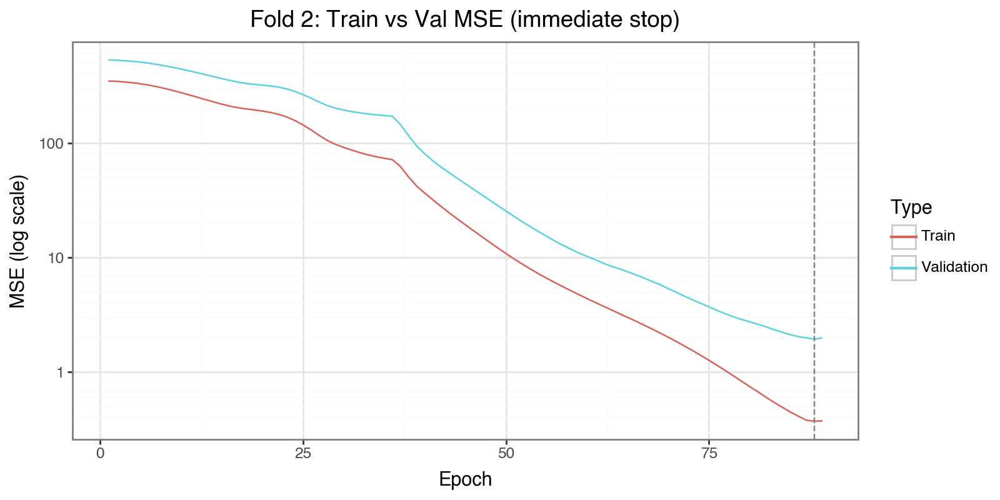

[Fold 3] Immediate stop at epoch 84


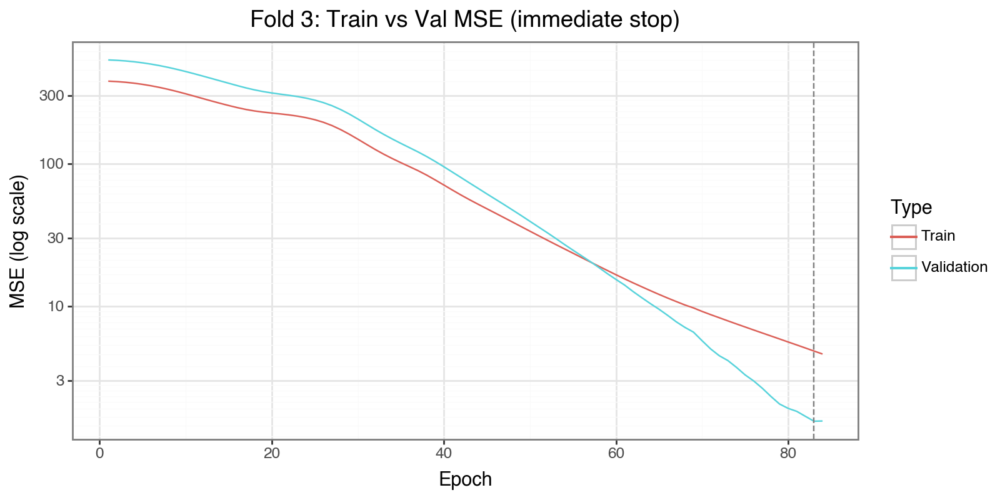

[Fold 4] Immediate stop at epoch 68


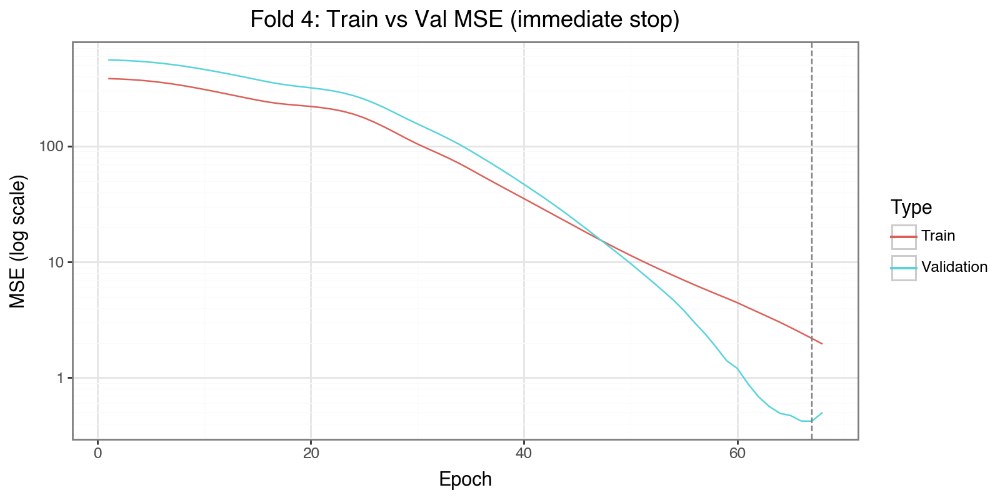

[Fold 5] Immediate stop at epoch 59


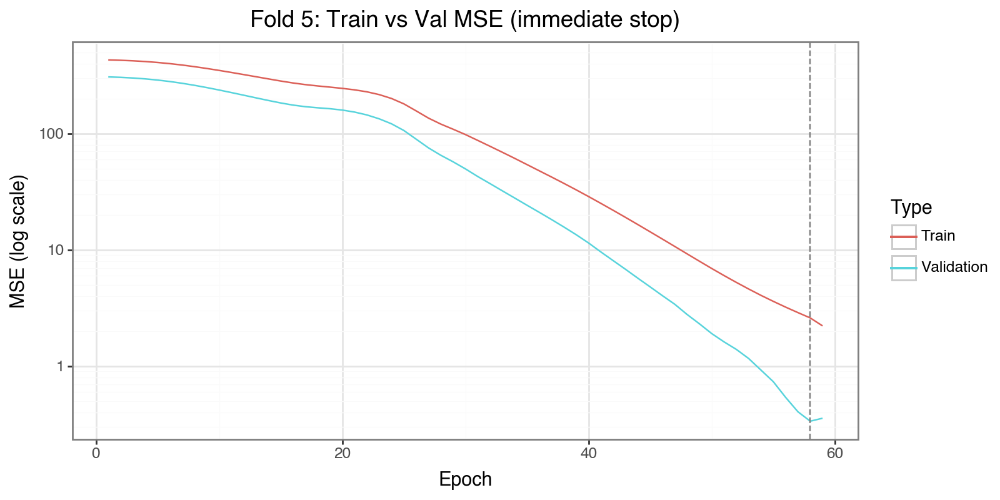

[Fold 6] Immediate stop at epoch 76


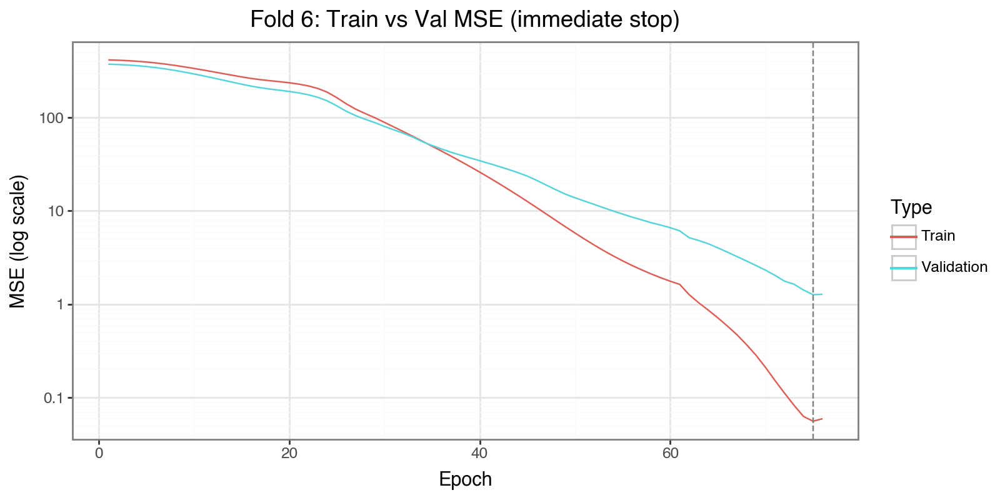

[Fold 7] Immediate stop at epoch 61


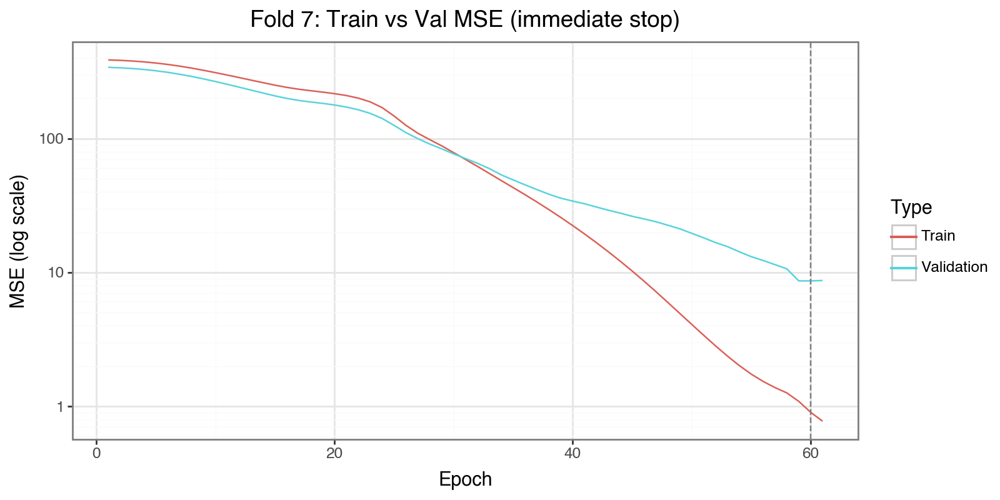

[Fold 8] Immediate stop at epoch 79


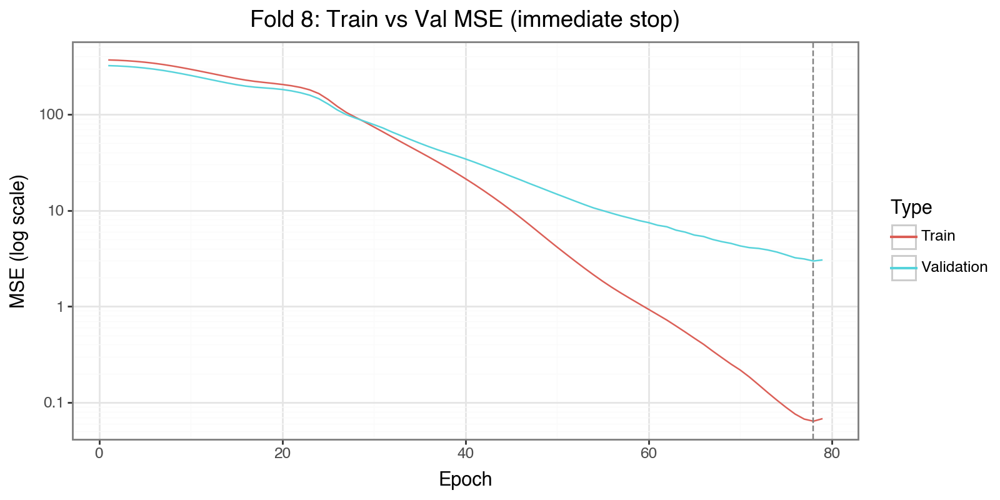

[Fold 9] Immediate stop at epoch 17


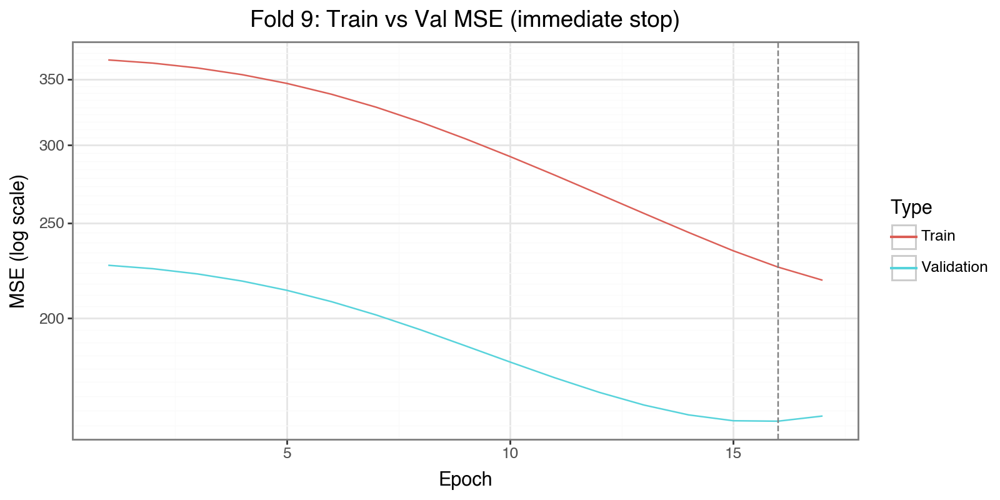

[Fold 10] Immediate stop at epoch 15


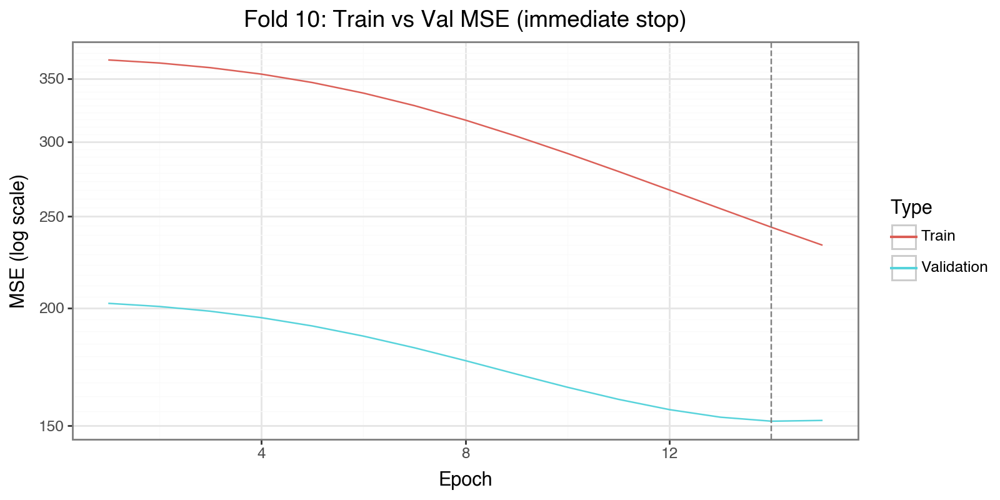

[Fold 11] Immediate stop at epoch 16


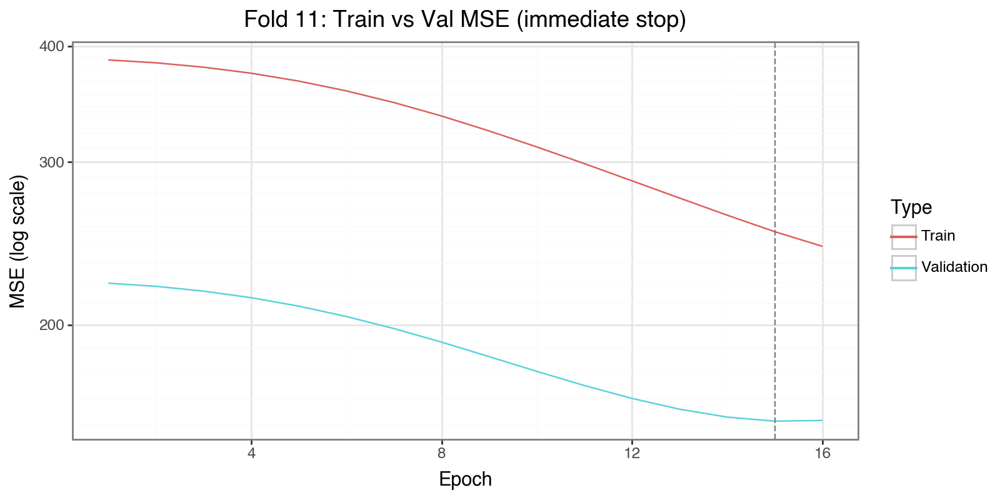

[Fold 12] Immediate stop at epoch 75


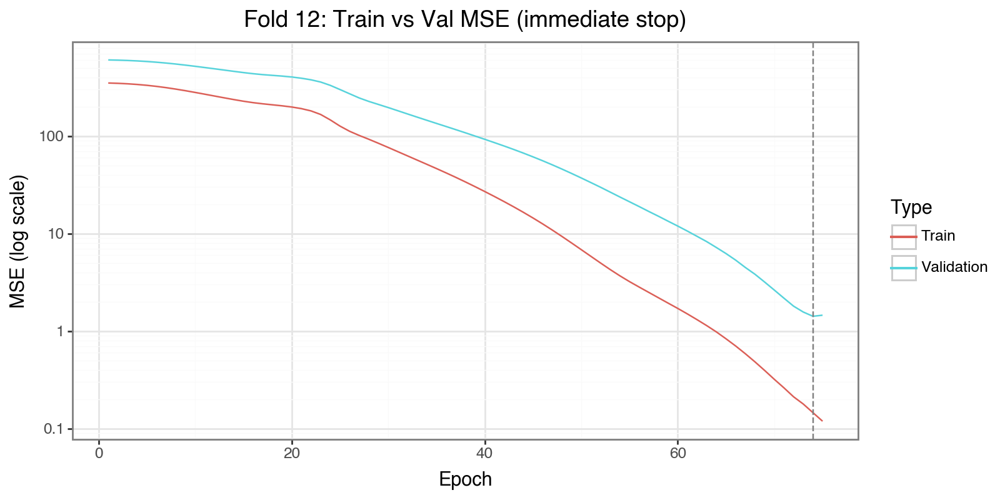

[Fold 13] Immediate stop at epoch 83


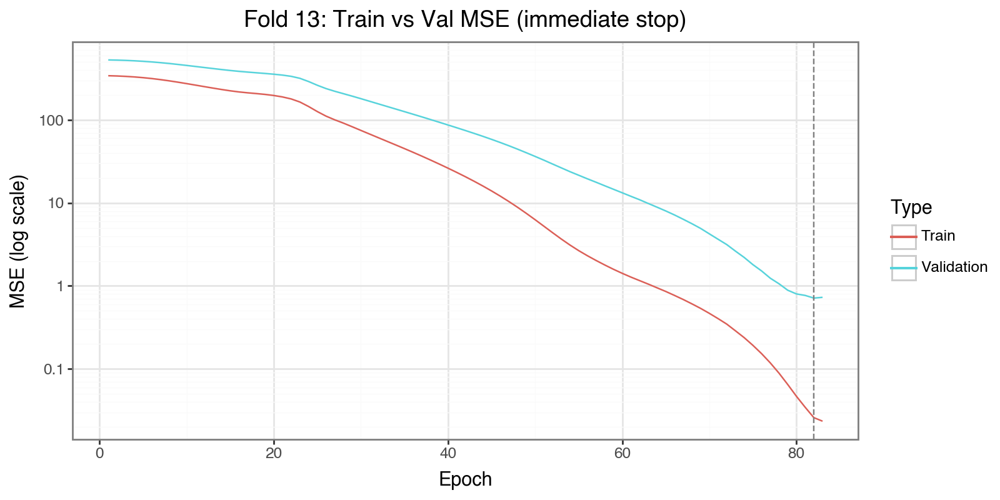

[Fold 14] Immediate stop at epoch 82


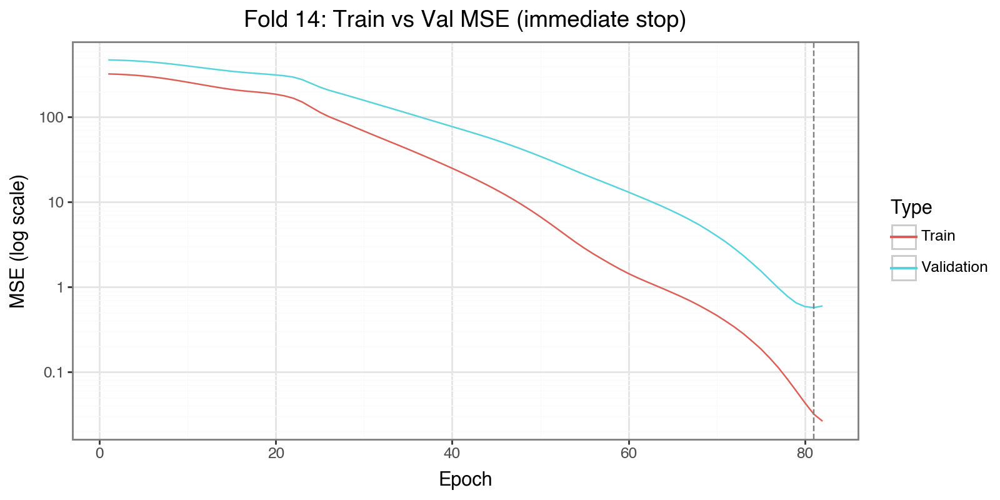

[Fold 15] Immediate stop at epoch 72


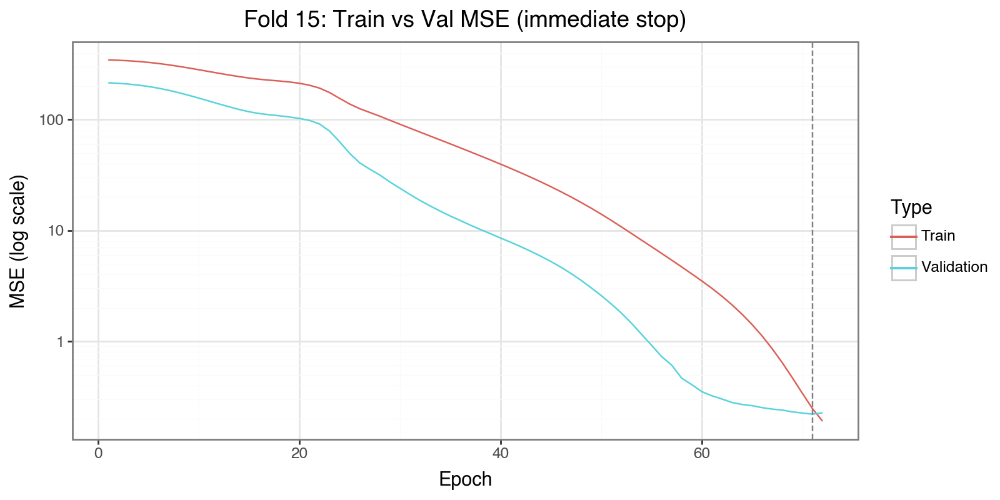

[Fold 16] Immediate stop at epoch 68


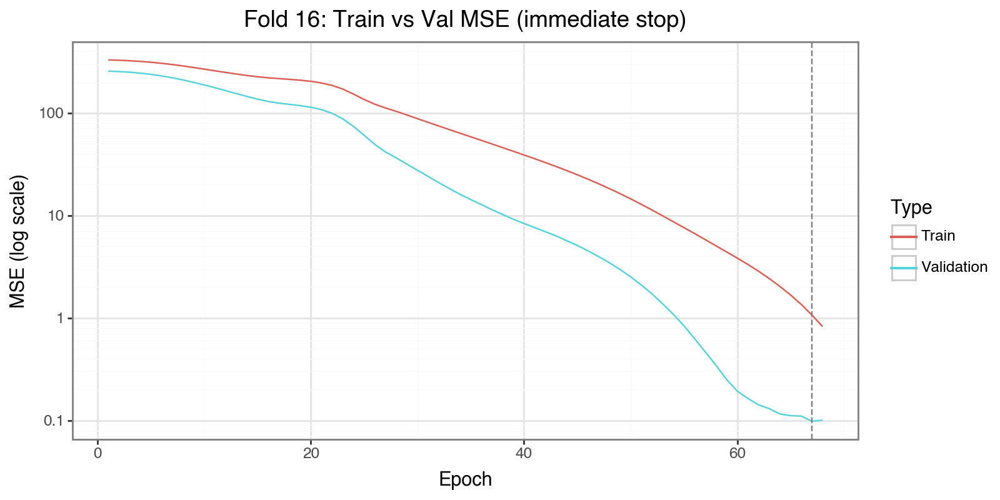

[Fold 17] Immediate stop at epoch 70


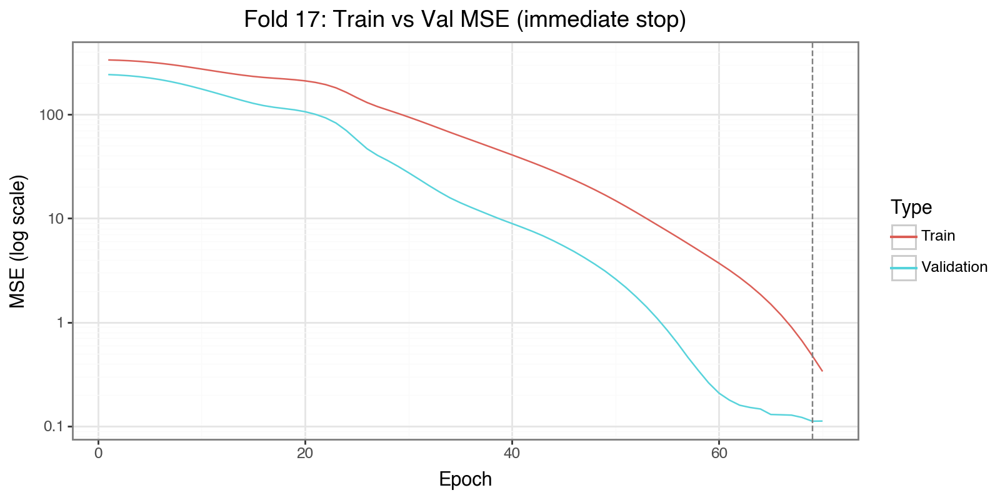

[Fold 18] Immediate stop at epoch 82


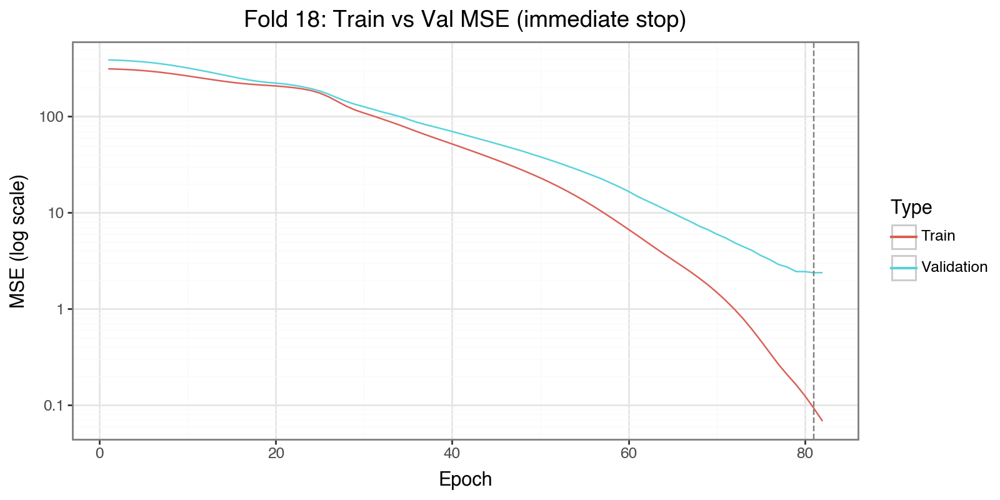

[Fold 19] Immediate stop at epoch 98


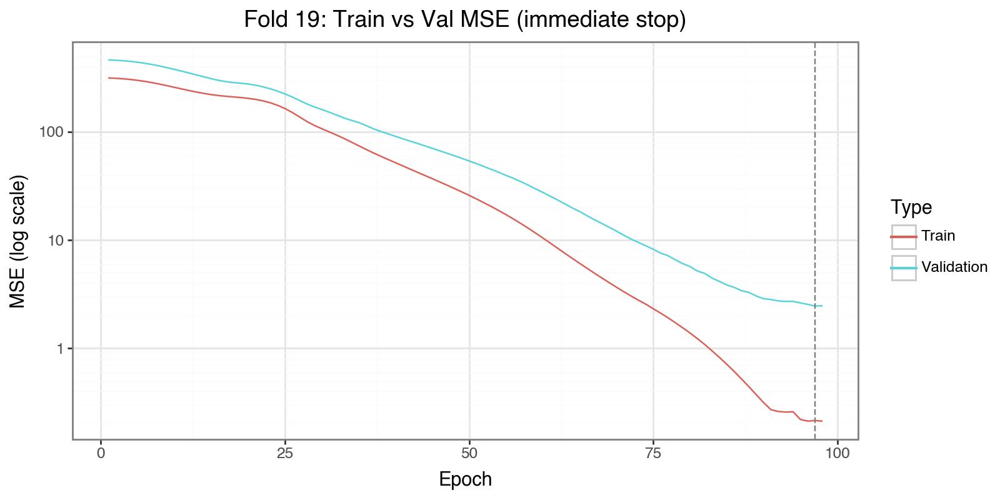

[Fold 20] Immediate stop at epoch 83


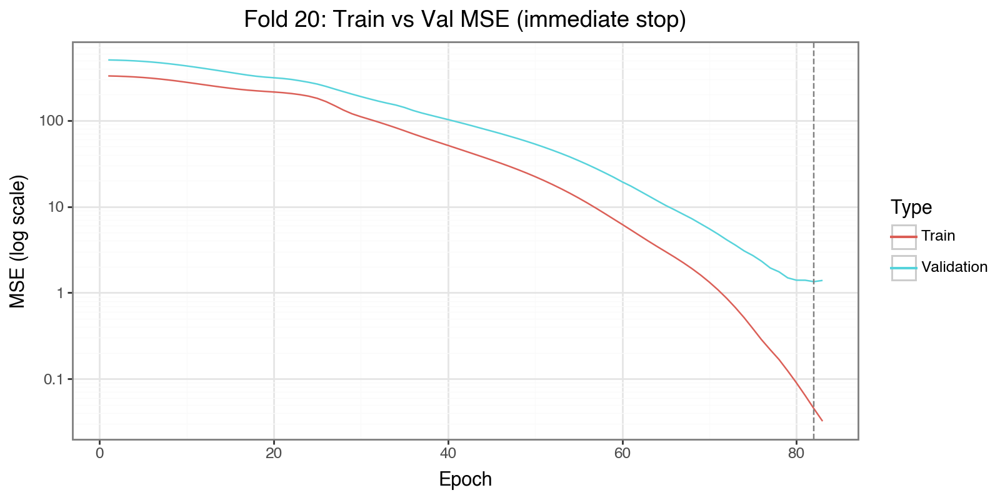

[Fold 21] Immediate stop at epoch 80


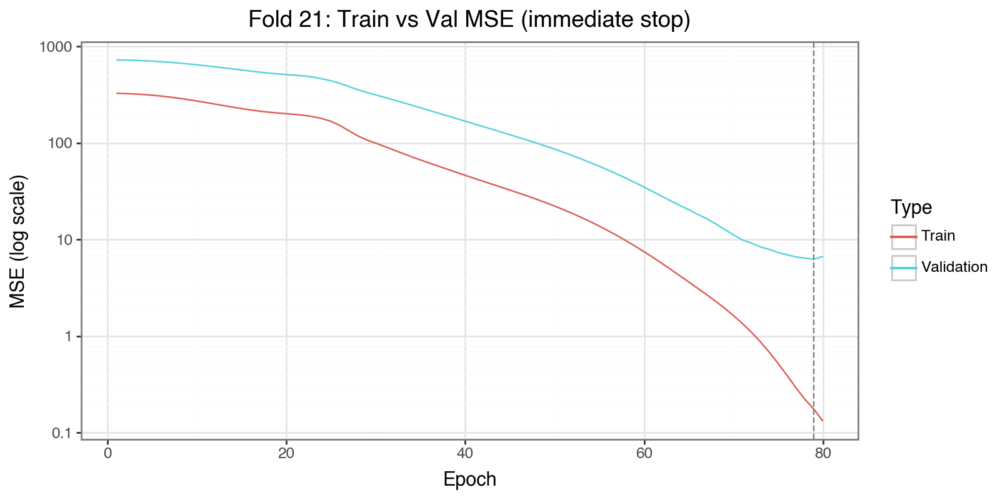

[Fold 22] Immediate stop at epoch 16


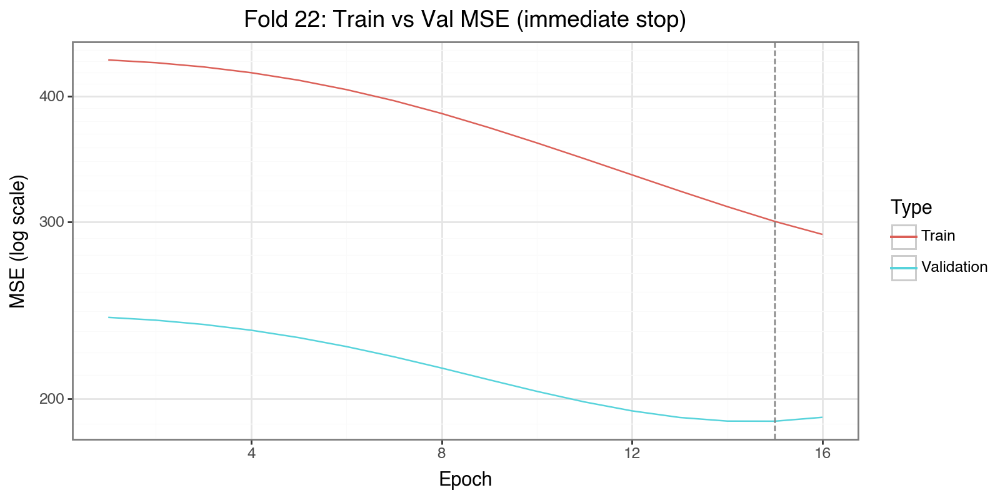

[Fold 23] Immediate stop at epoch 14


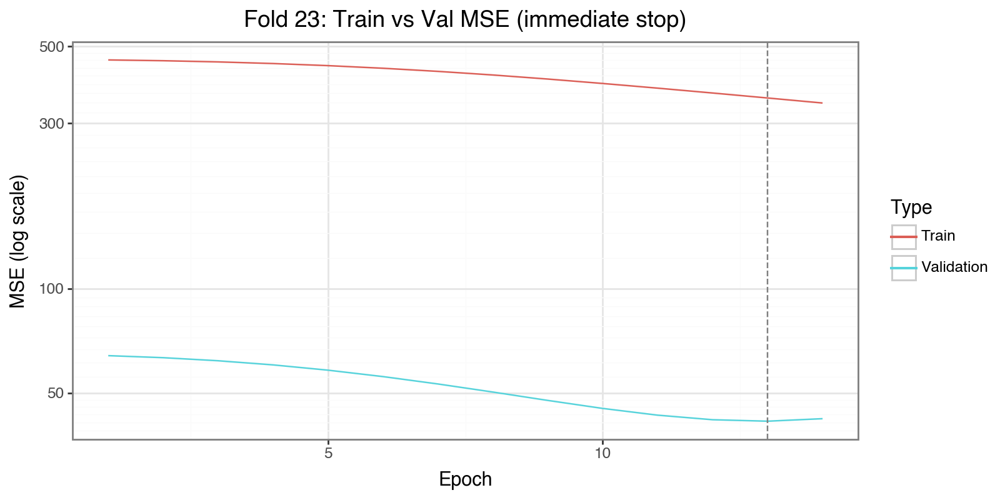

[Fold 24] Immediate stop at epoch 70


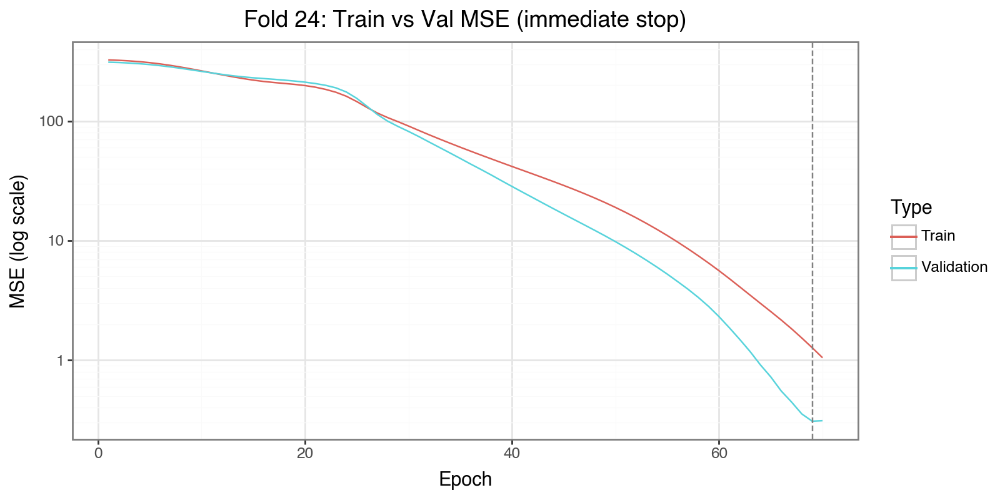

[Fold 25] Immediate stop at epoch 15


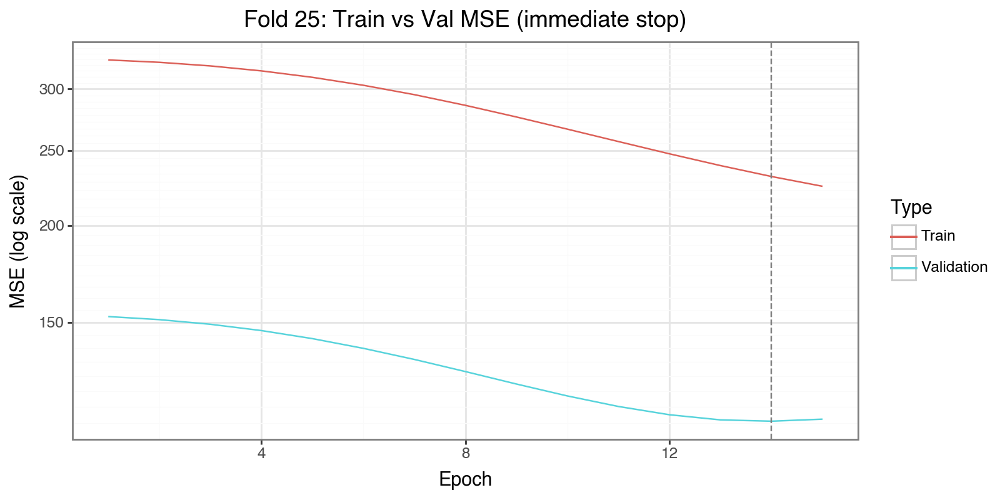

[Fold 26] Immediate stop at epoch 14


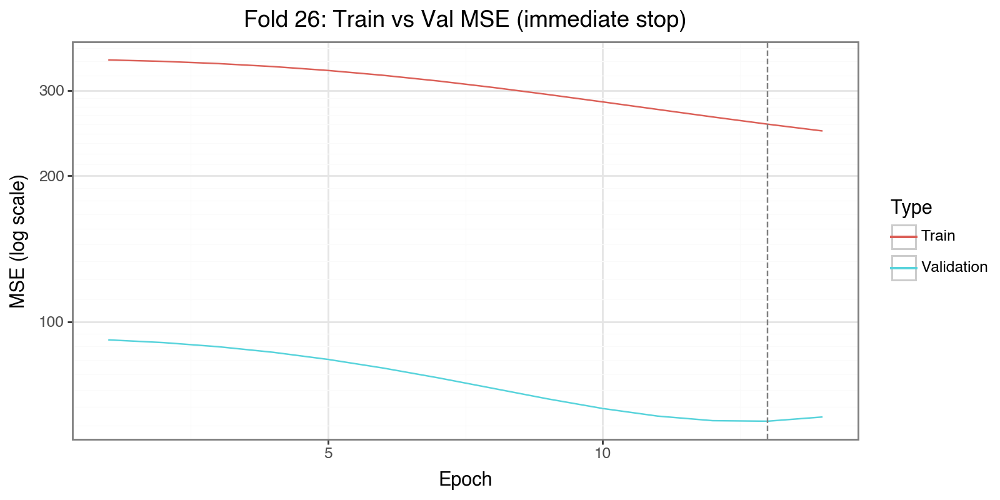

[Fold 27] Immediate stop at epoch 15


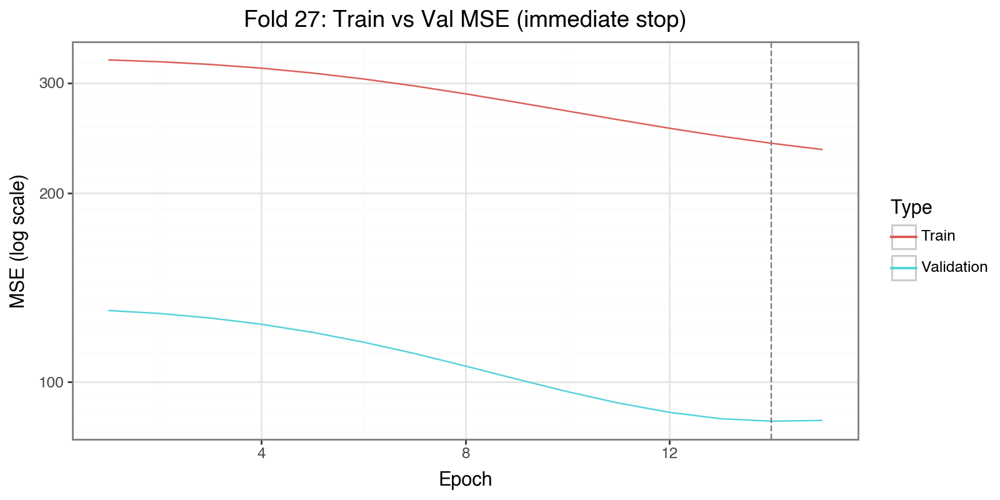

[Fold 28] Immediate stop at epoch 60


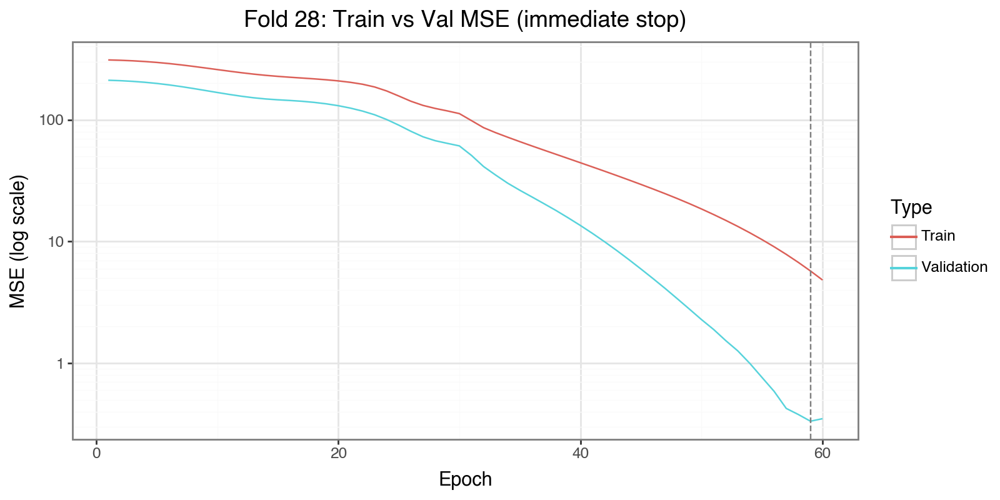

[Fold 29] Immediate stop at epoch 59


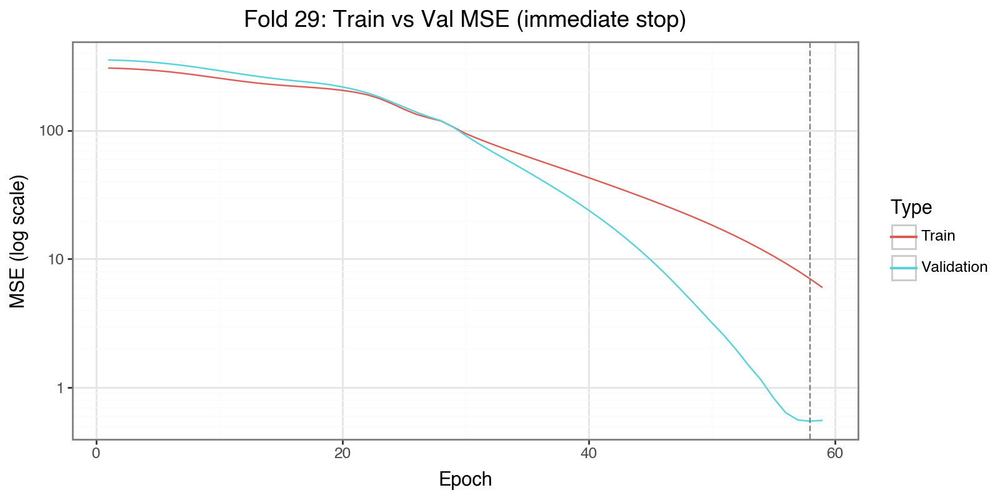

[Fold 30] Immediate stop at epoch 77


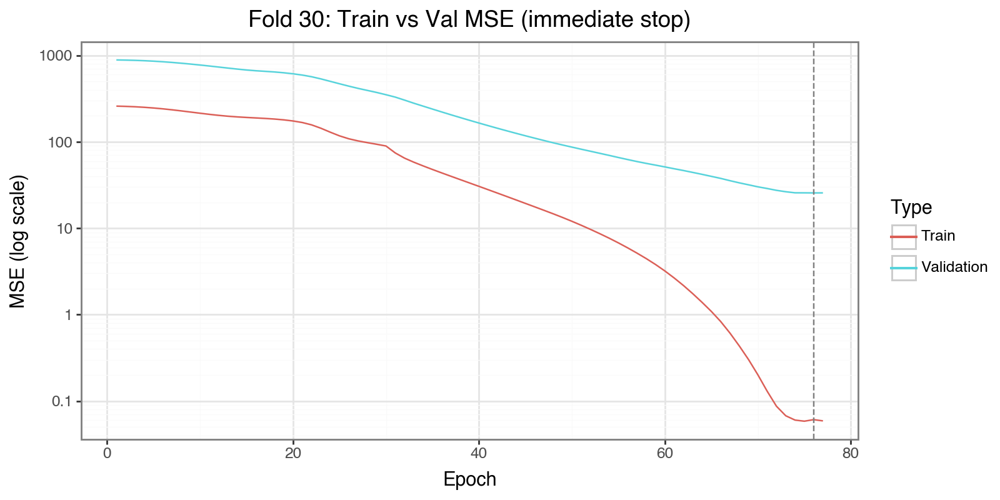

[Fold 31] Immediate stop at epoch 79


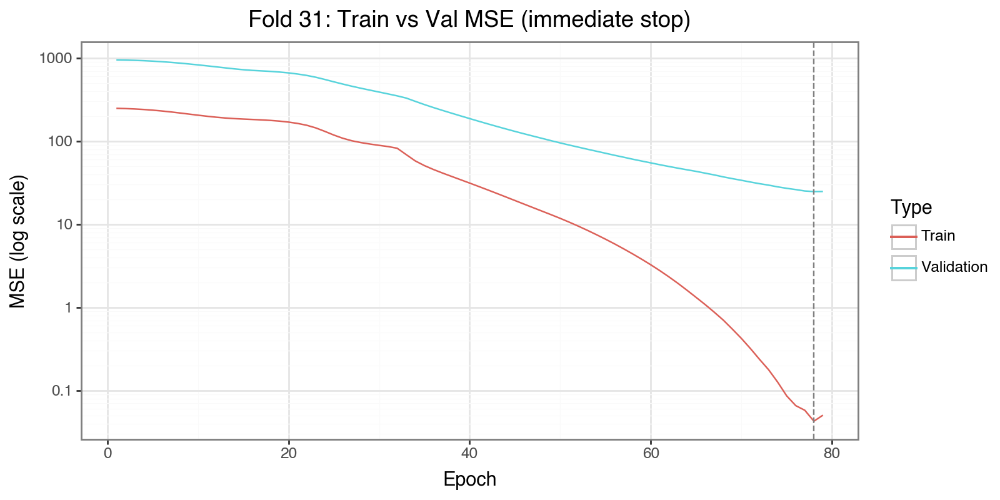

[Fold 32] Immediate stop at epoch 64


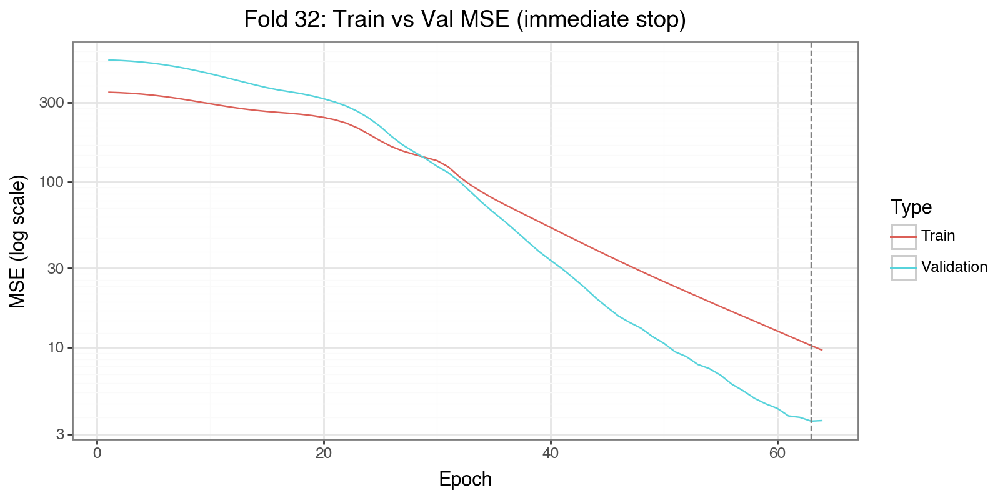

[Fold 33] Immediate stop at epoch 33


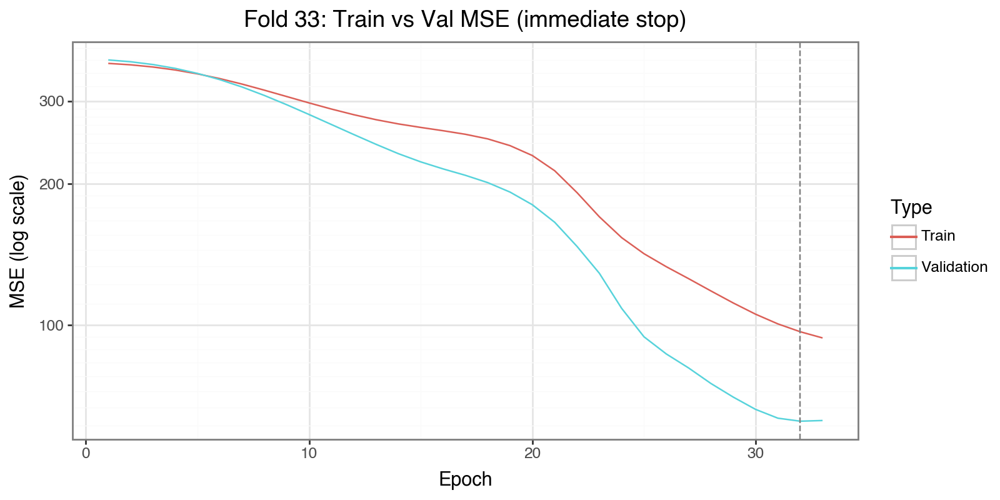

[Fold 34] Immediate stop at epoch 12


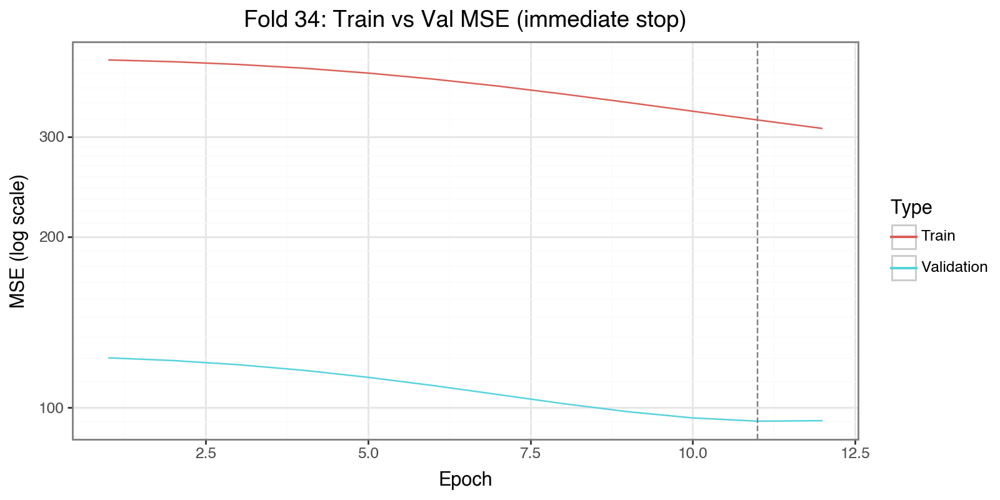

[Fold 35] Immediate stop at epoch 68


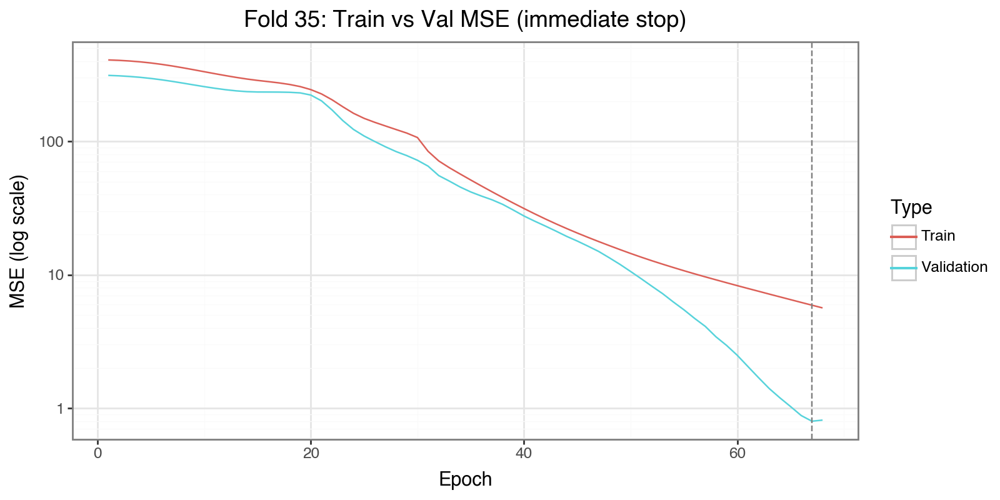

[Fold 36] Immediate stop at epoch 57


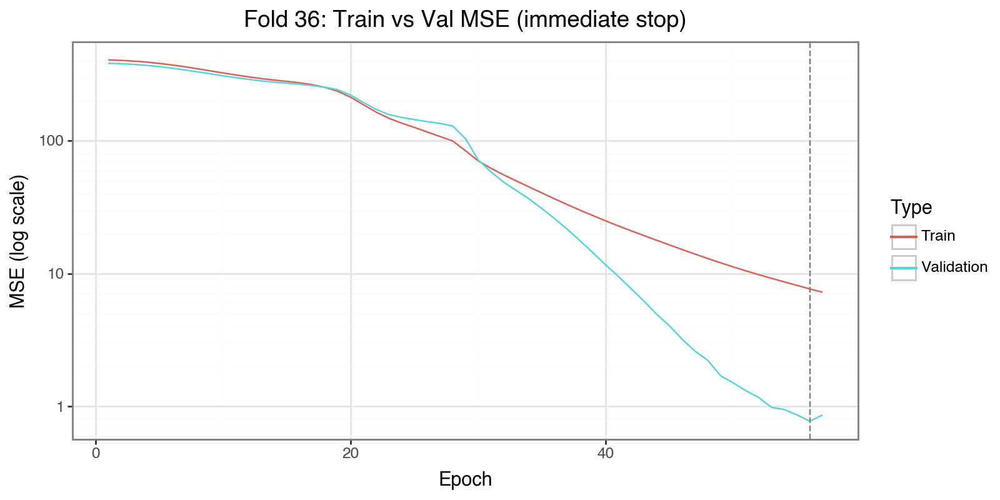

[Fold 37] Immediate stop at epoch 13


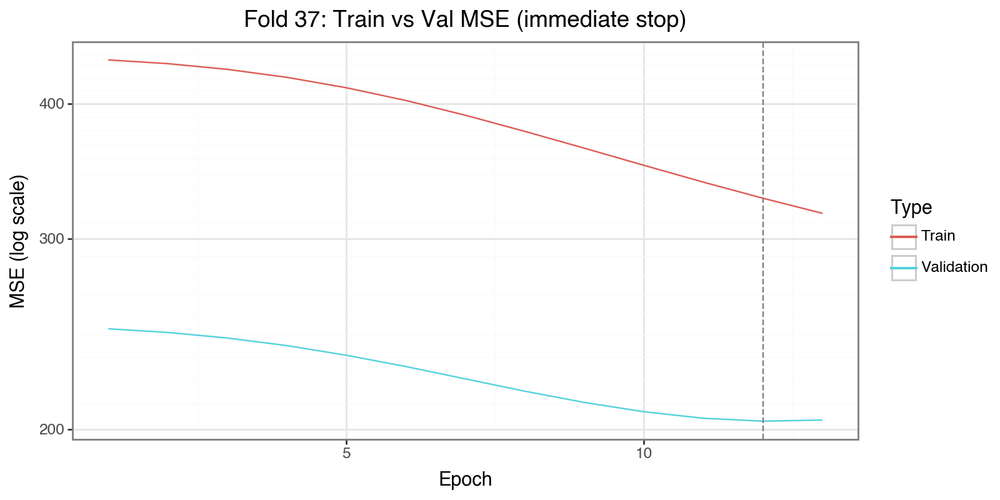

[Fold 38] Immediate stop at epoch 10


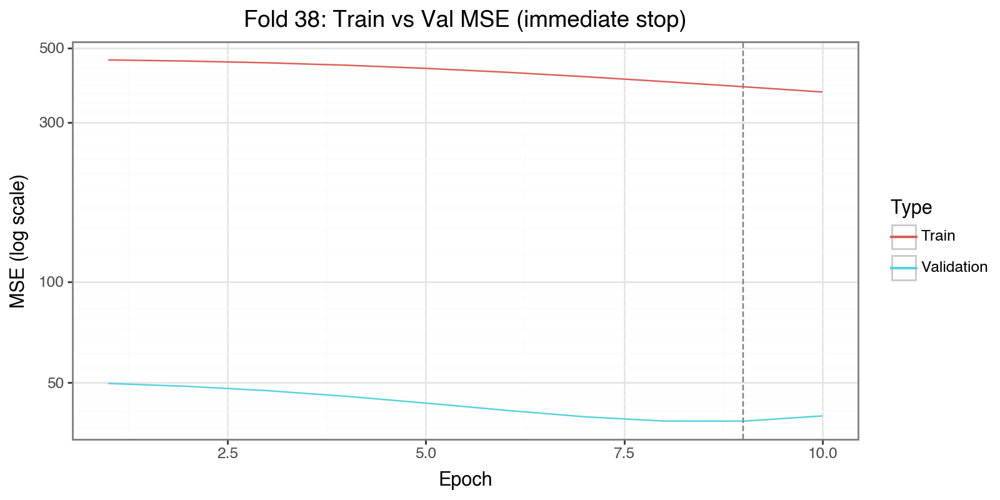

[Fold 39] Immediate stop at epoch 55


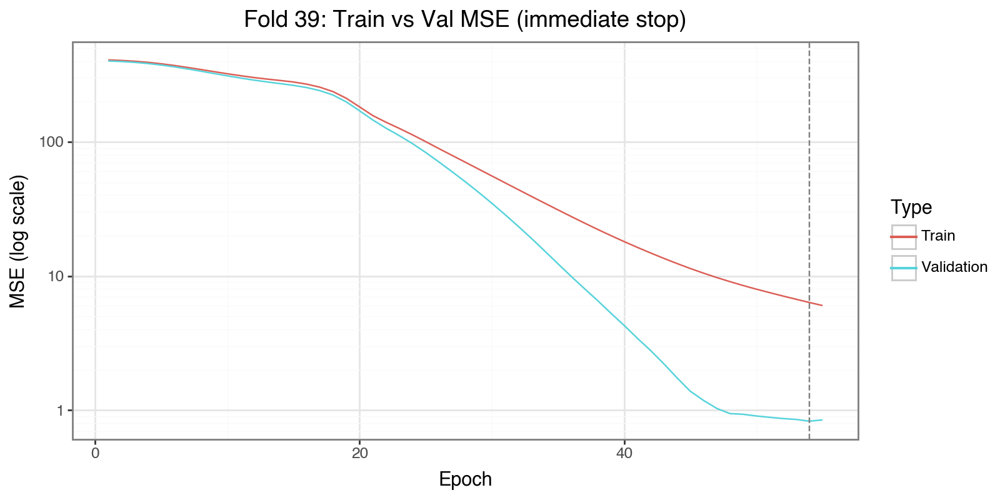

[Fold 40] Immediate stop at epoch 50


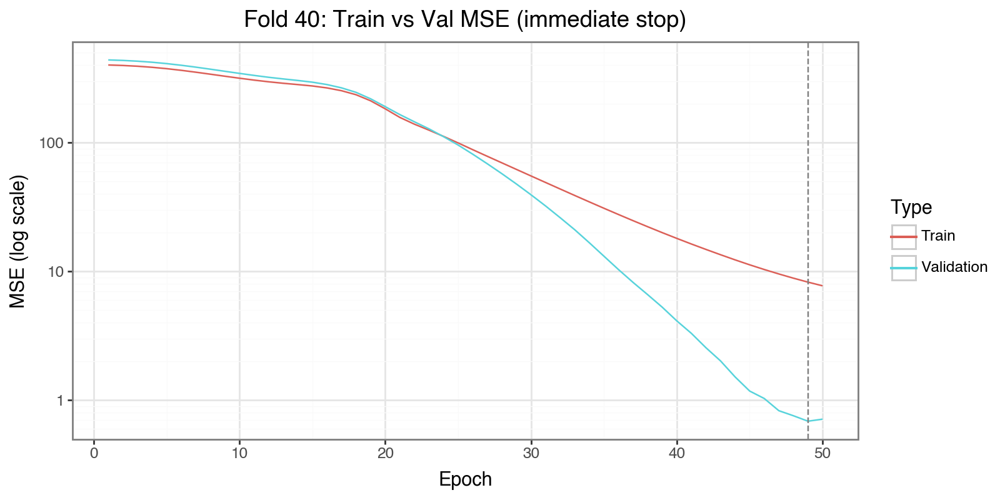

[Fold 41] Immediate stop at epoch 51


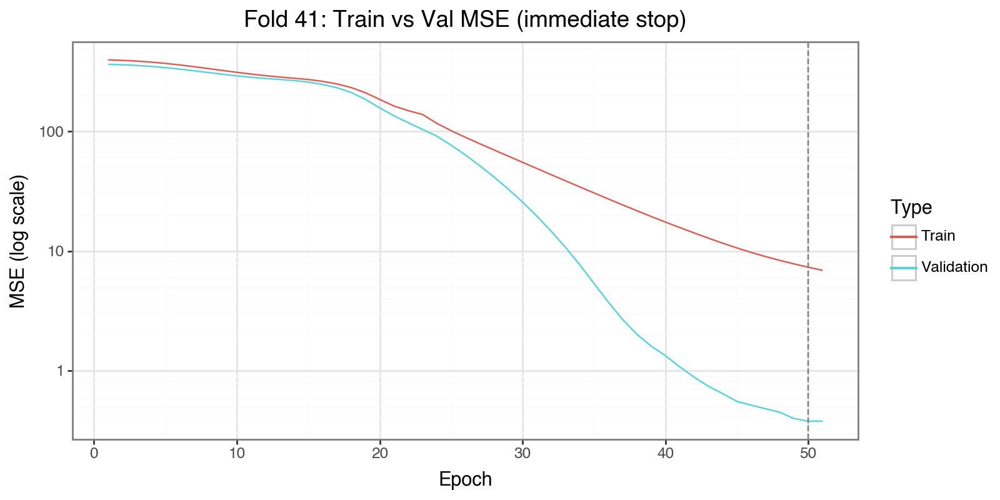

[Fold 42] Immediate stop at epoch 58


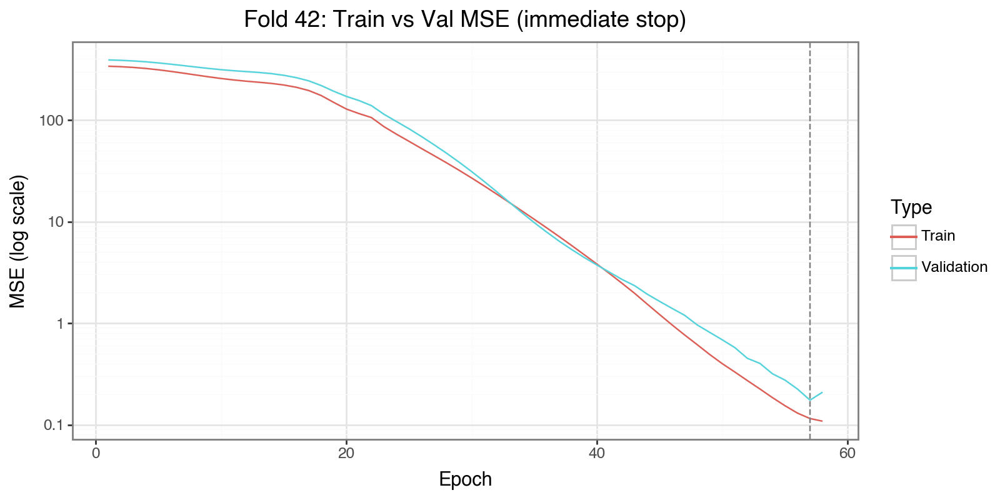

[Fold 43] Immediate stop at epoch 58


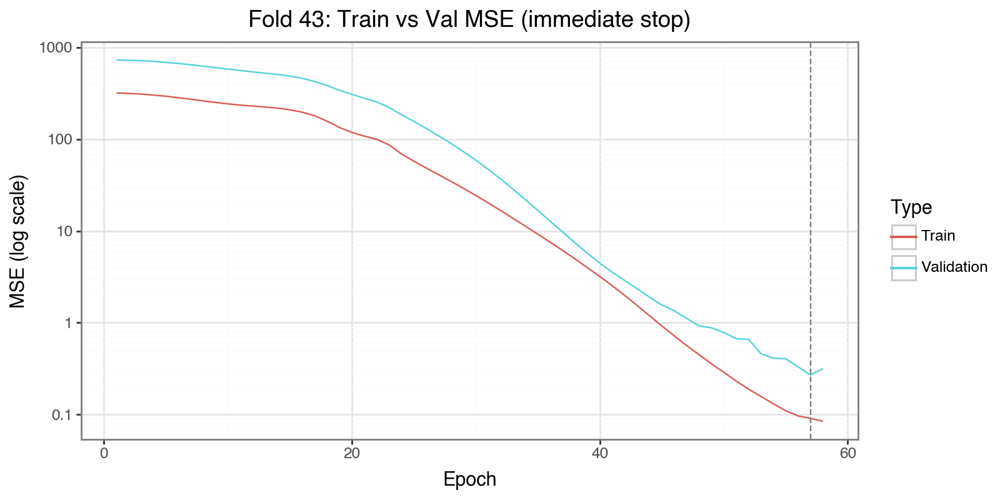

[Fold 44] Immediate stop at epoch 60


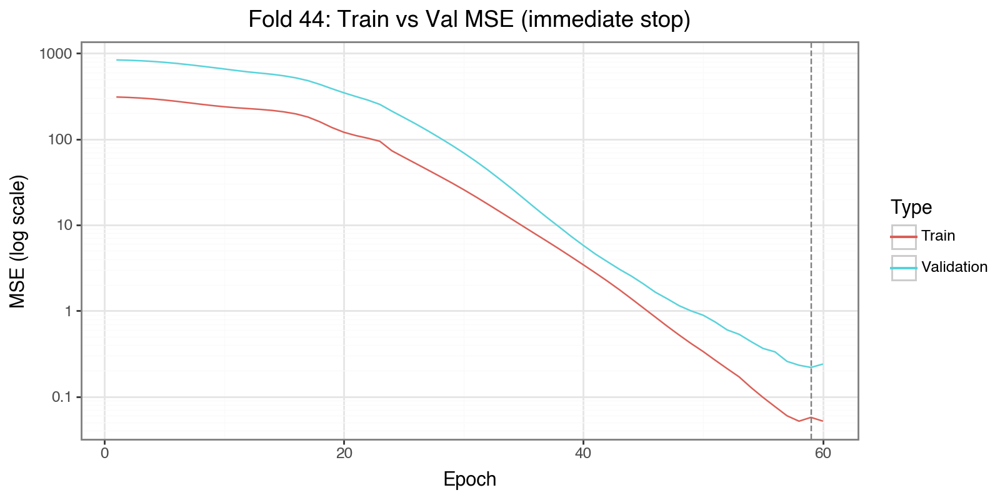

[Fold 45] Immediate stop at epoch 52


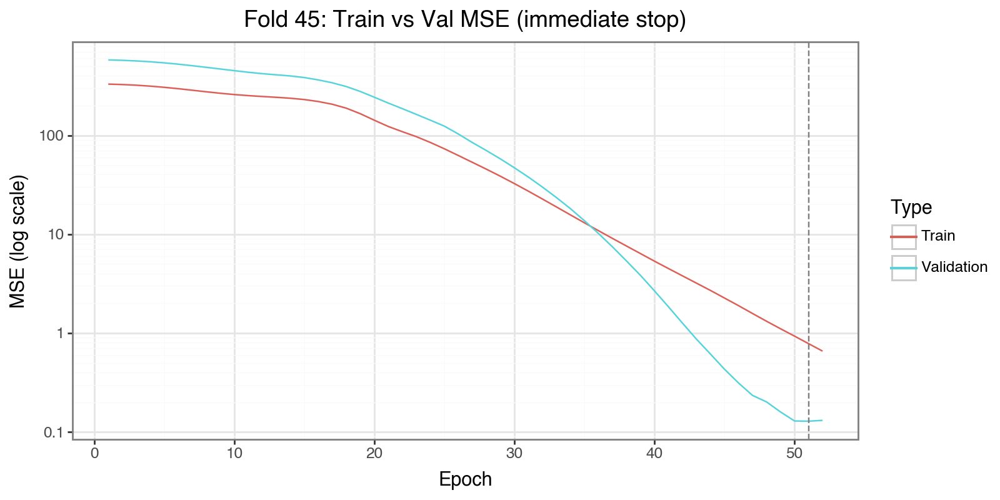

[Fold 46] Immediate stop at epoch 11


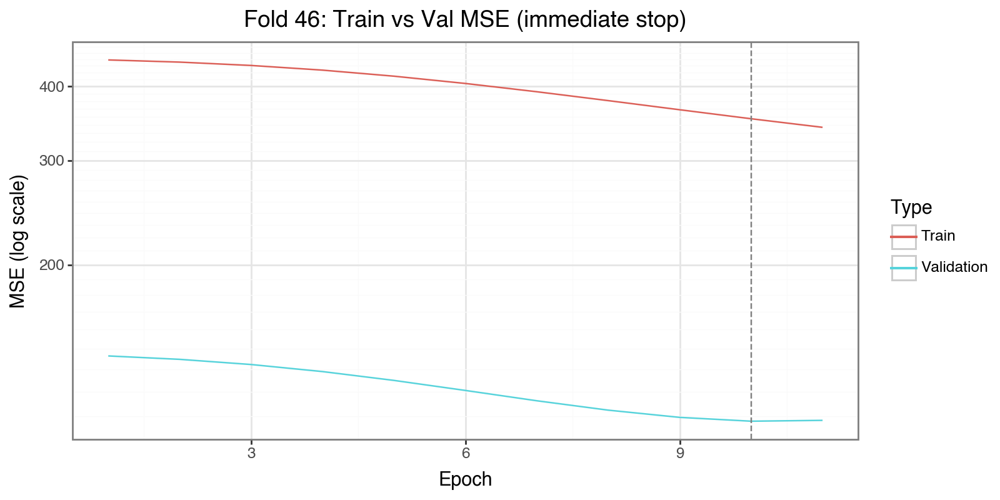

[Fold 47] Immediate stop at epoch 8


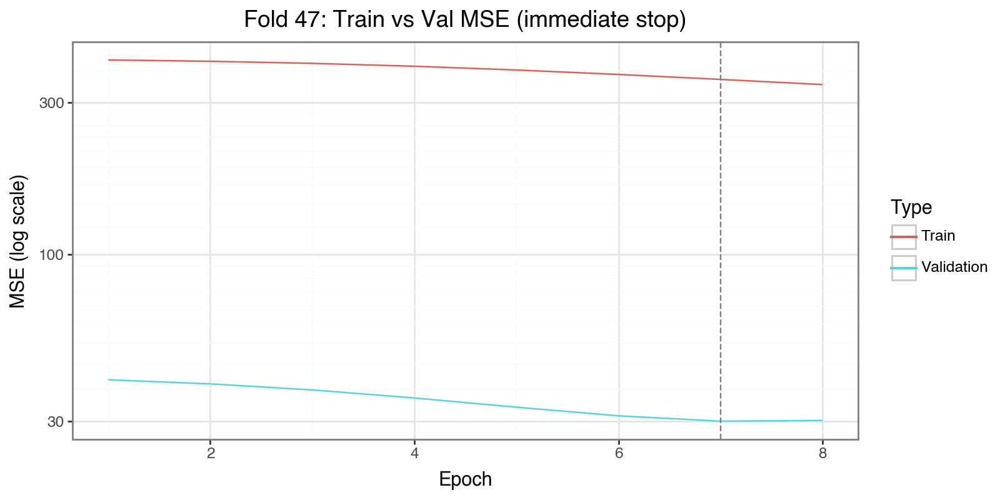

[Fold 48] Immediate stop at epoch 12


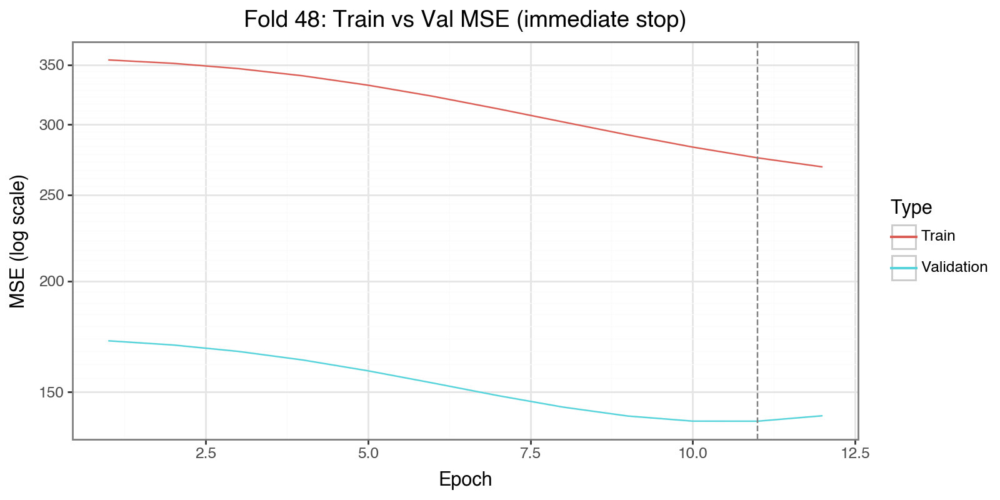

[Fold 49] Immediate stop at epoch 12


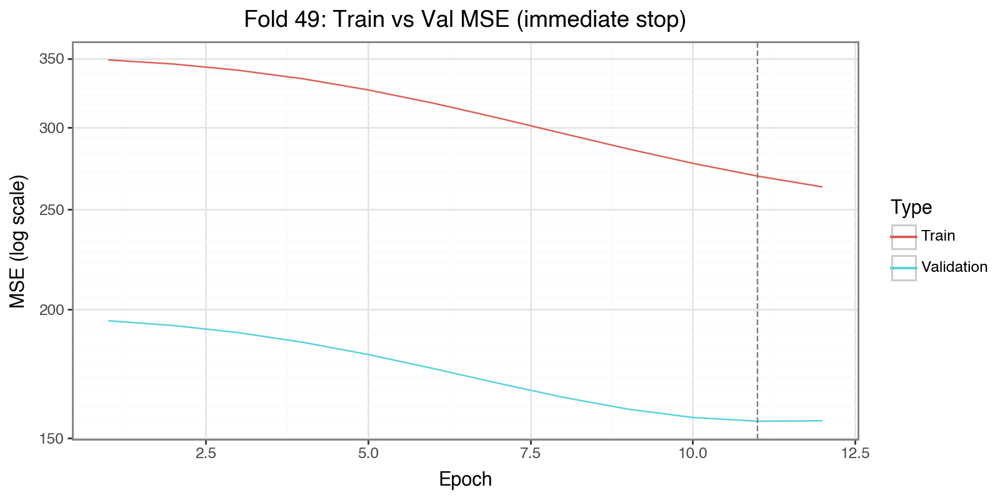

[Fold 50] Immediate stop at epoch 11


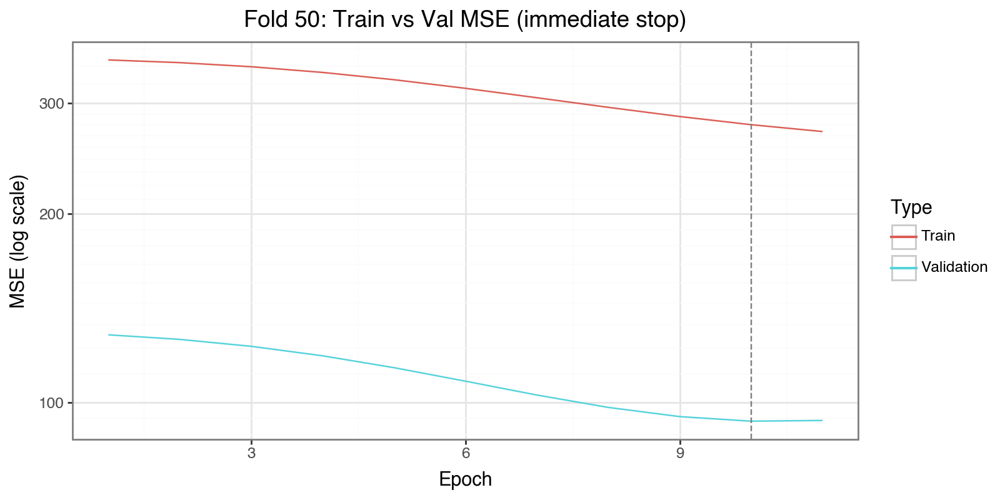

[Fold 51] Immediate stop at epoch 56


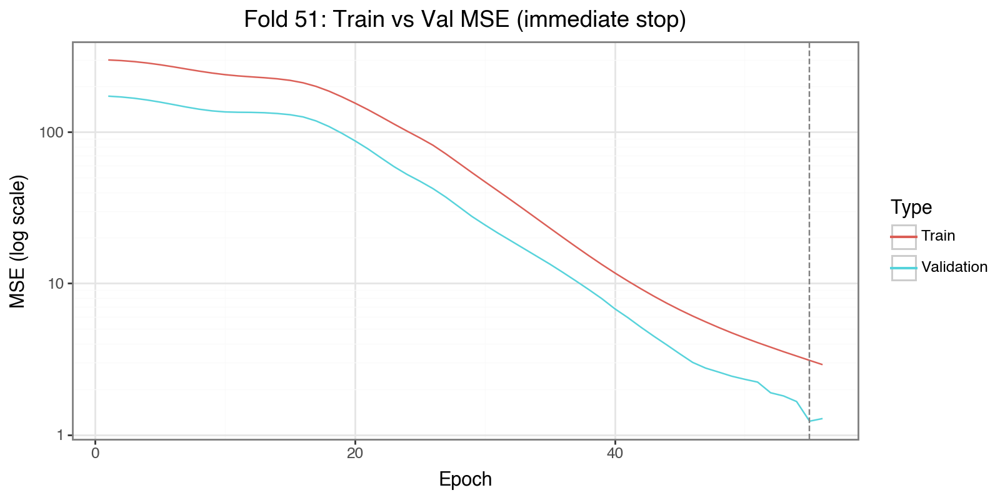

[Fold 52] Immediate stop at epoch 54


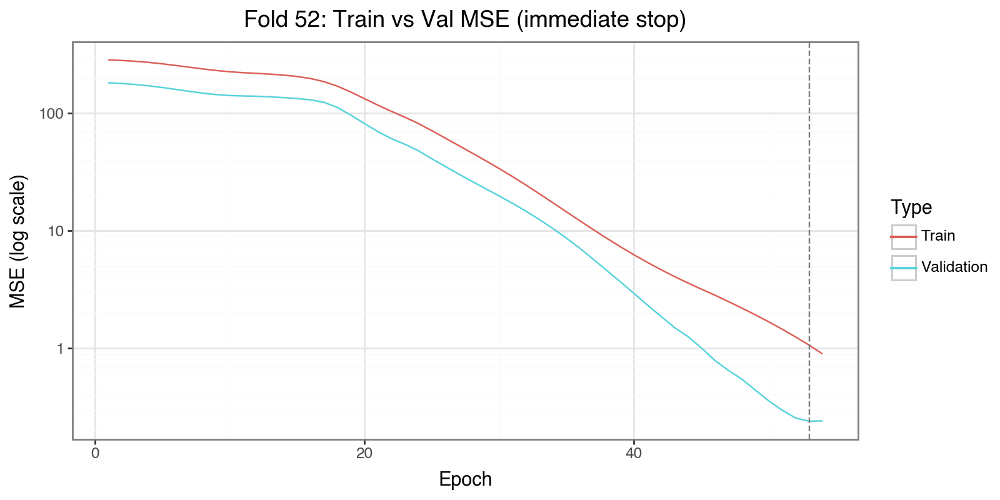

[Fold 53] Immediate stop at epoch 11


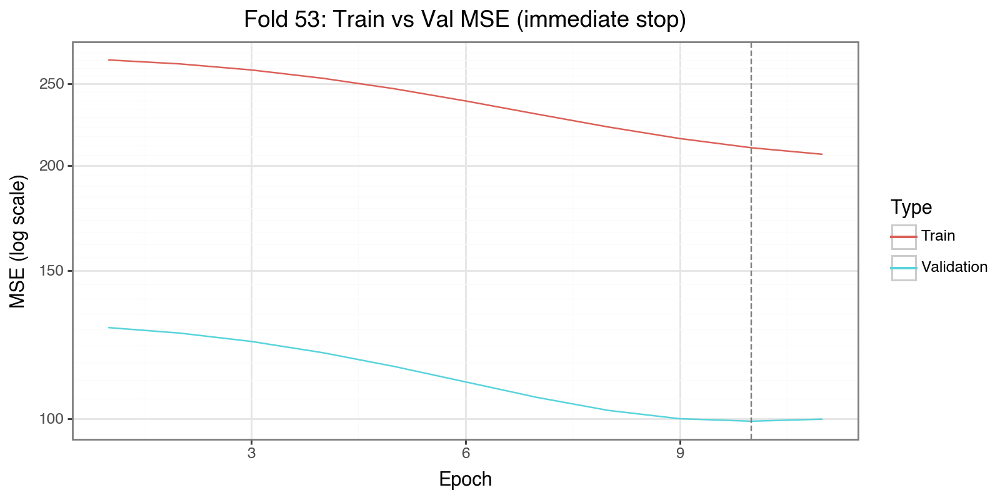

[Fold 54] Immediate stop at epoch 46


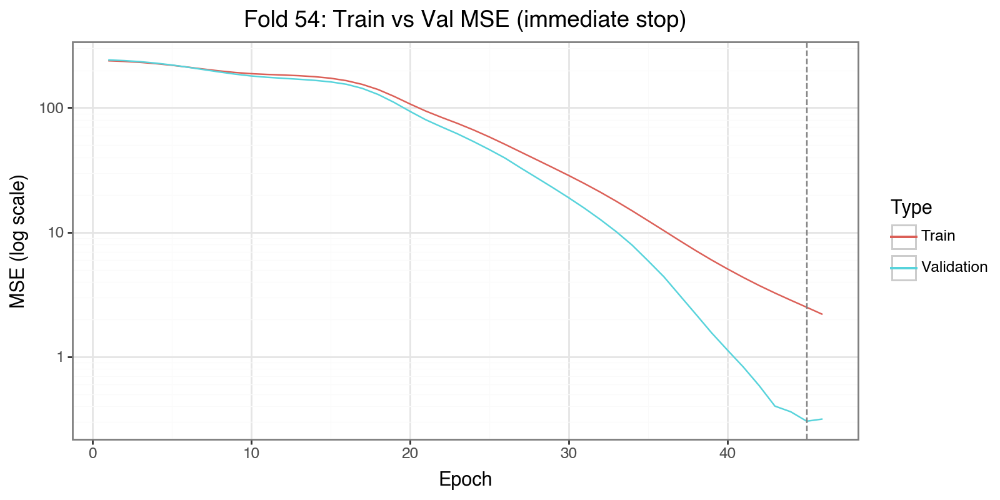

[Fold 55] Immediate stop at epoch 49


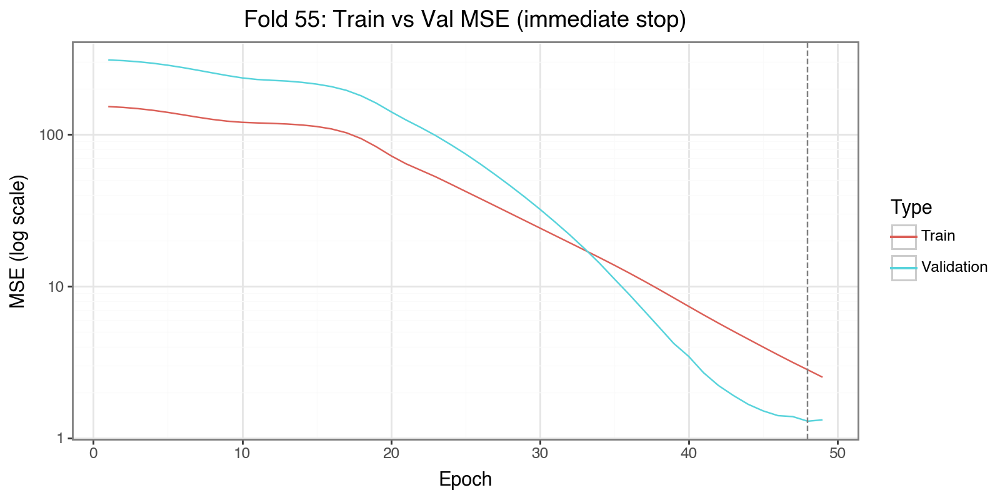

[Fold 56] Immediate stop at epoch 70


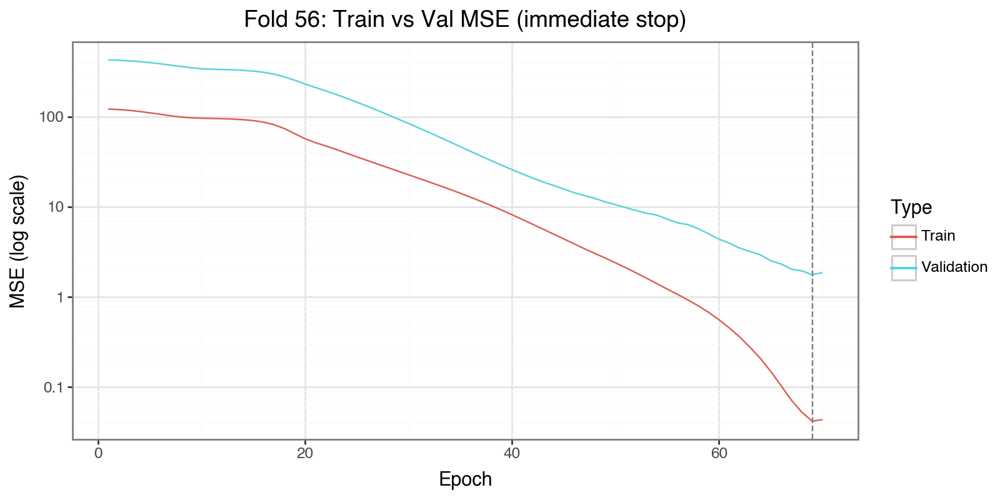

[Fold 57] Immediate stop at epoch 62


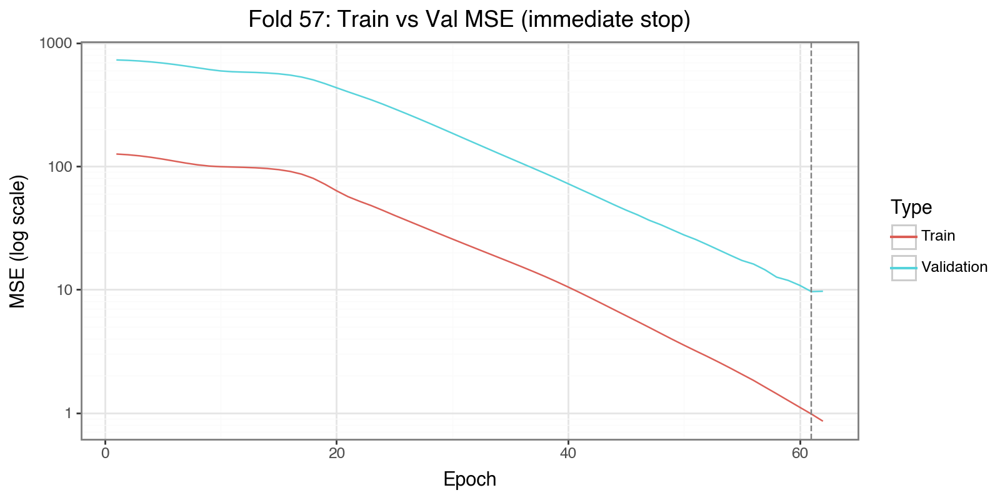

[Fold 58] Immediate stop at epoch 75


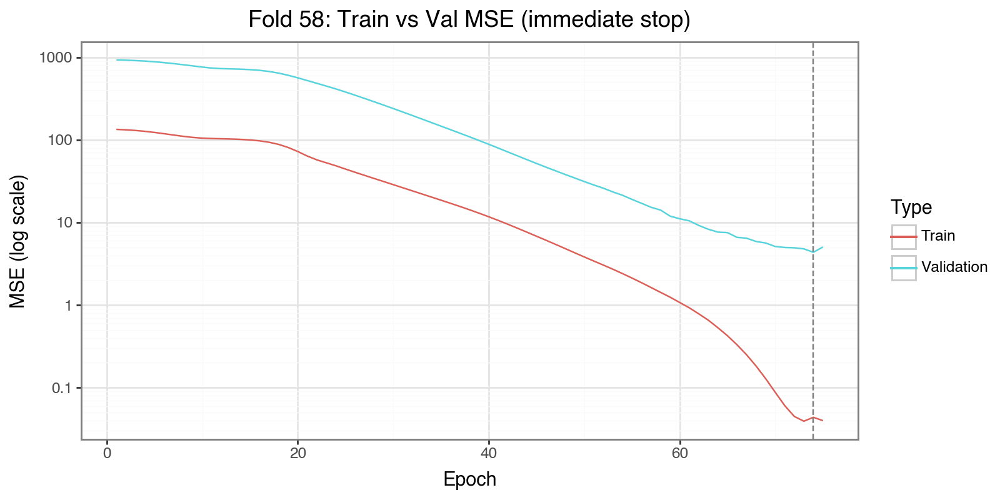

[Fold 59] Immediate stop at epoch 74


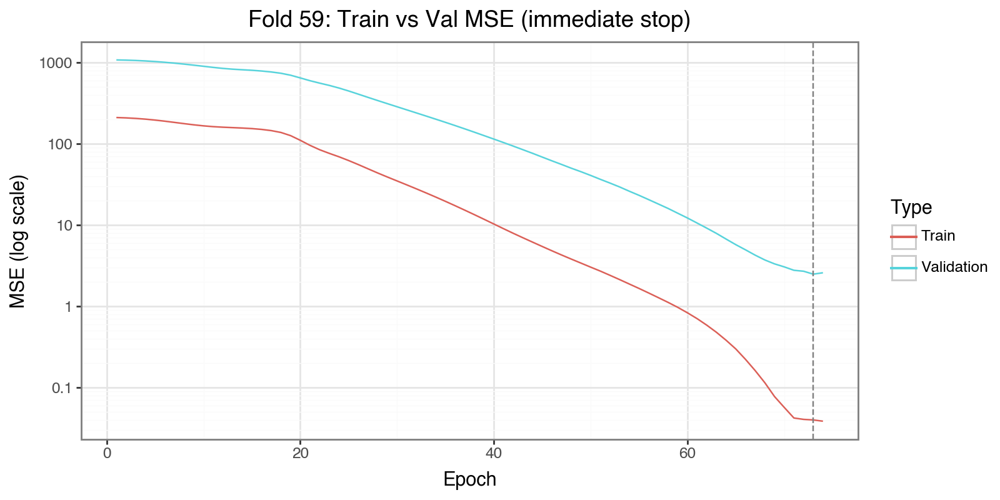

[Fold 60] Immediate stop at epoch 83


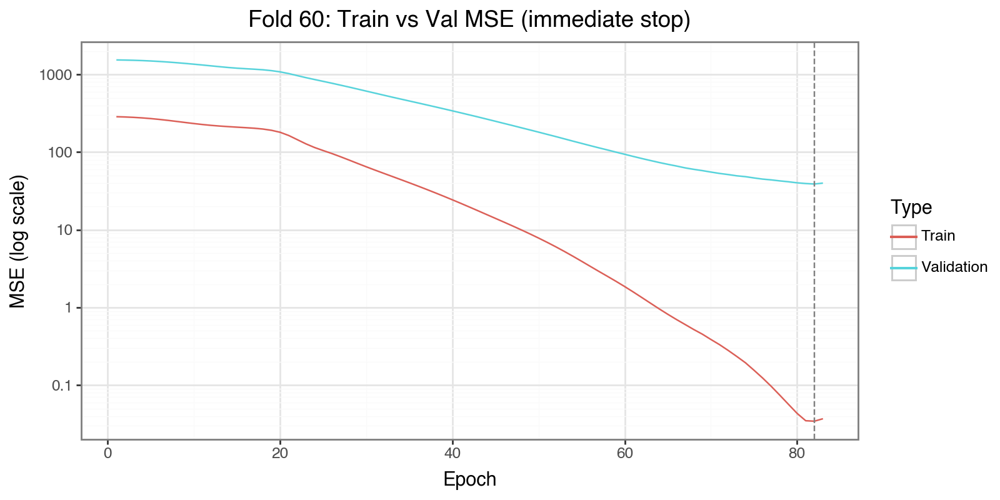

[Fold 61] Immediate stop at epoch 85


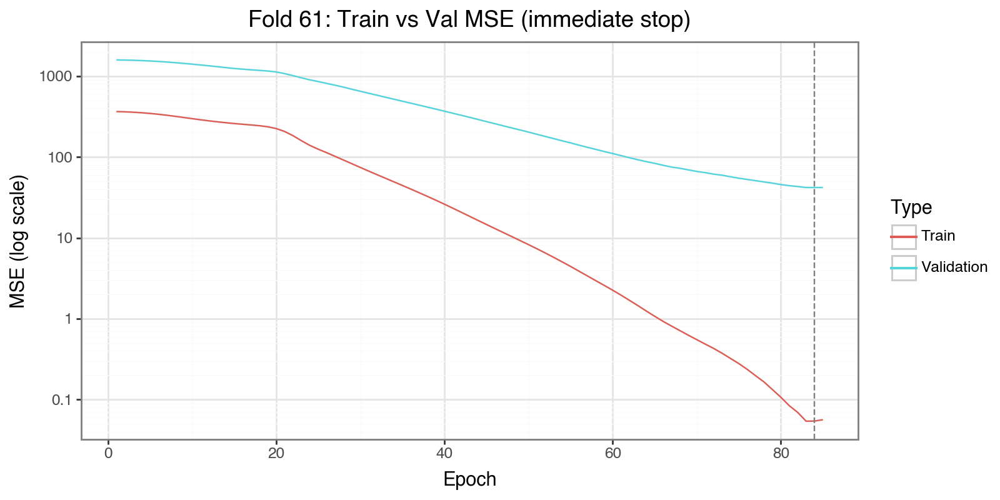

[Fold 62] Immediate stop at epoch 28


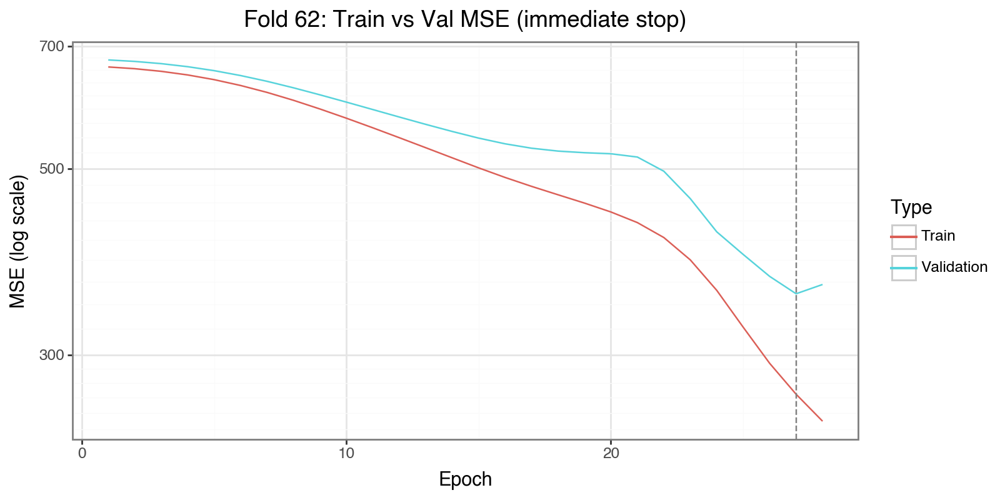

[Fold 63] Immediate stop at epoch 84


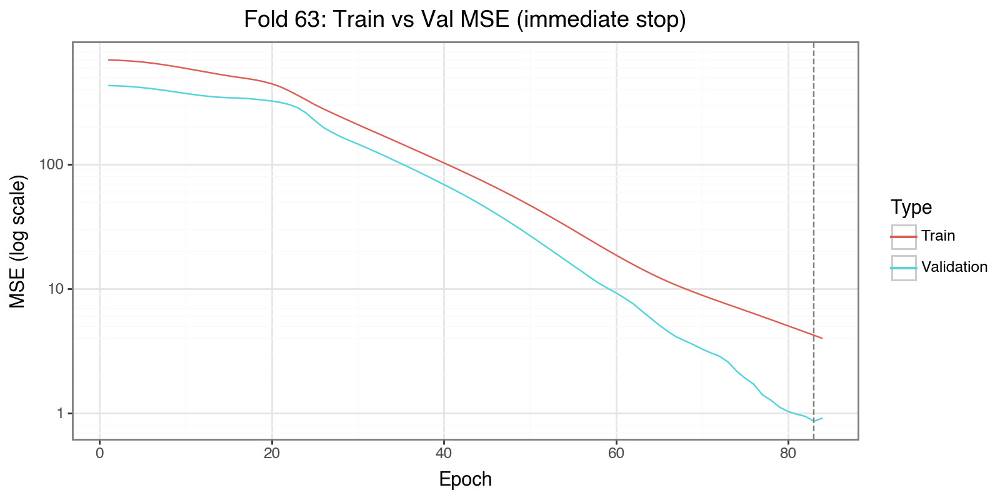

[Fold 64] Immediate stop at epoch 12


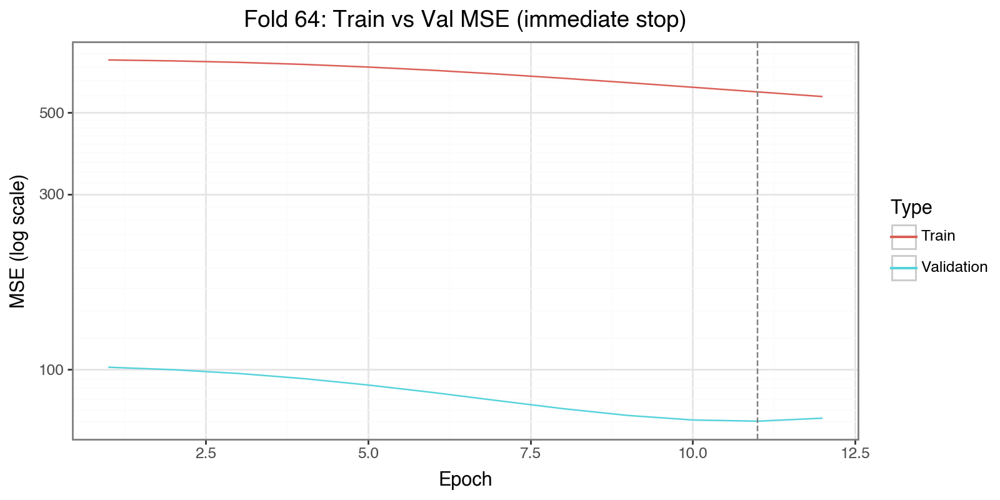

[Fold 65] Immediate stop at epoch 12


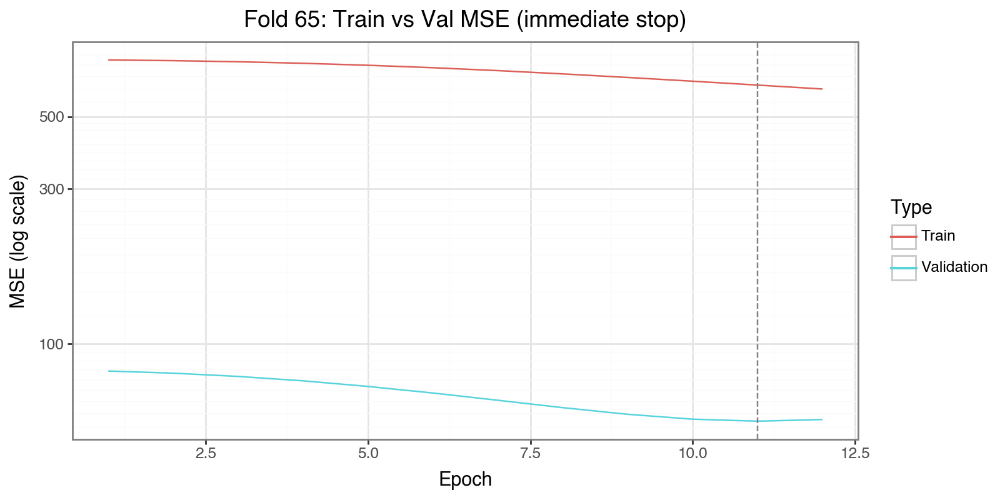

[Fold 66] Immediate stop at epoch 11


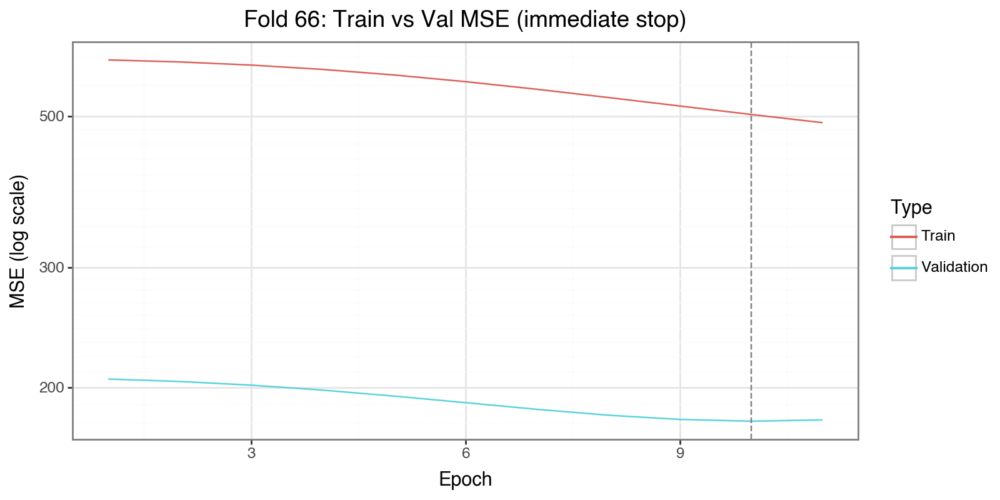

[Fold 67] Immediate stop at epoch 11


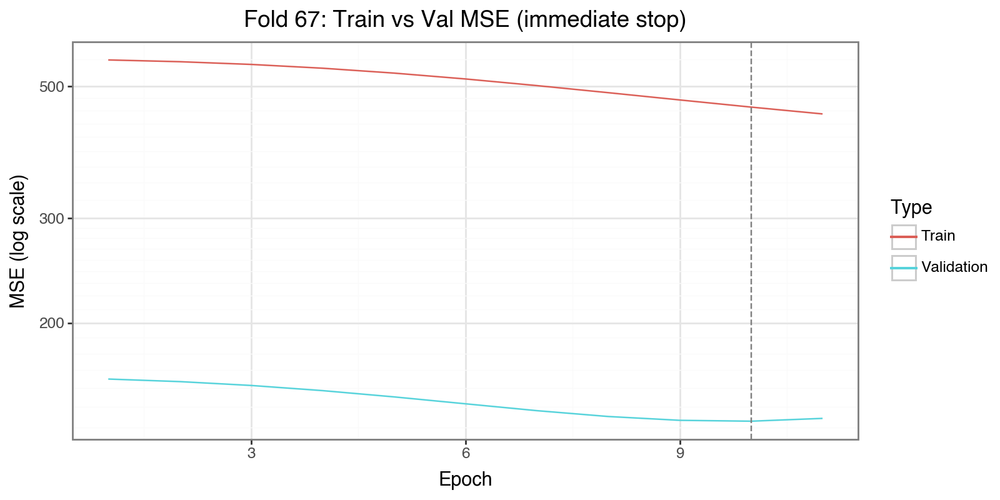

[Fold 68] Immediate stop at epoch 10


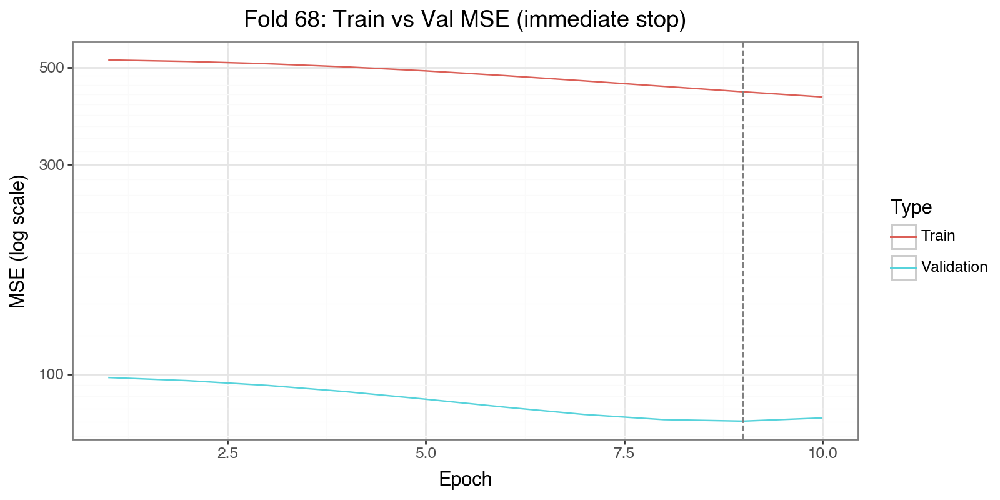

[Fold 69] Immediate stop at epoch 99


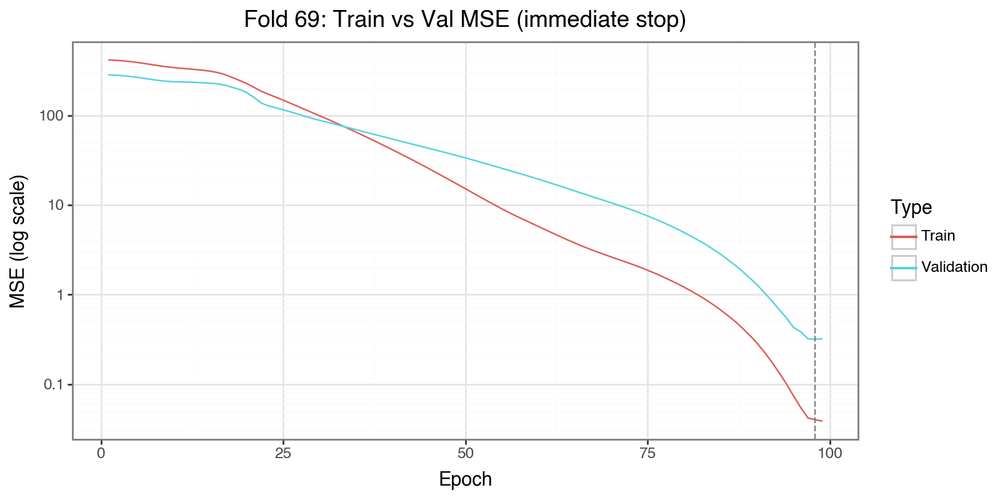

[Fold 70] Immediate stop at epoch 97


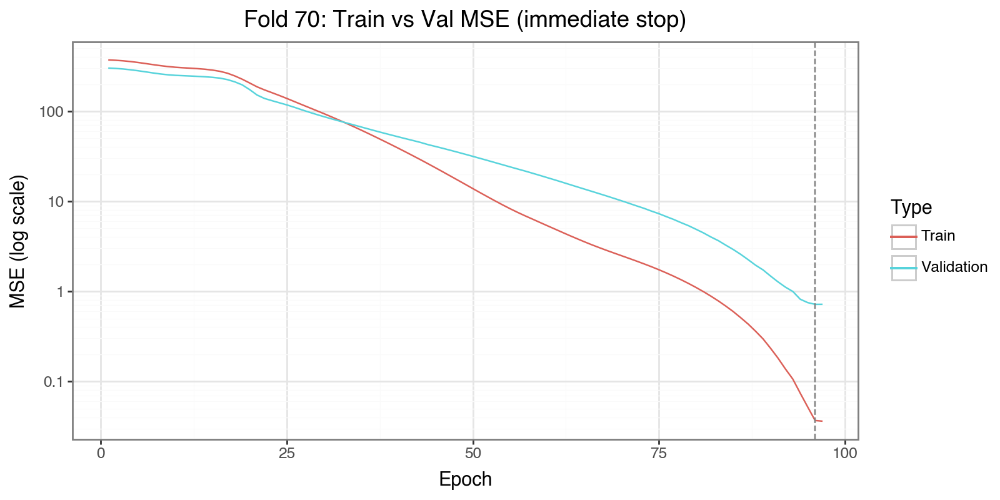

[Fold 71] Immediate stop at epoch 53


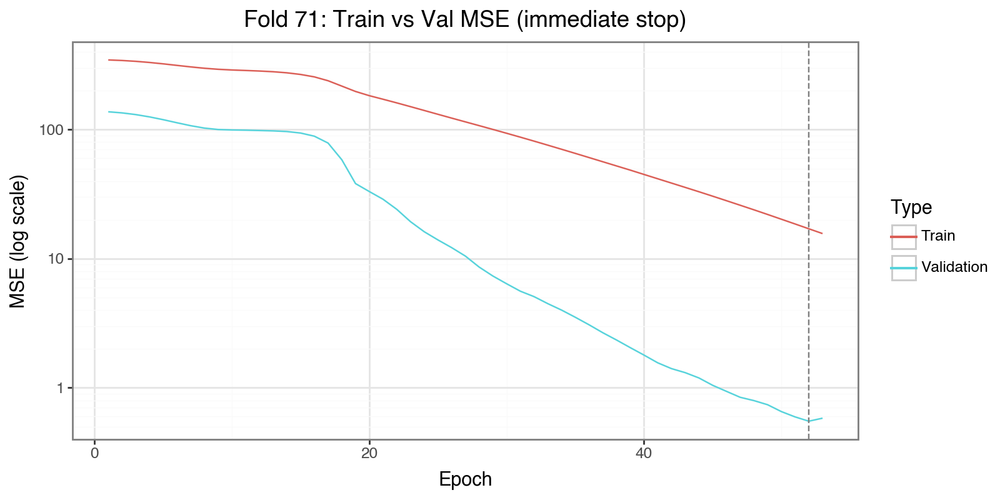

[Fold 72] Immediate stop at epoch 47


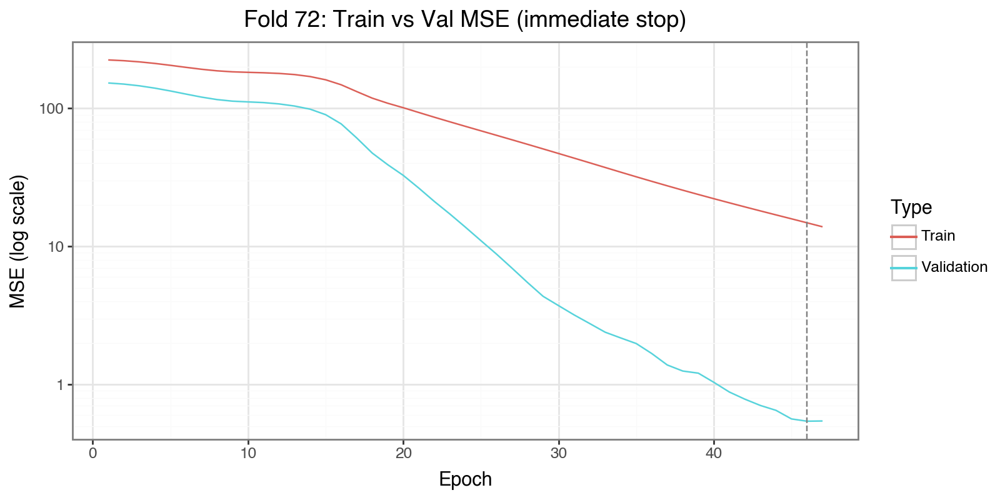

[Fold 73] Immediate stop at epoch 58


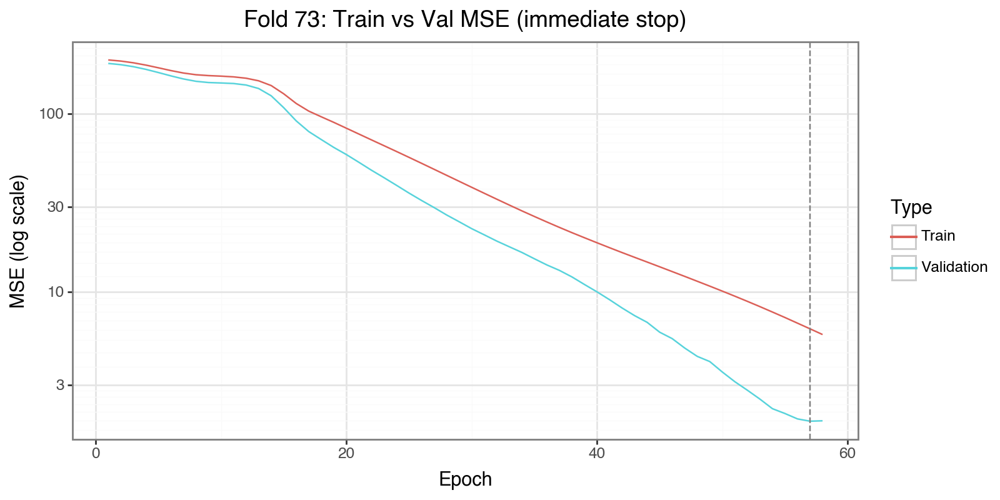

[Fold 74] Immediate stop at epoch 62


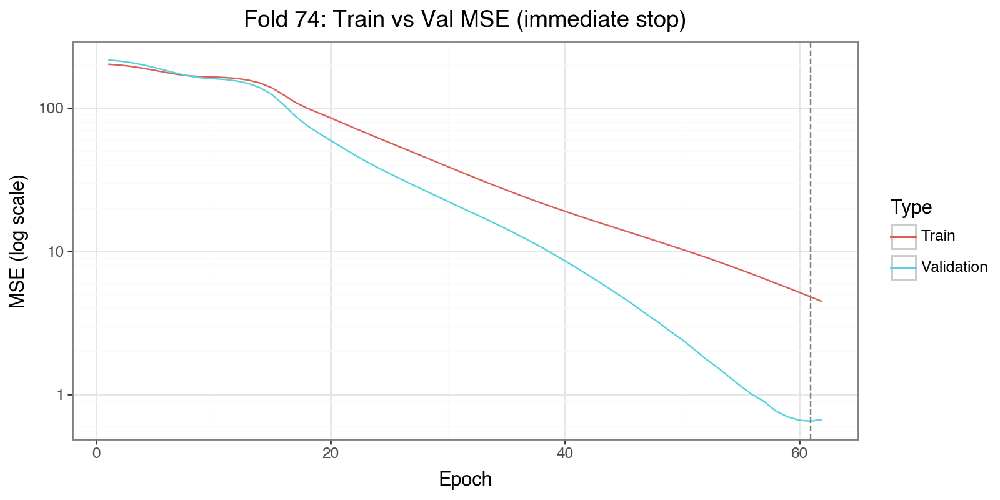

[Fold 75] Immediate stop at epoch 89


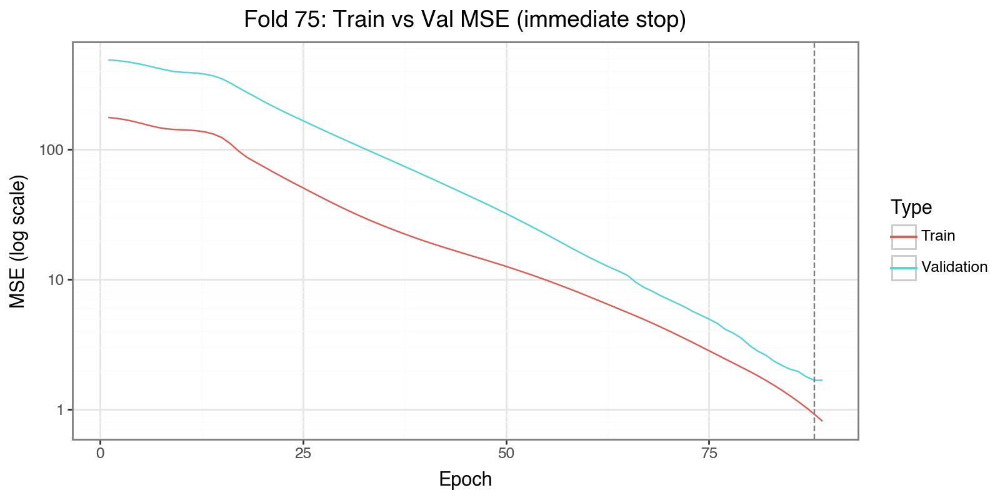

[Fold 76] Immediate stop at epoch 67


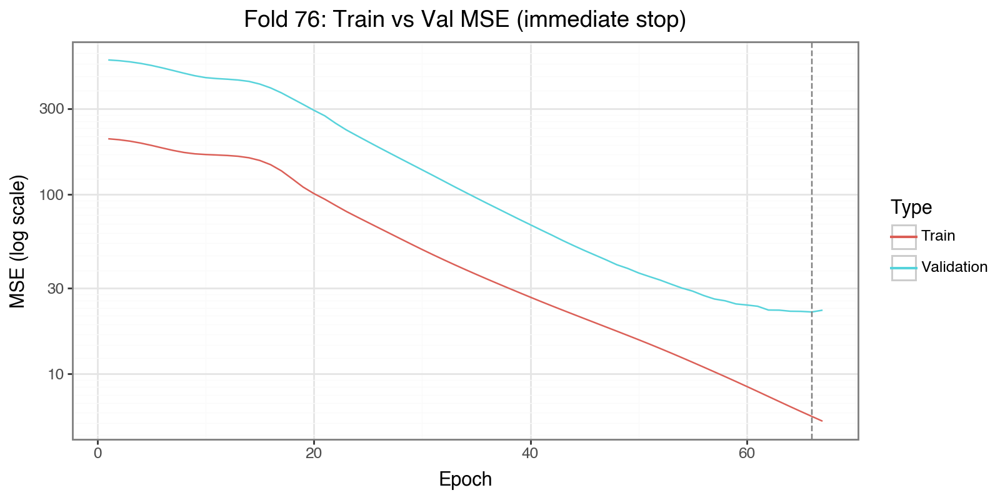

[Fold 77] Immediate stop at epoch 67


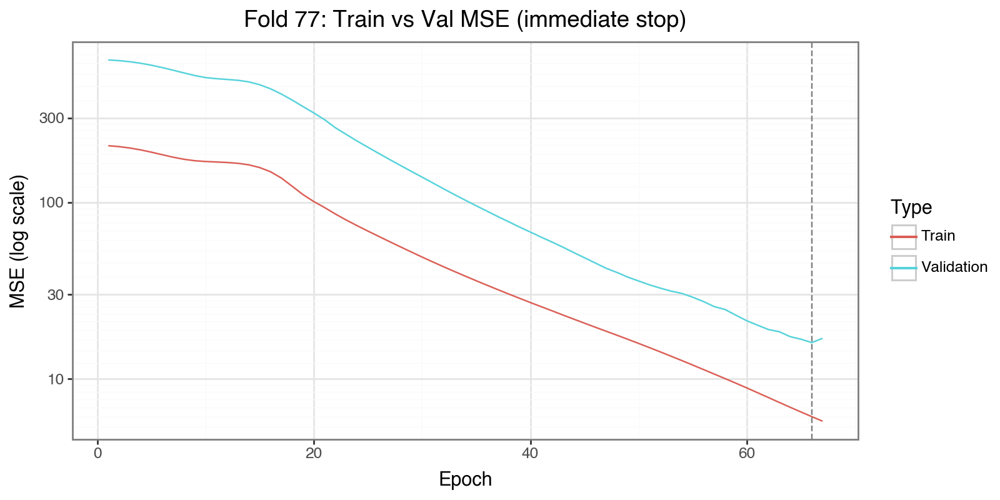

[Fold 78] Immediate stop at epoch 93


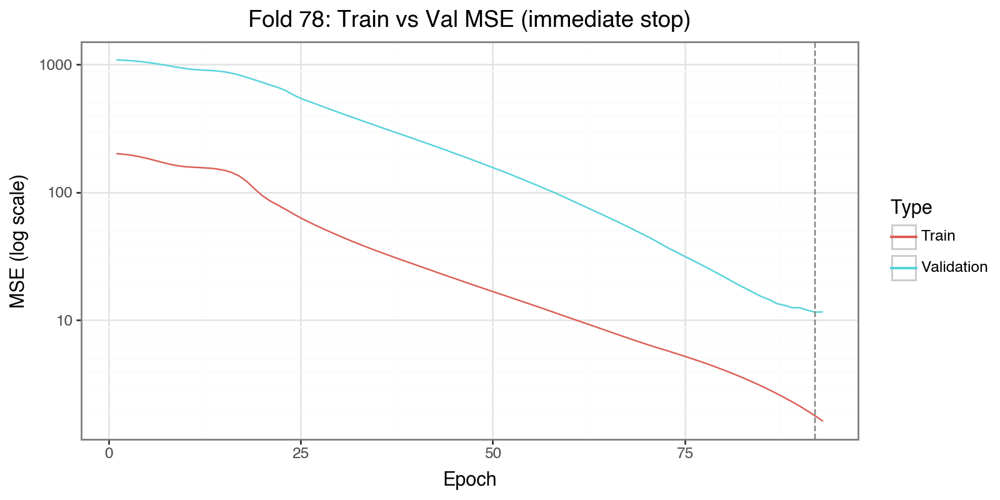

[Fold 79] Immediate stop at epoch 88


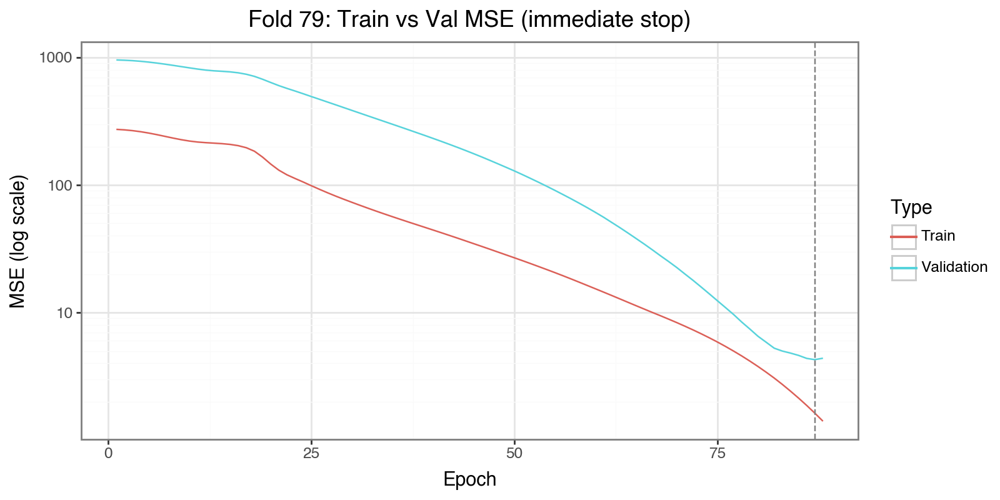

[Fold 80] Immediate stop at epoch 86


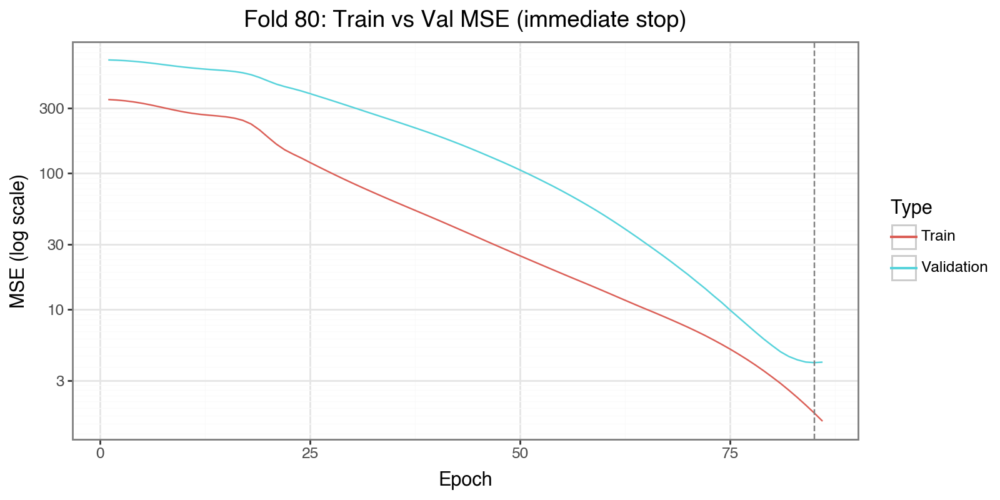

[Fold 81] Immediate stop at epoch 77


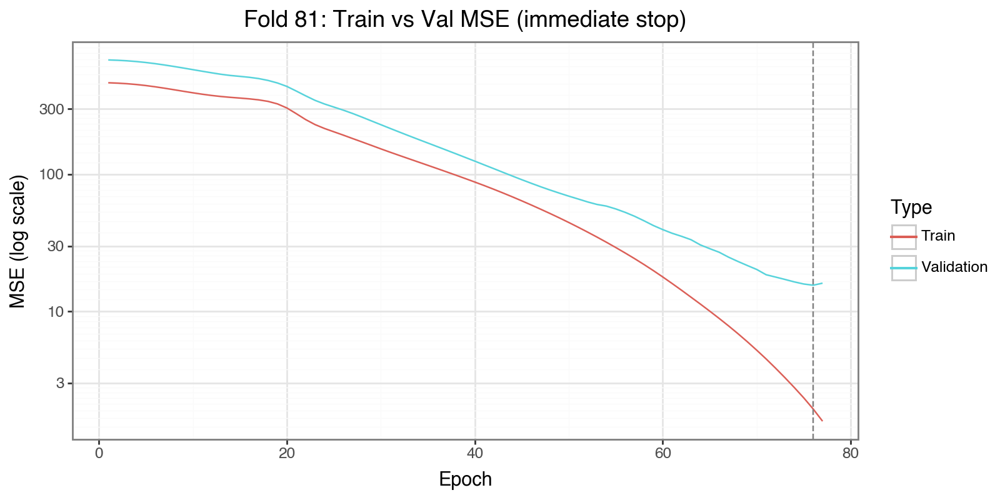

[Fold 82] Immediate stop at epoch 74


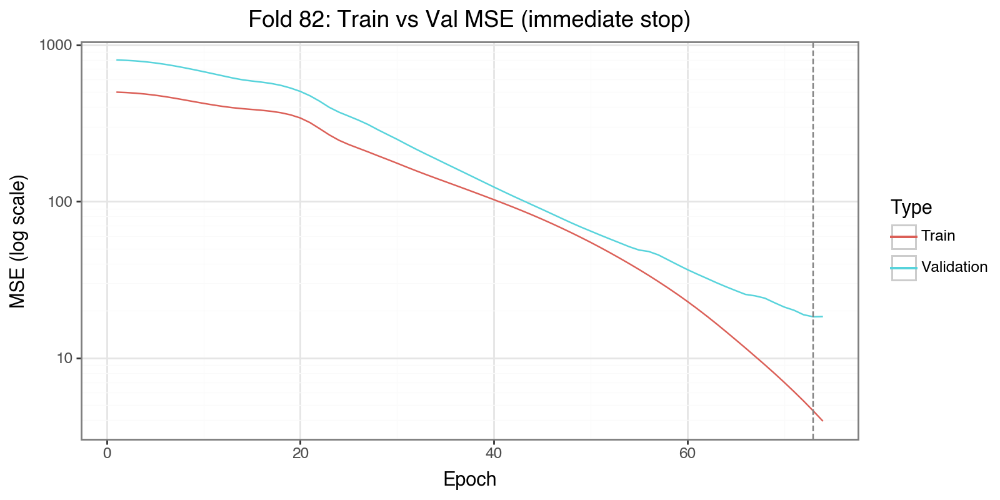

[Fold 83] Immediate stop at epoch 69


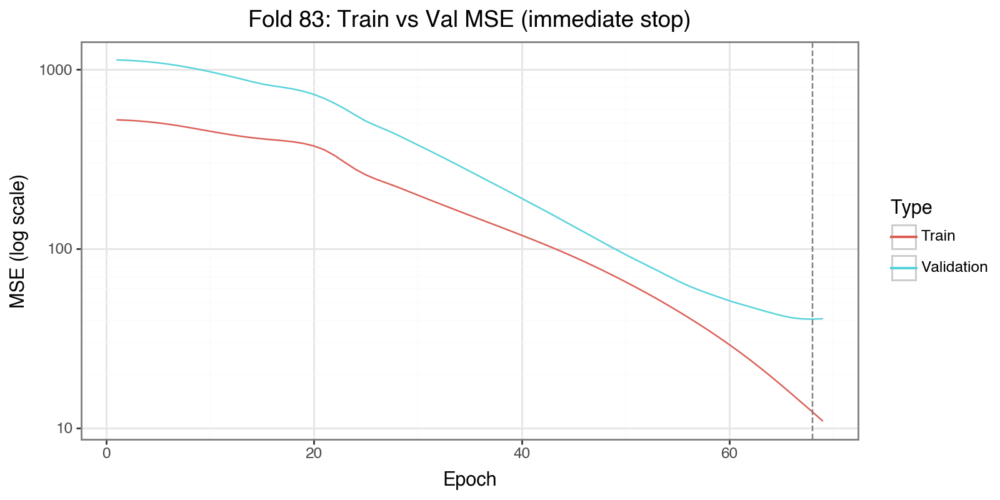

[Fold 84] Immediate stop at epoch 81


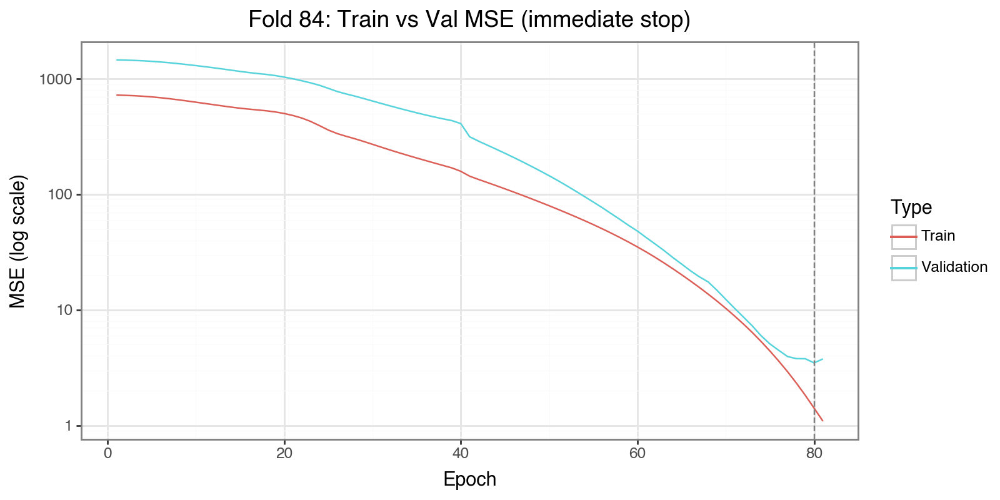

[Fold 85] Immediate stop at epoch 83


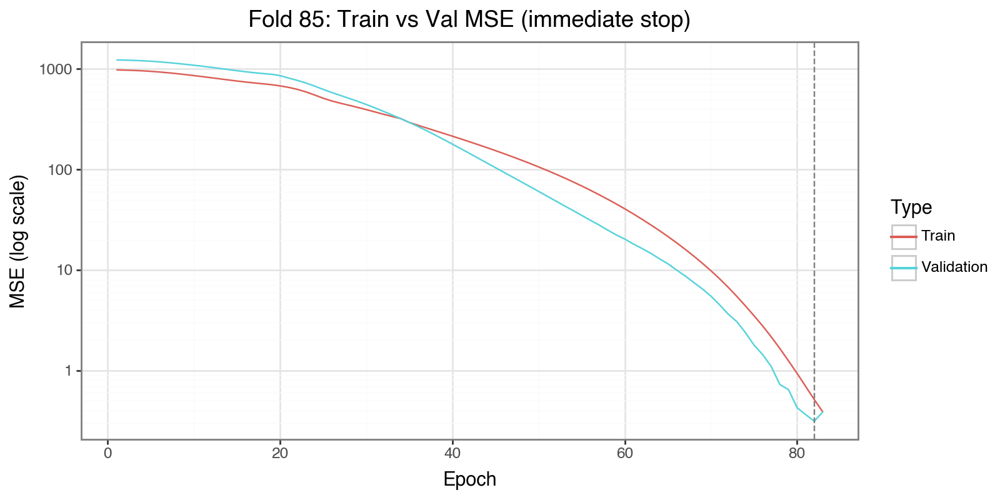

[Fold 86] Immediate stop at epoch 83


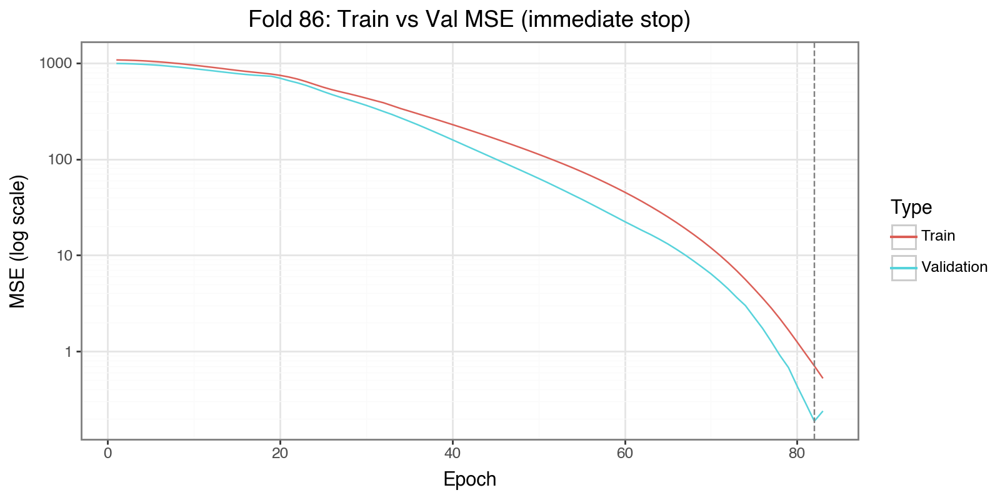

[Fold 87] Immediate stop at epoch 59


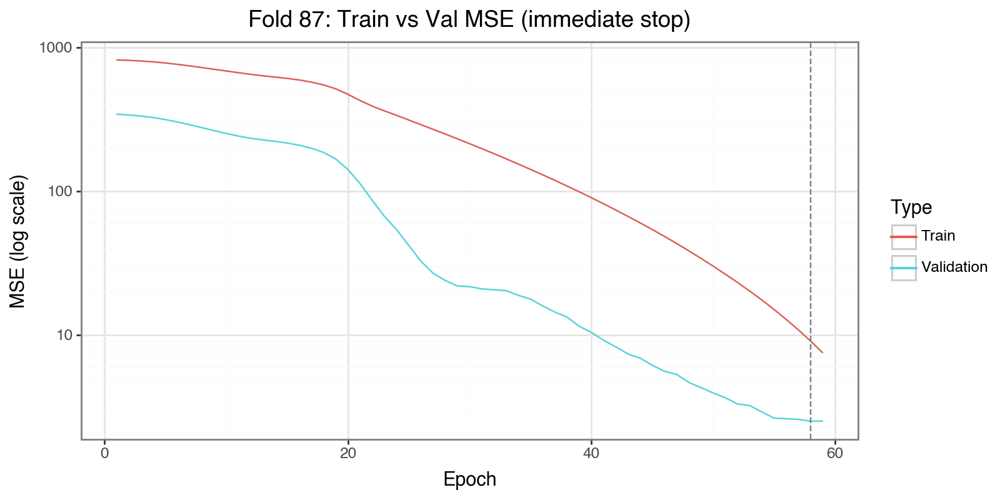

[Fold 88] Immediate stop at epoch 56


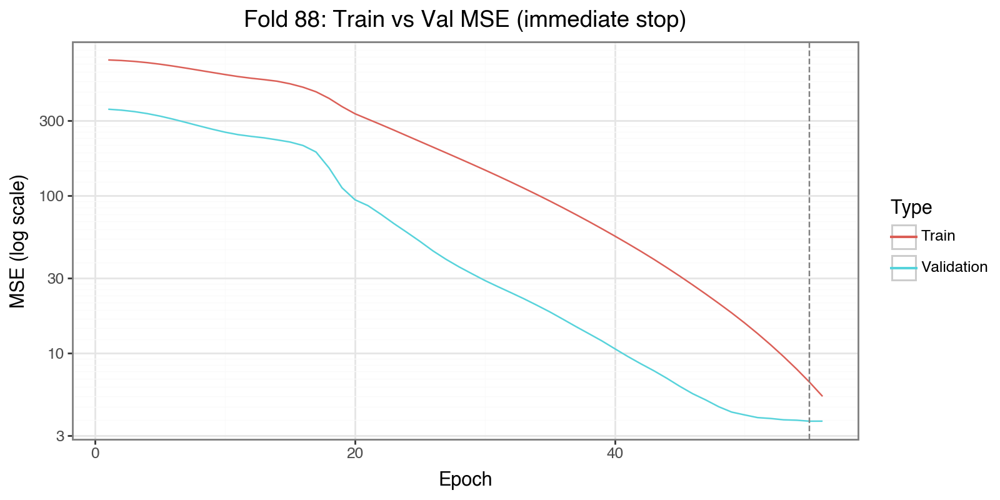

[Fold 89] Immediate stop at epoch 62


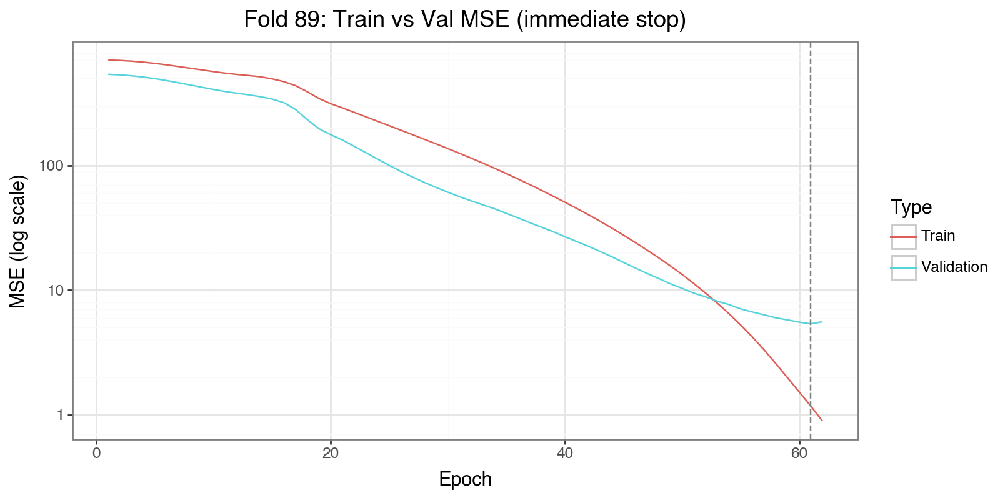

[Fold 90] Immediate stop at epoch 50


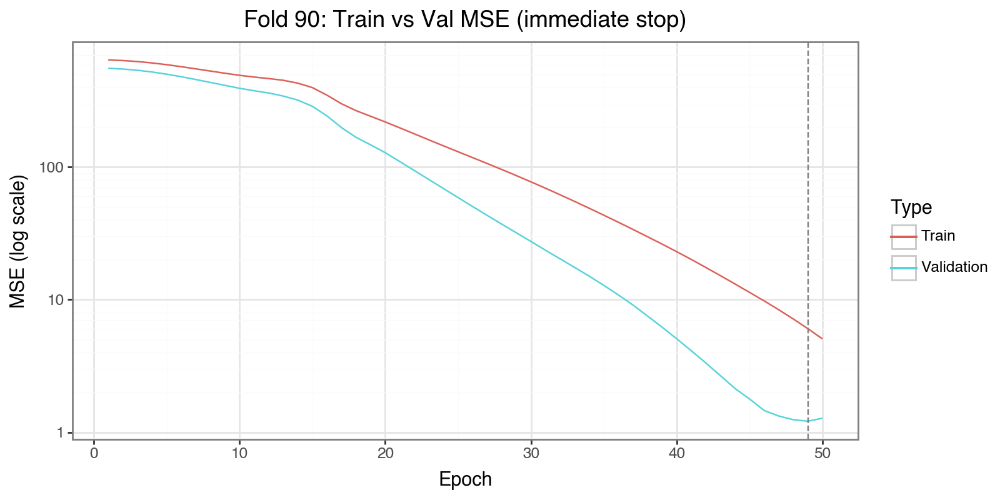

[Fold 91] Immediate stop at epoch 48


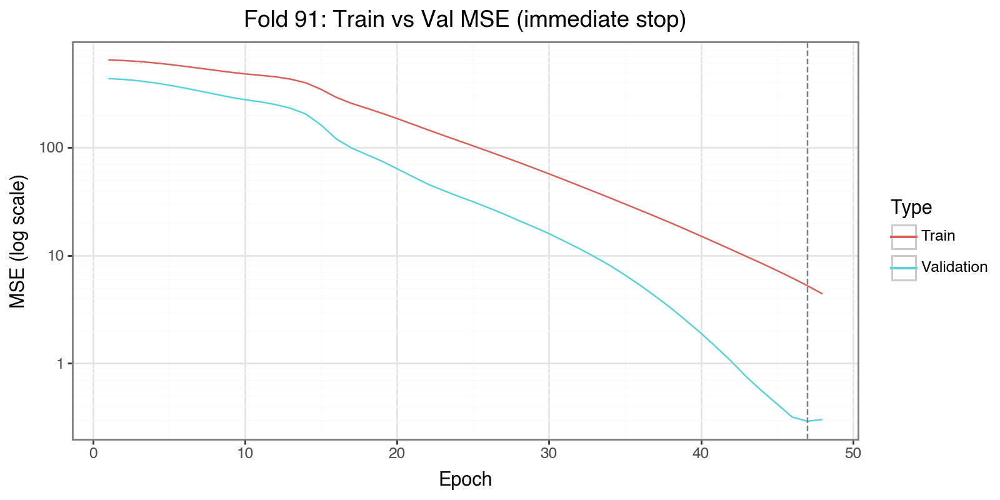

[Fold 92] Immediate stop at epoch 50


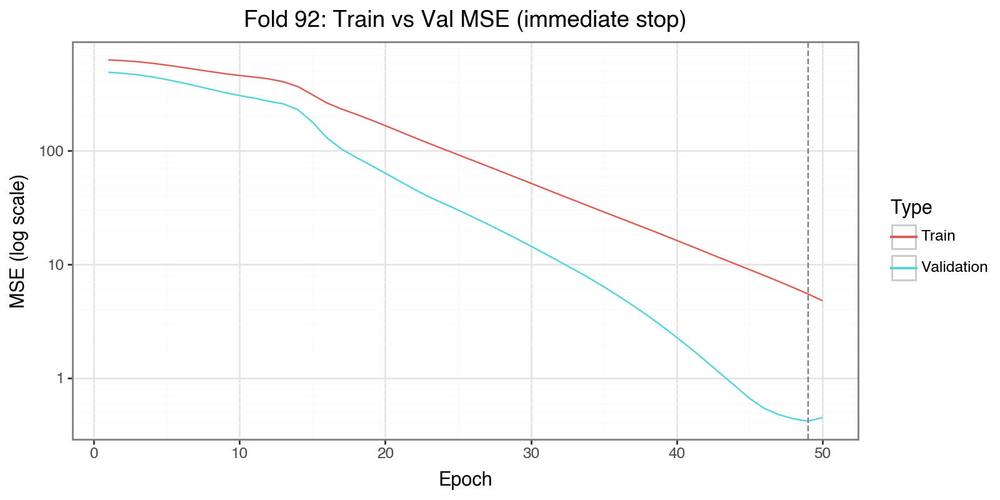

[Fold 93] Immediate stop at epoch 57


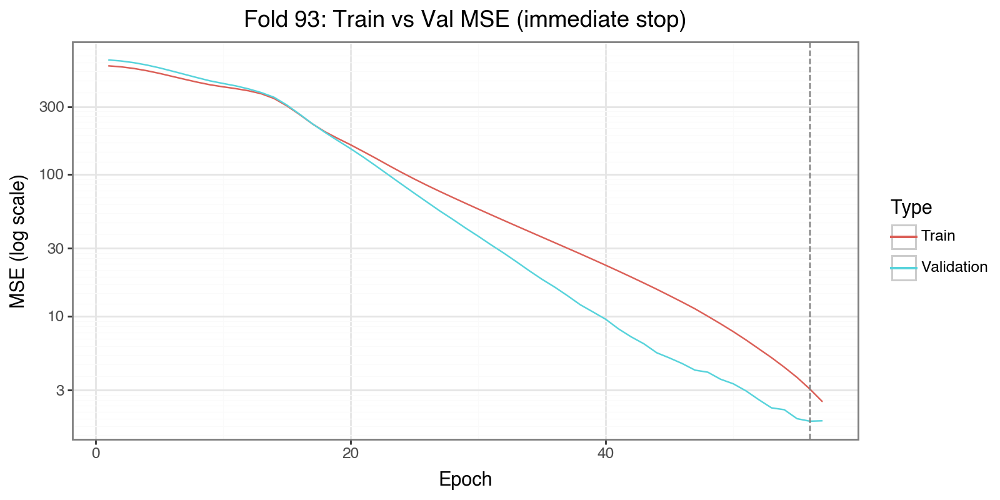

[Fold 94] Immediate stop at epoch 37


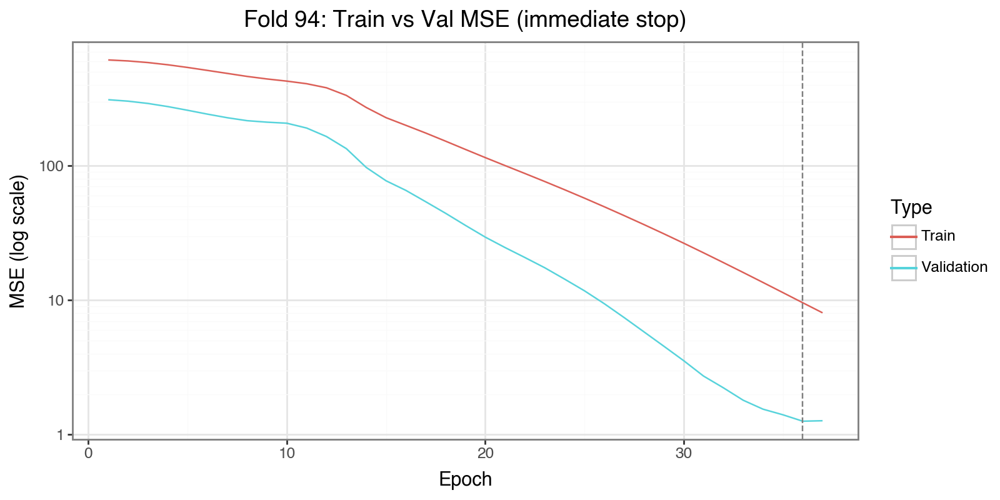

[Fold 95] Immediate stop at epoch 9


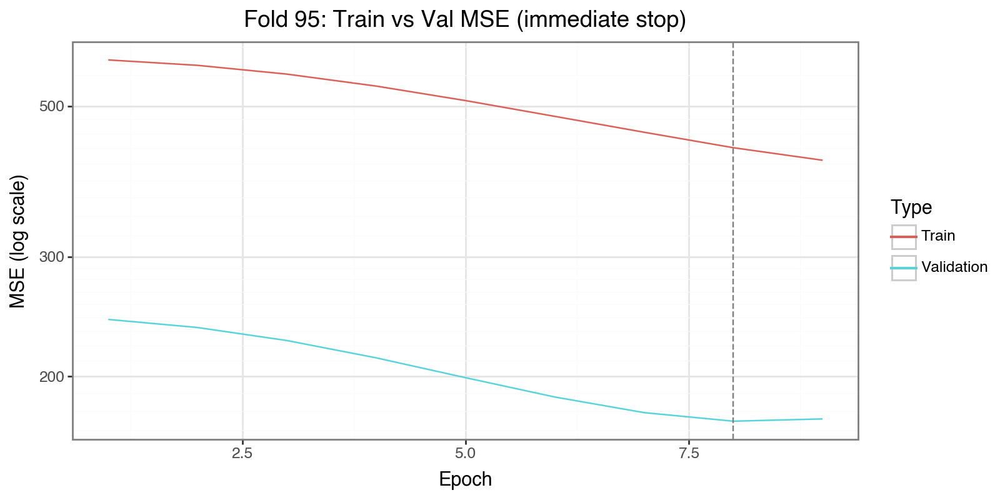

[Fold 96] Immediate stop at epoch 64


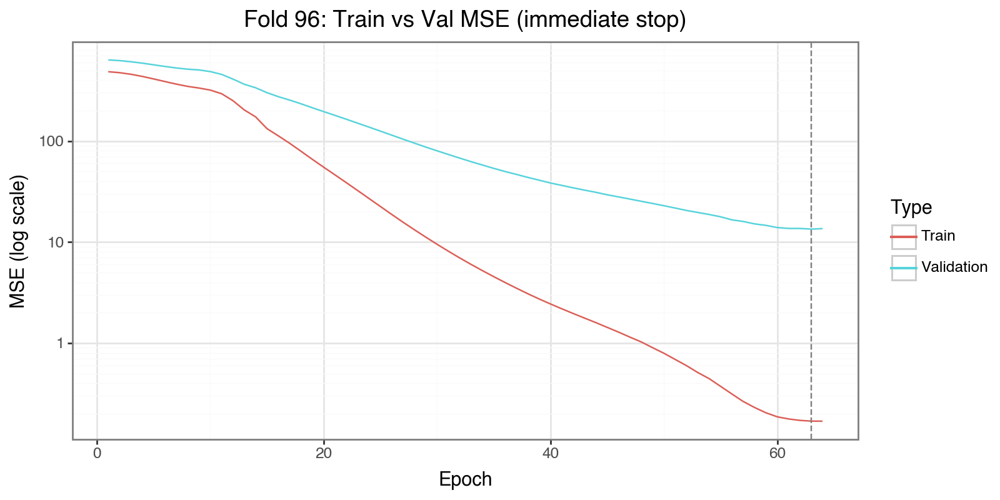

[Fold 97] Immediate stop at epoch 67


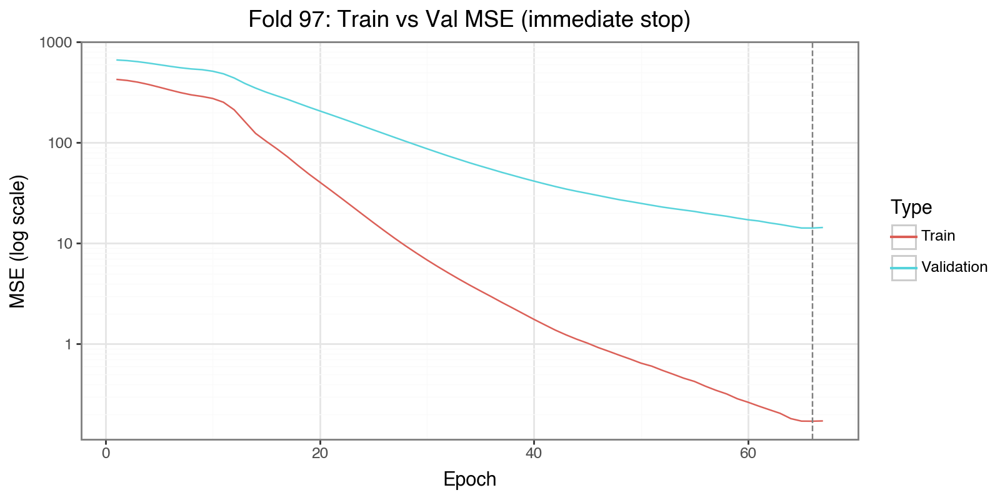

[Fold 98] Immediate stop at epoch 73


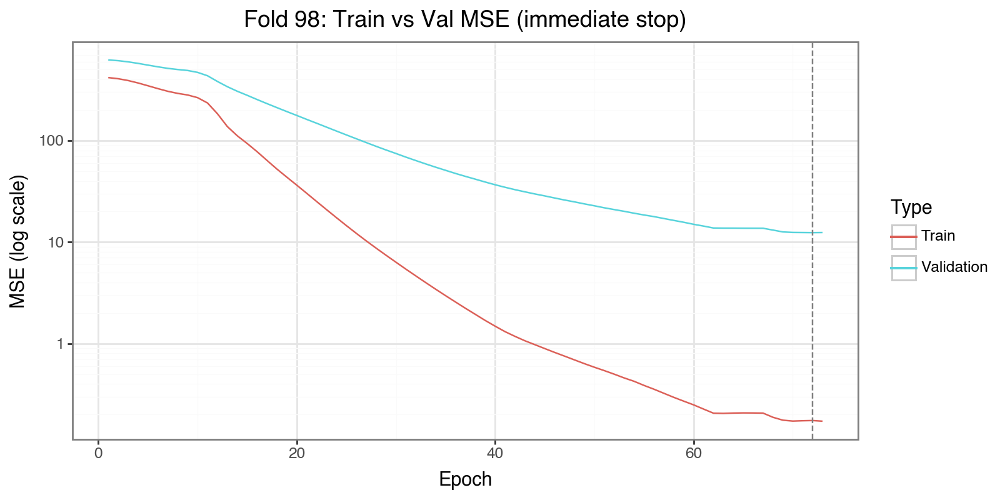

[Fold 99] Immediate stop at epoch 60


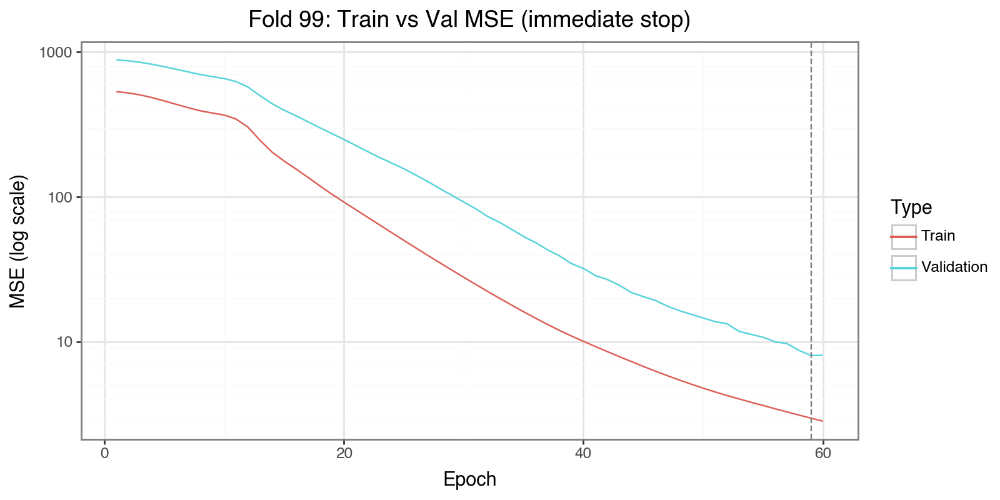

[Fold 100] Immediate stop at epoch 70


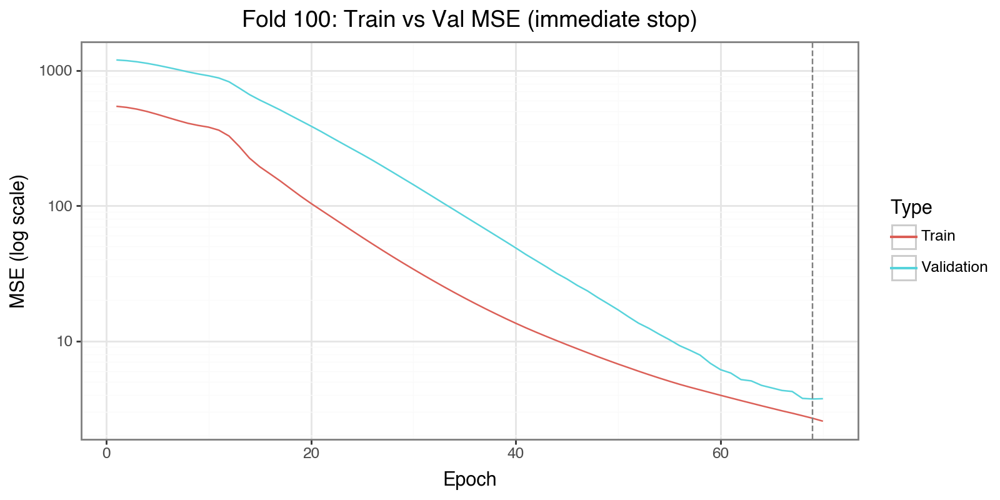

[Fold 101] Immediate stop at epoch 65


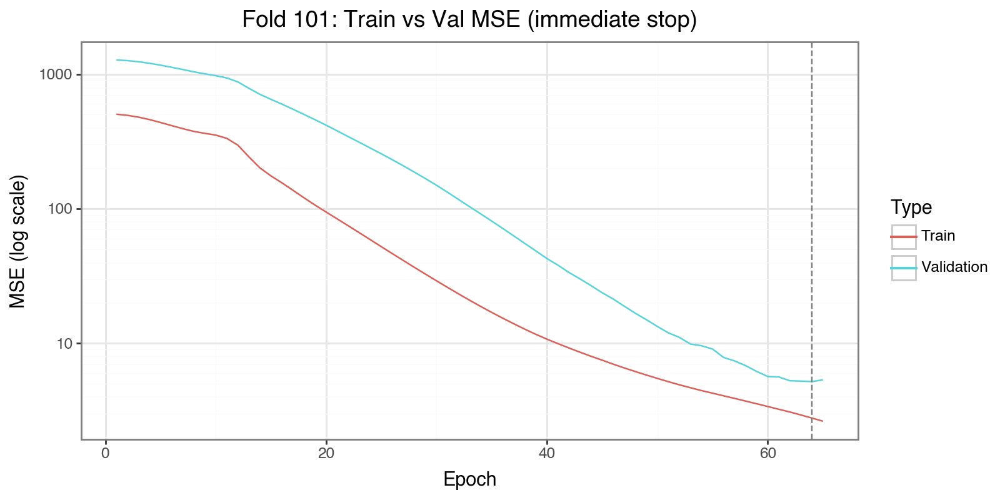

[Fold 102] Immediate stop at epoch 53


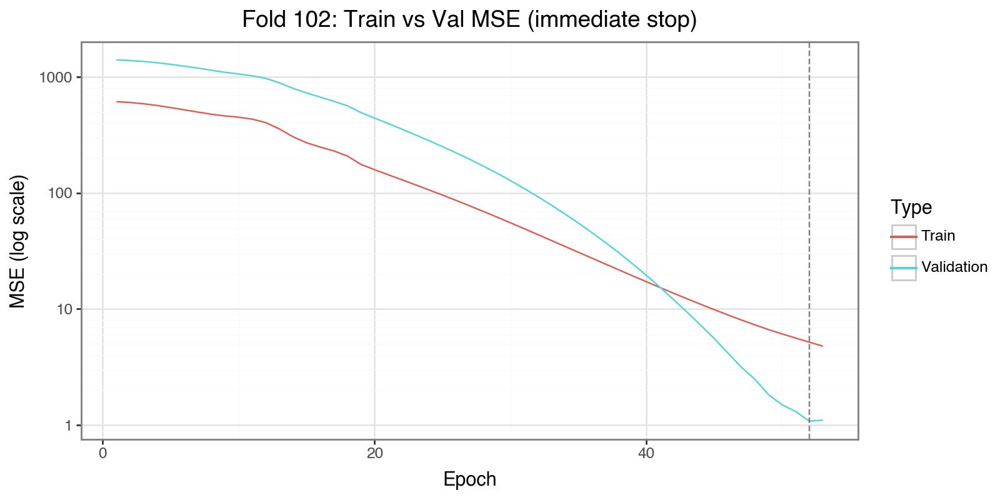

[Fold 103] Immediate stop at epoch 55


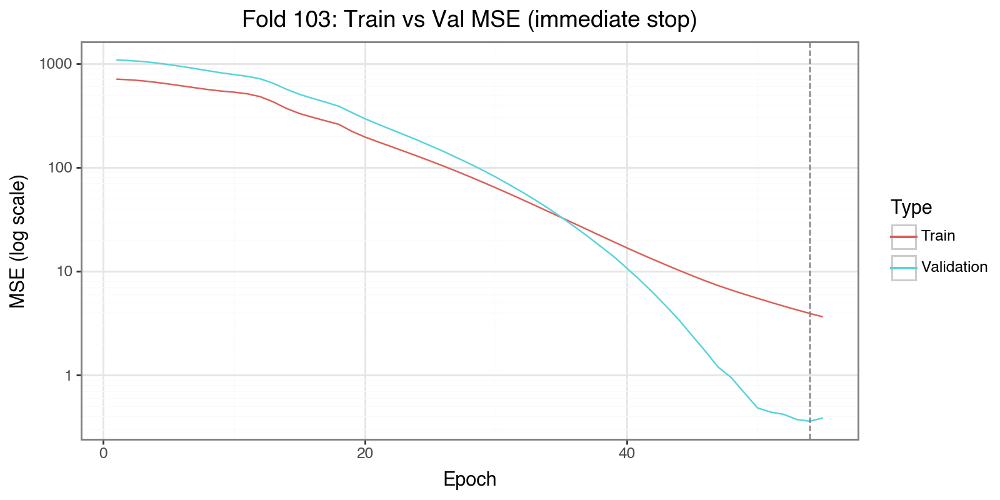

[Fold 104] Immediate stop at epoch 51


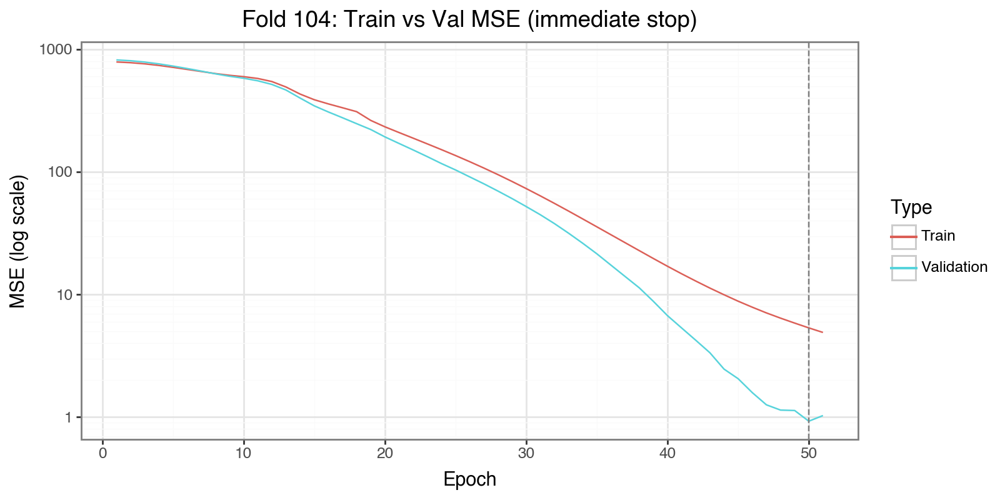

[Fold 105] Immediate stop at epoch 10


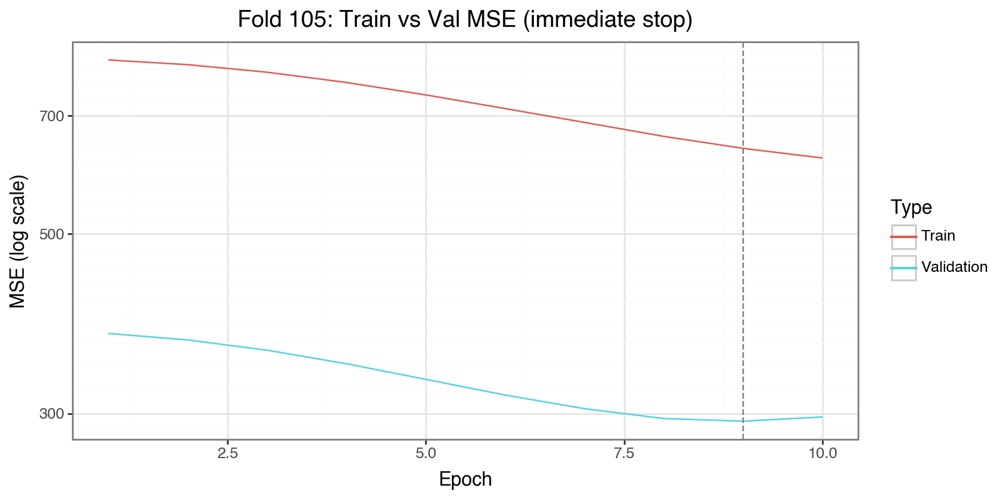

[Fold 106] Immediate stop at epoch 9


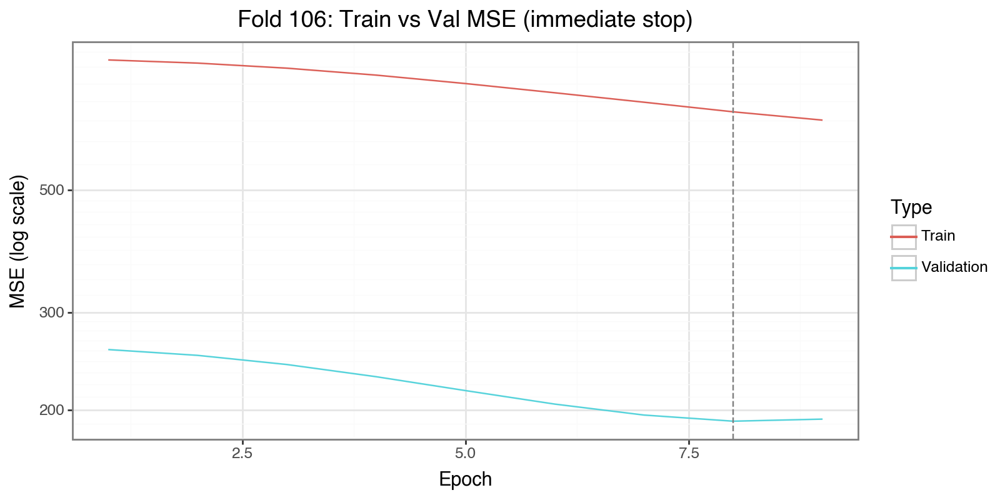

[Fold 107] Immediate stop at epoch 48


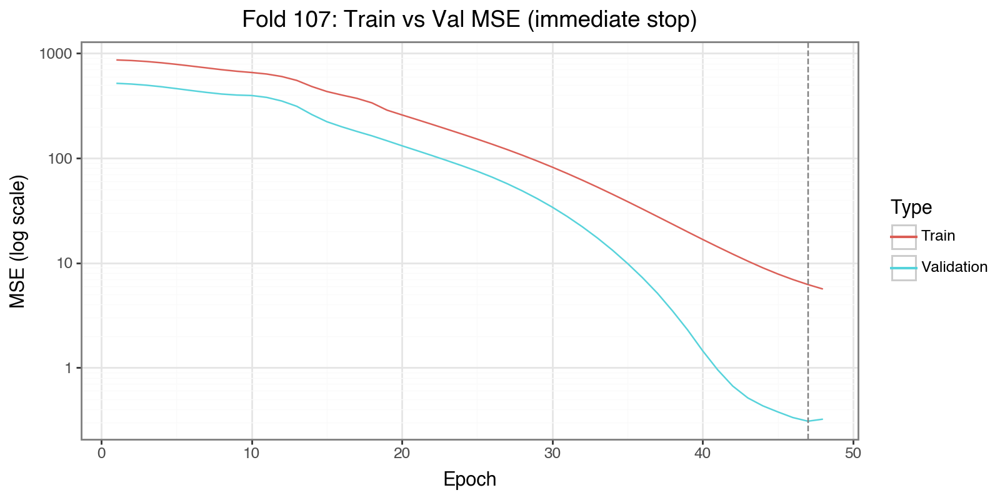

[Fold 108] Immediate stop at epoch 69


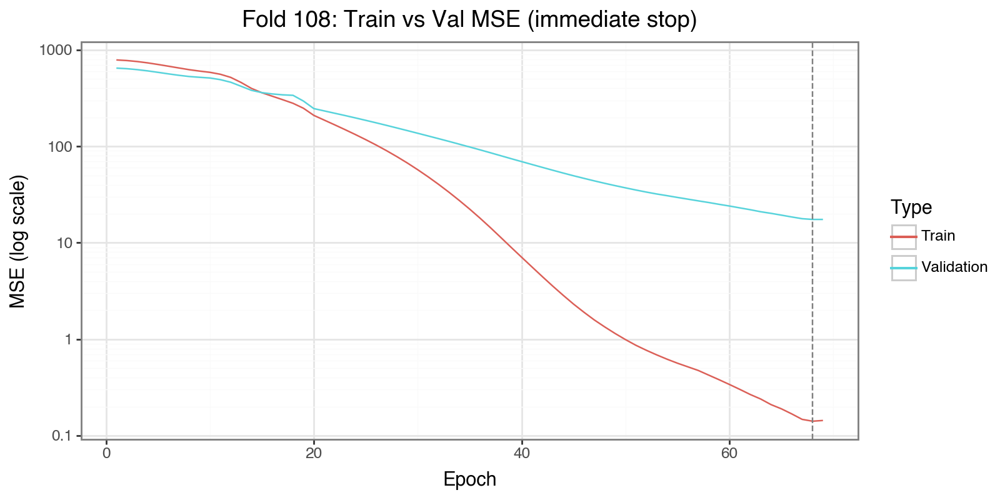

[Fold 109] Immediate stop at epoch 72


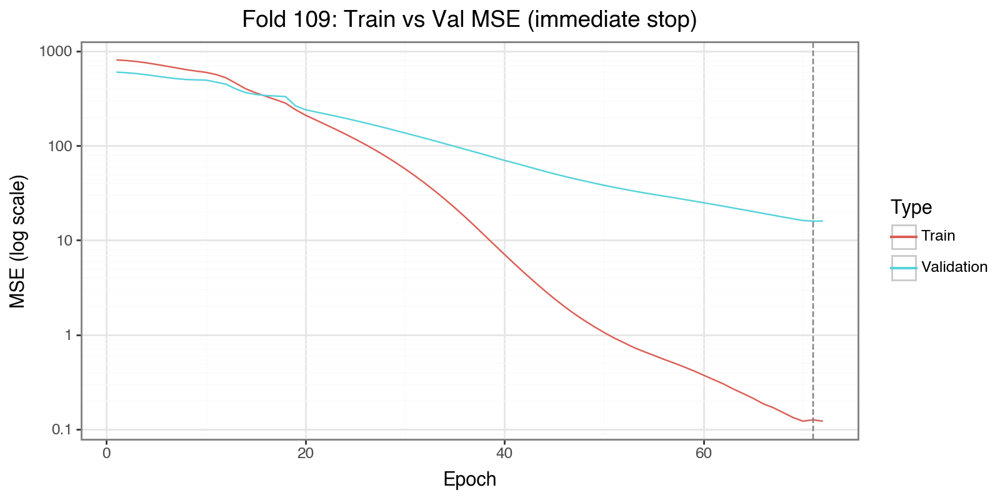

[Fold 110] Immediate stop at epoch 9


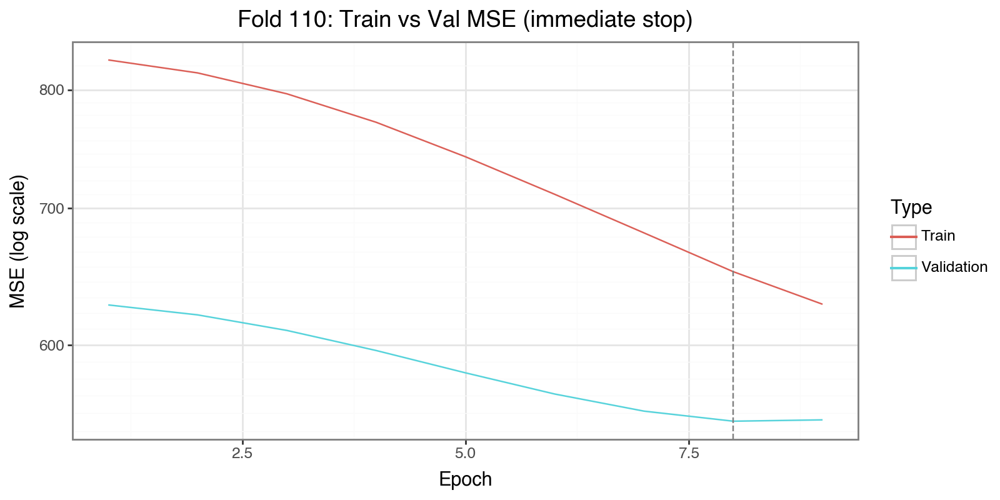

[Fold 111] Immediate stop at epoch 20


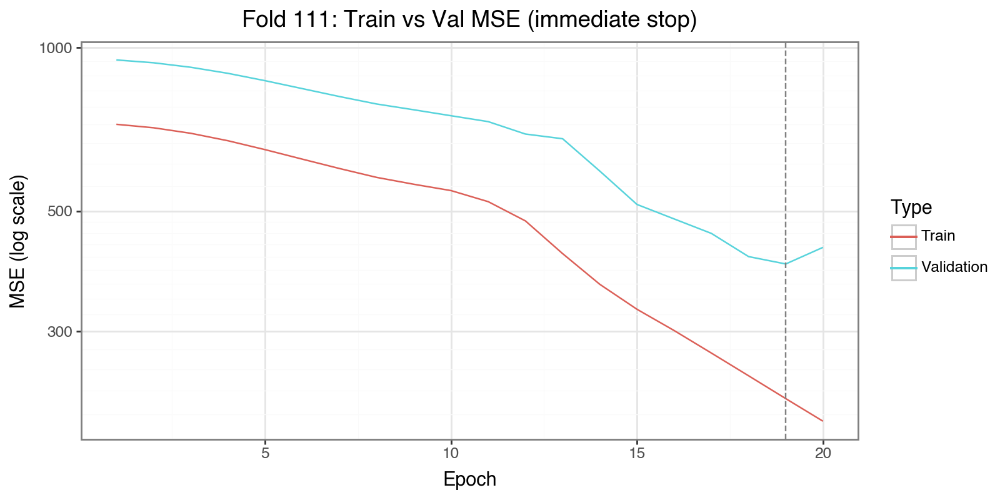

[Fold 112] Immediate stop at epoch 78


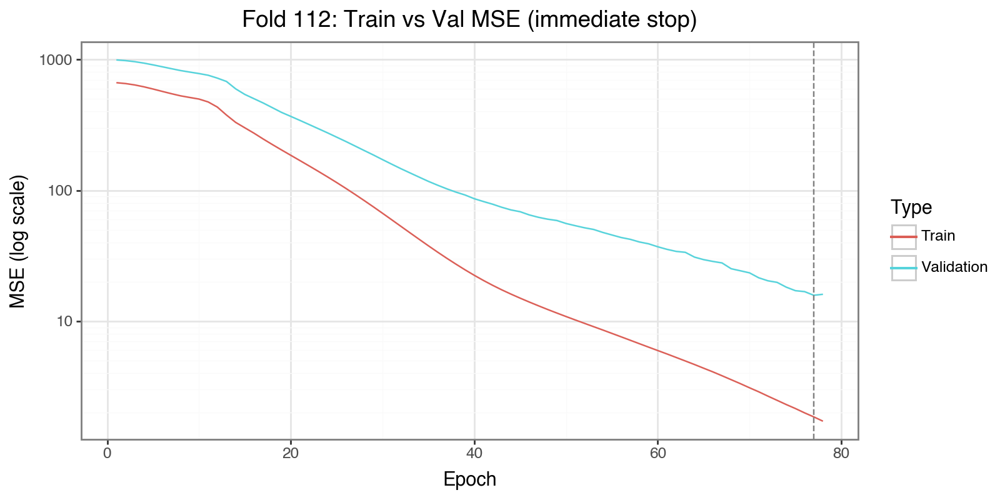

[Fold 113] Immediate stop at epoch 93


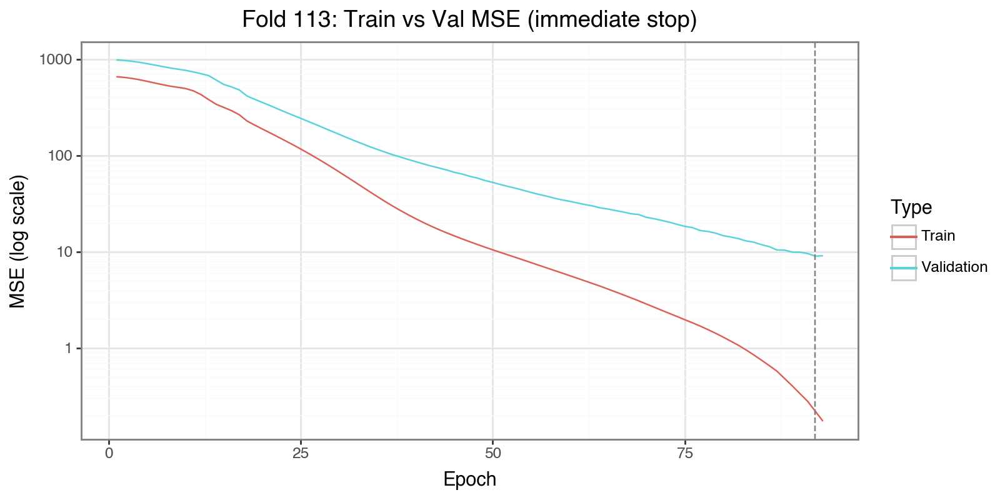

[Fold 114] Immediate stop at epoch 8


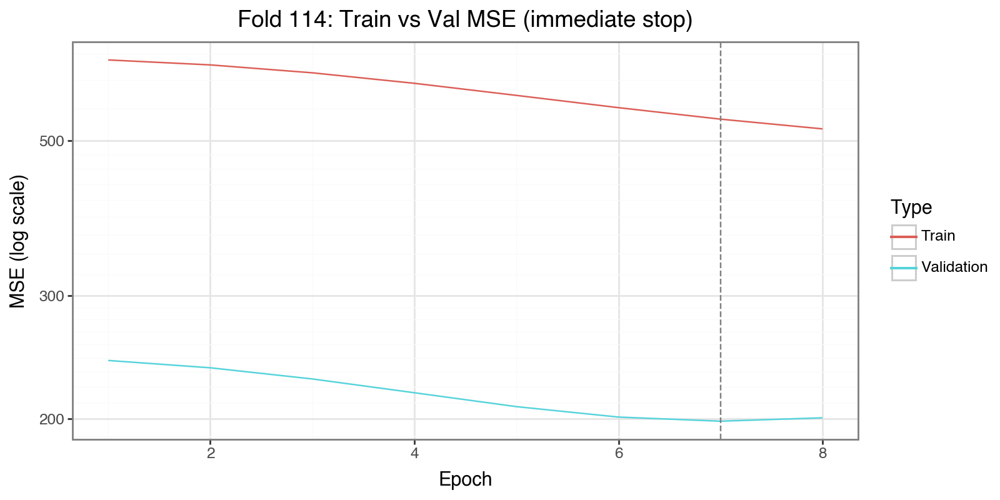

[Fold 115] Immediate stop at epoch 40


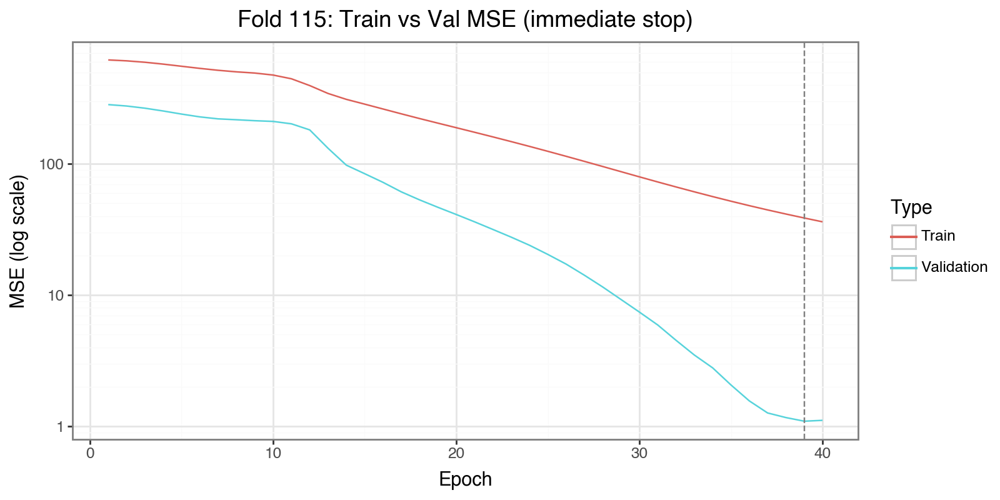

[Fold 116] Immediate stop at epoch 43


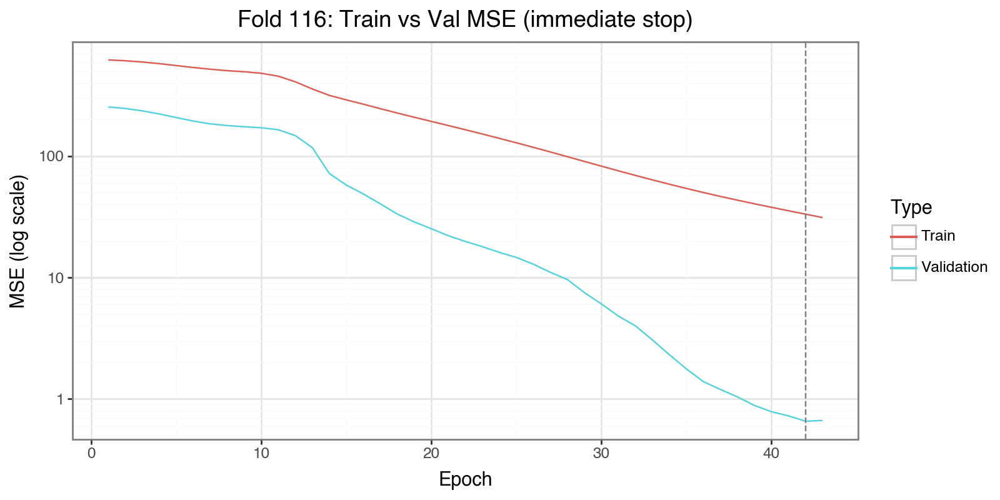

[Fold 117] Immediate stop at epoch 39


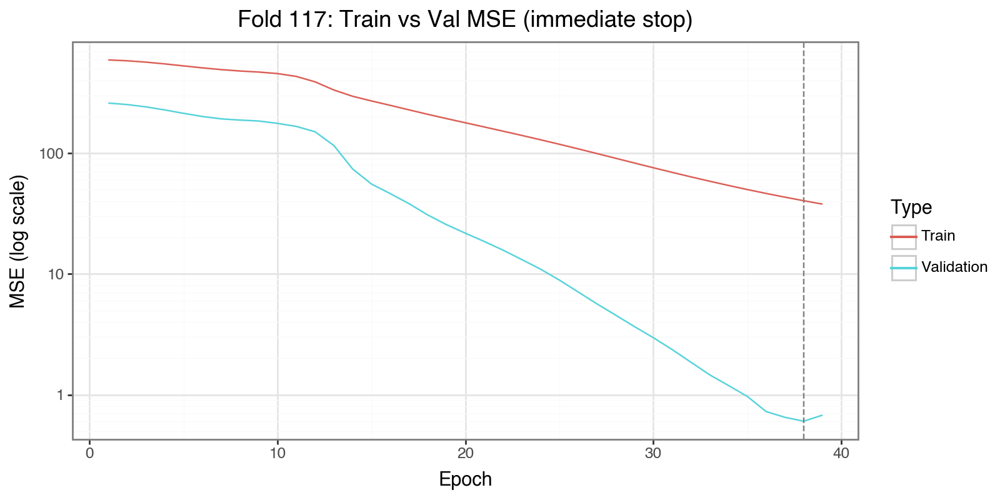

[Fold 118] Immediate stop at epoch 44


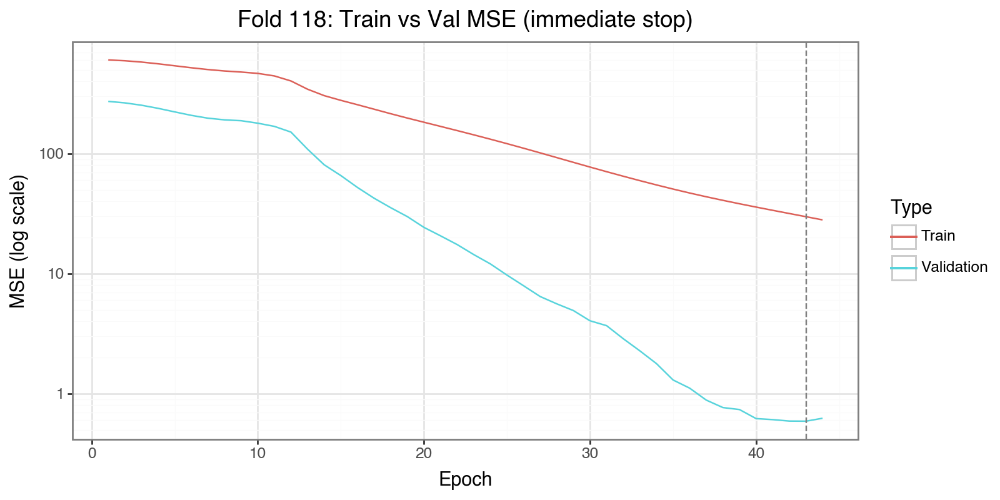

[Fold 119] Immediate stop at epoch 55


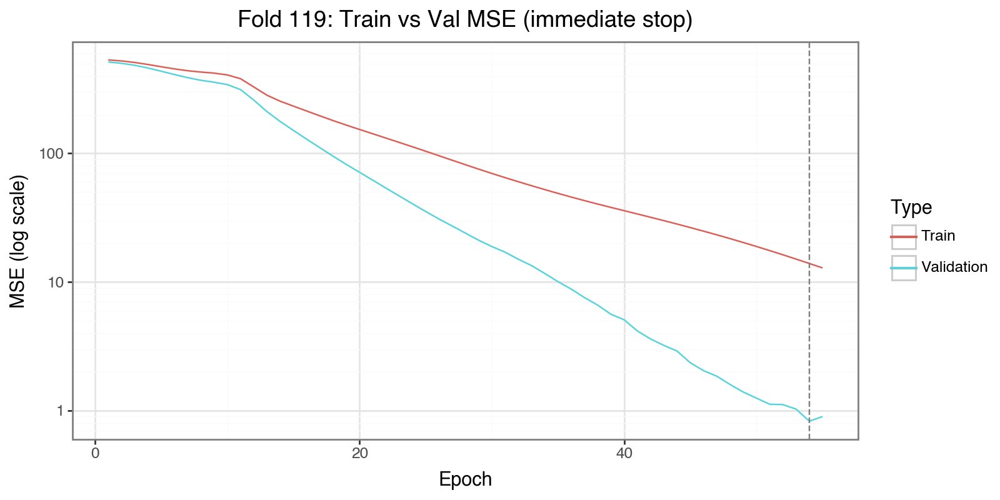

[Fold 120] Immediate stop at epoch 81


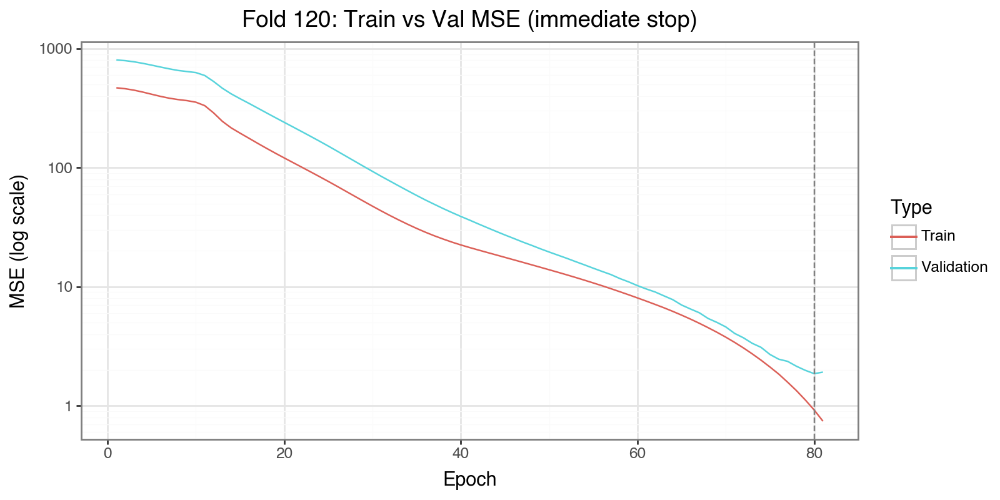

[Fold 121] Immediate stop at epoch 81


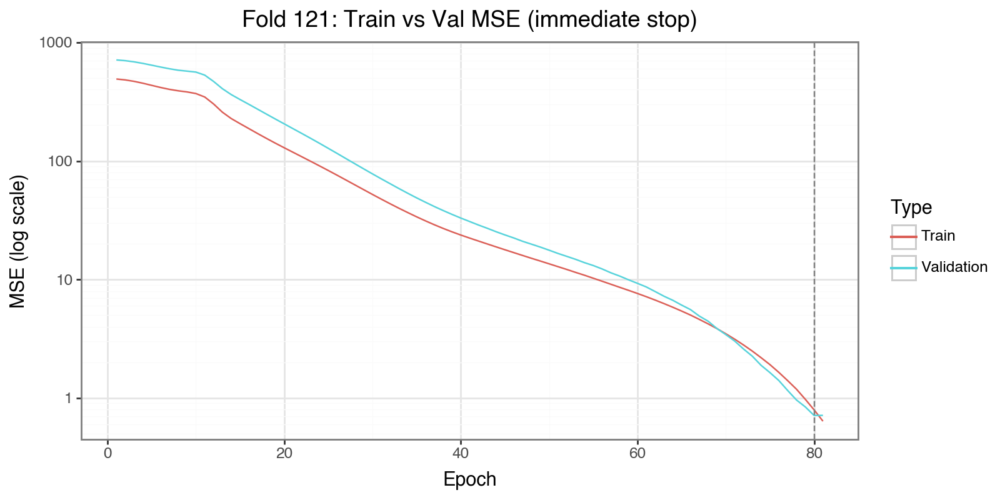

[Fold 122] Immediate stop at epoch 85


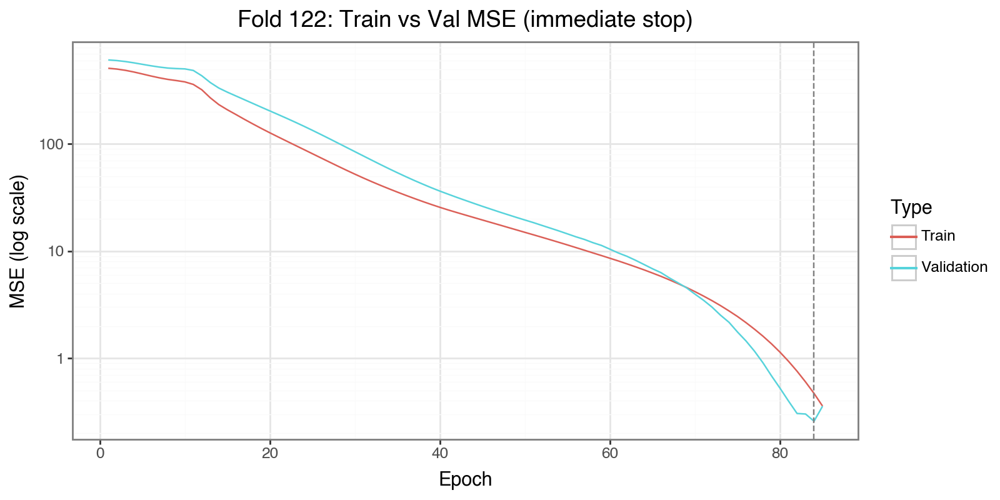

[Fold 123] Immediate stop at epoch 42


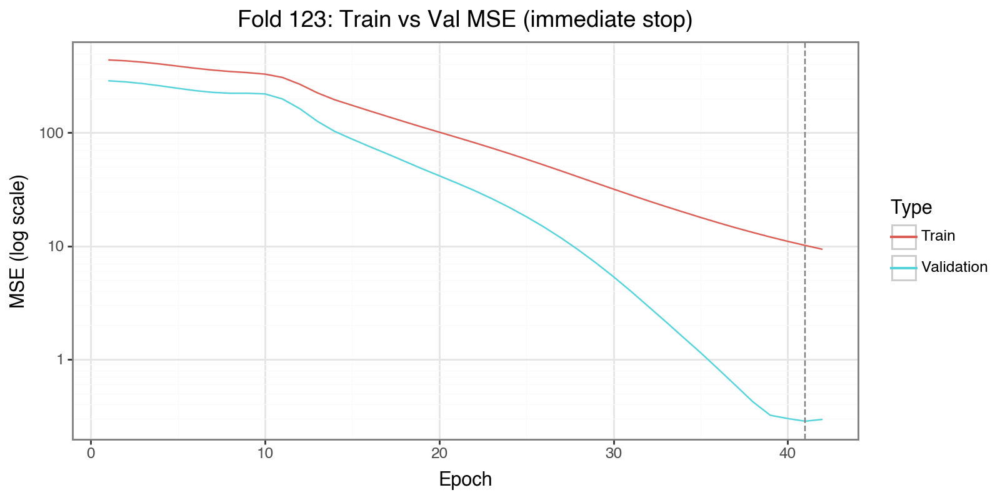

[Fold 124] Immediate stop at epoch 42


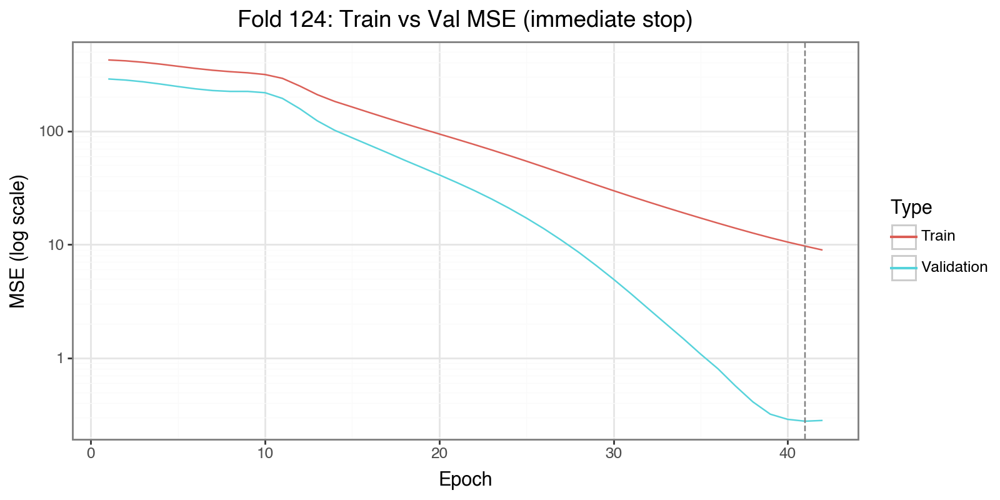

[Fold 125] Immediate stop at epoch 9


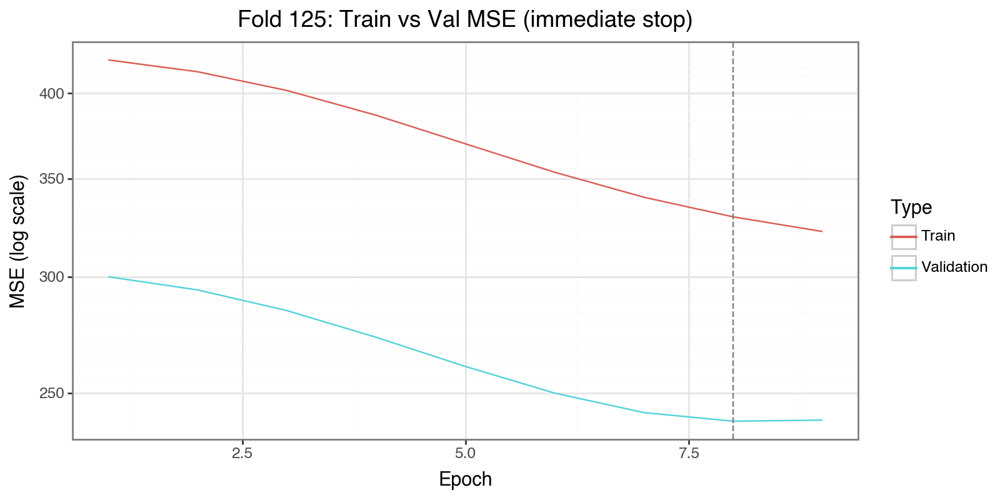

[Fold 126] Immediate stop at epoch 30


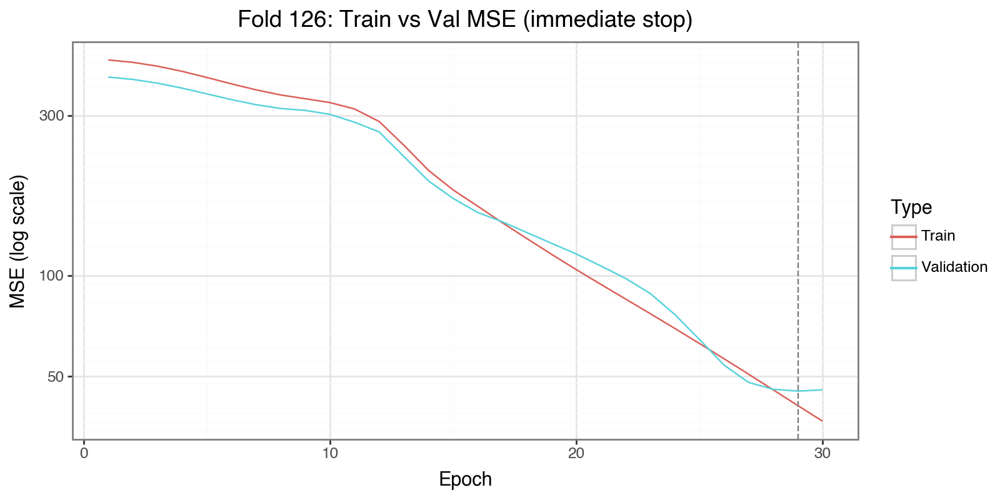

[Fold 127] Immediate stop at epoch 37


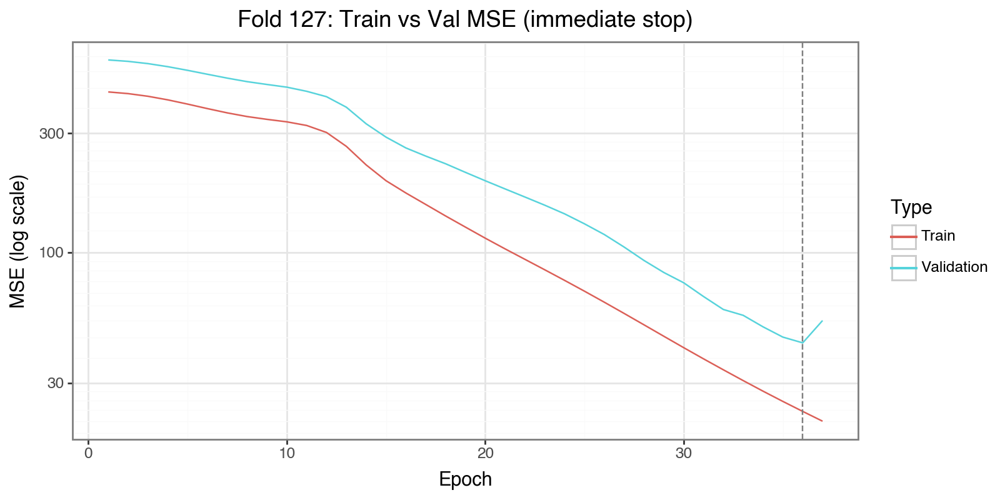

[Fold 128] Immediate stop at epoch 48


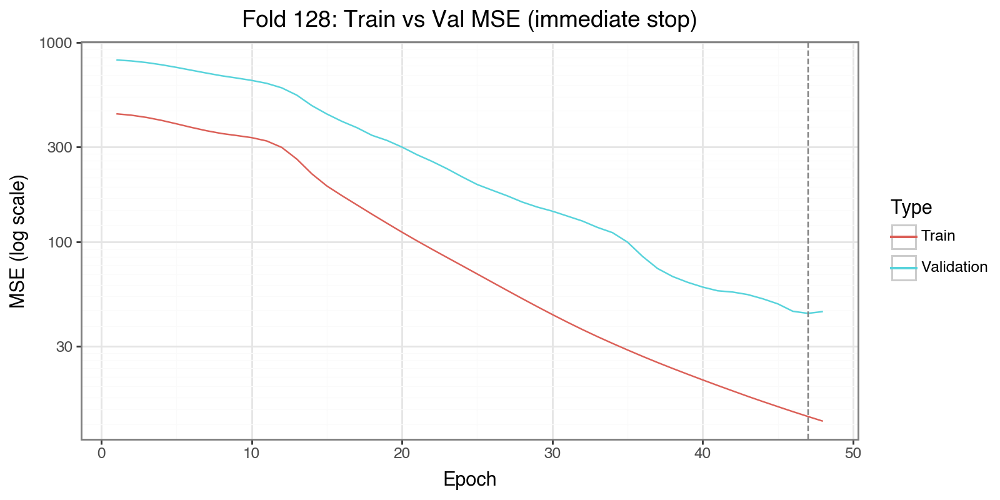

[Fold 129] Immediate stop at epoch 63


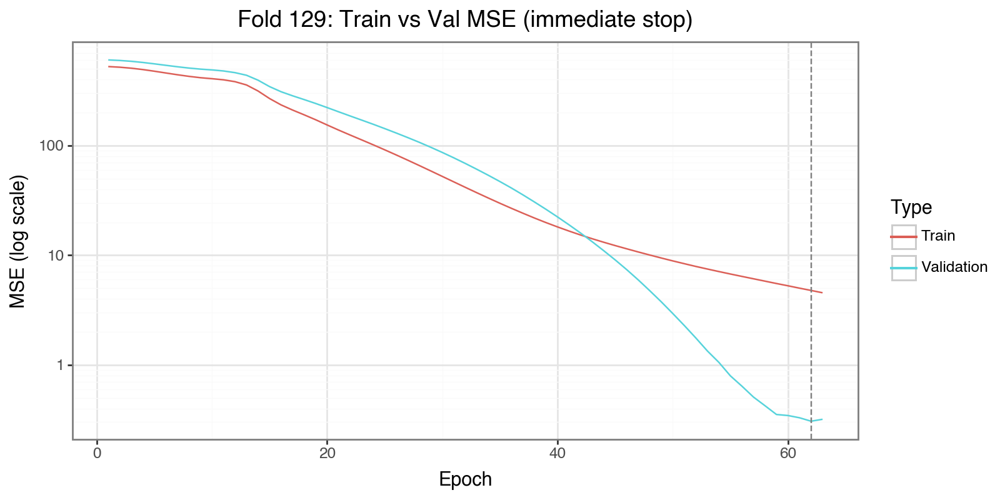

[Fold 130] Immediate stop at epoch 10


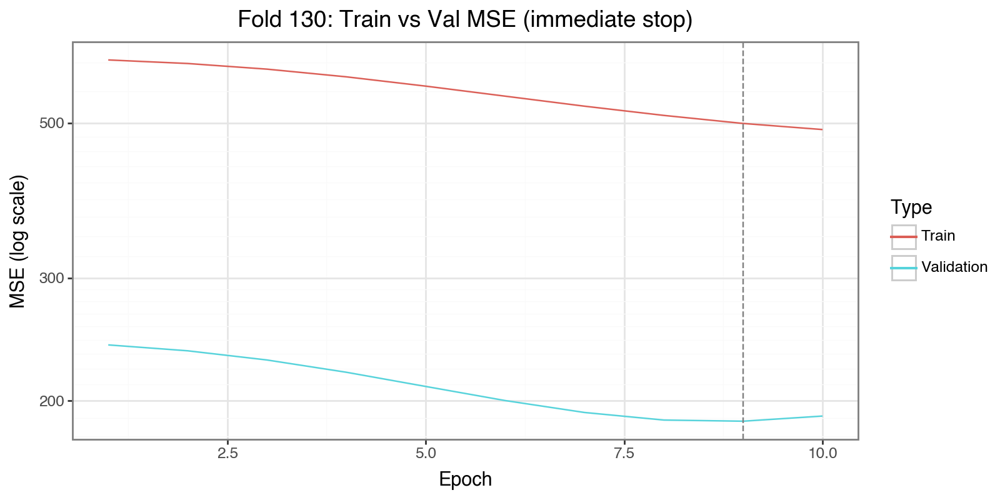

[Fold 131] Immediate stop at epoch 85


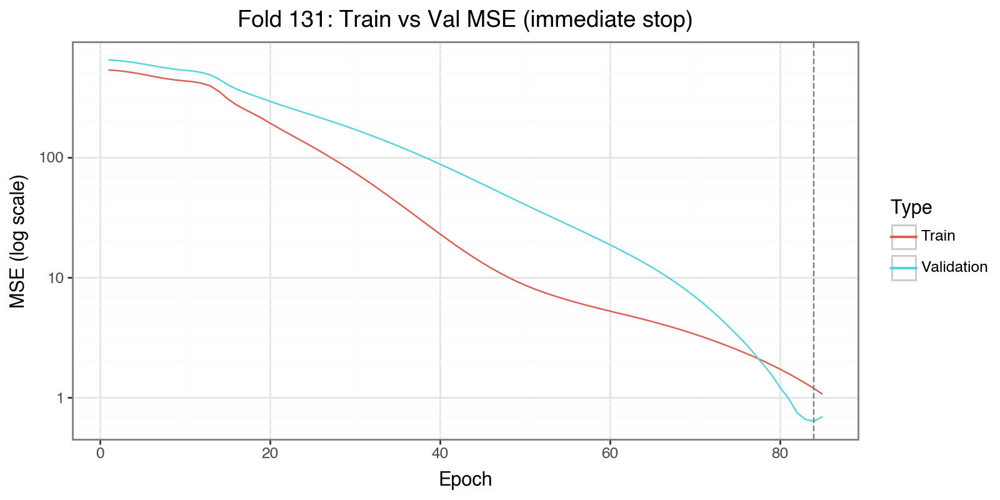

[Fold 132] Immediate stop at epoch 213


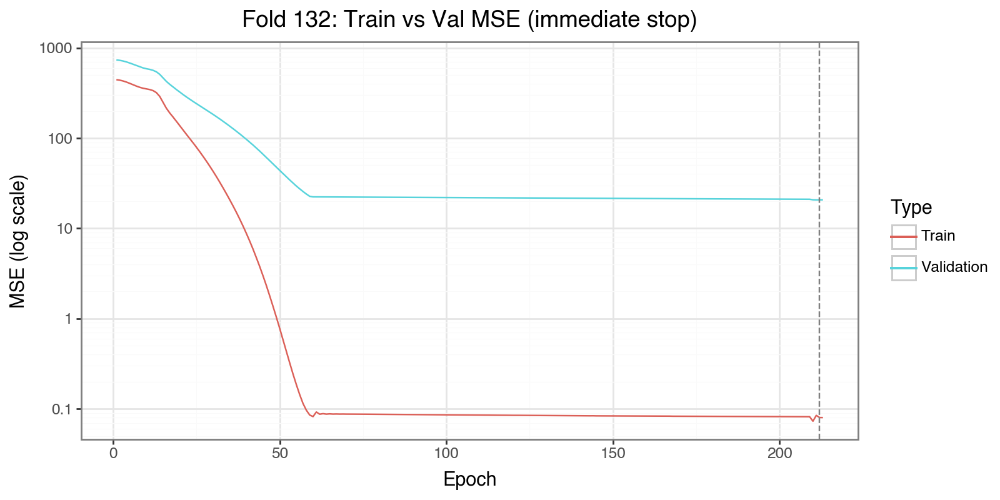

[Fold 133] Immediate stop at epoch 59


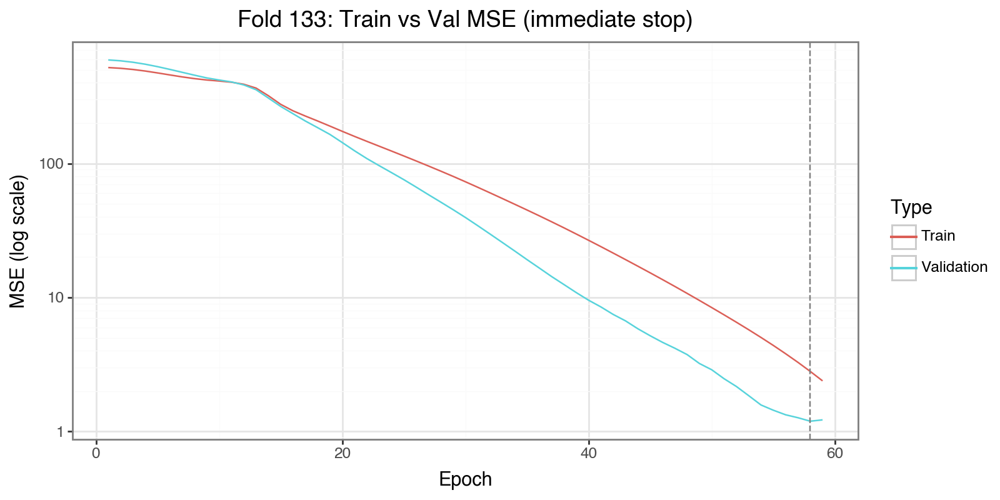

[Fold 134] Immediate stop at epoch 75


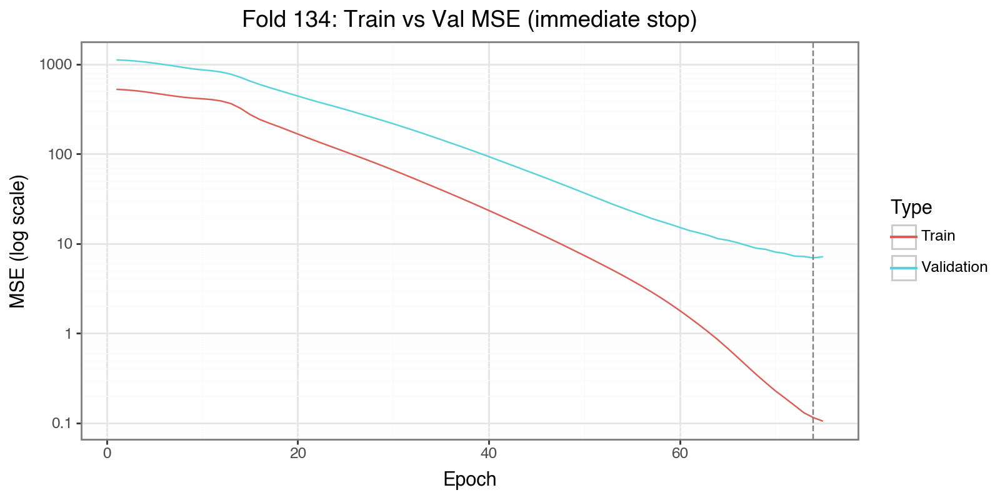

In [43]:
from IPython.display import display
import warnings
from sklearn.exceptions import ConvergenceWarning
warnings.filterwarnings("ignore", category=ConvergenceWarning)

# Compute fold starts (monthly)
max_start = last_date - relativedelta(months=train_months+test_months) + timedelta(days=1)
fold_starts, dt = [], first_date
while dt <= max_start:
    fold_starts.append(dt)
    dt += relativedelta(months=1)

# Containers for collecting metrics
mlp_train_rmse, mlp_val_rmse, mlp_test_rmse = [], [], []
mlp_train_mae,  mlp_val_mae,  mlp_test_mae  = [], [], []
bs_test_rmse, bs_test_mae              = [], []
mlp_seg_rmse = {s:[] for s in ["ITM","ATM","OTM"]}
mlp_seg_mae  = {s:[] for s in ["ITM","ATM","OTM"]}
bs_seg_rmse  = {s:[] for s in ["ITM","ATM","OTM"]}
bs_seg_mae   = {s:[] for s in ["ITM","ATM","OTM"]}
epoch_metrics = {"fold":[], "epoch":[],
                 "train_mse":[], "val_mse":[],
                 "train_mae":[], "val_mae":[]}
best_epochs = []
dm_test_results = [] # New list for our test data for HLN DM
test_dates = []

# Walk-forward with immediate early stopping
for fold, start in enumerate(fold_starts, 1):
    # set windows
    train_end  = start + relativedelta(months=train_months) - timedelta(days=1)
    test_start = train_end + timedelta(days=1)
    test_end   = test_start + relativedelta(months=test_months) - timedelta(days=1)

    test_dates.append((fold, test_start, test_end))

    tr = run[(run["quotedate"] >= start) & (run["quotedate"] <= train_end)]
    te = run[(run["quotedate"] >= test_start) & (run["quotedate"] <= test_end)].copy()
    if tr.empty or te.empty: 
        continue

    # features & target
    X_tr, y_tr = tr[features], tr[target]
    X_te, y_te = te[features], te[target]
    X_tr_fit, X_val, y_tr_fit, y_val = train_test_split(
        X_tr, y_tr, test_size=0.2, shuffle=False
    )

    # scale
    scaler = StandardScaler().fit(X_tr_fit)
    X_tr_sc, X_val_sc, X_te_sc = map(scaler.transform, (X_tr_fit, X_val, X_te))

    # MLP warm-start
    mlp = MLPRegressor(
        hidden_layer_sizes=(10,10,10,),     # change depending on Deep MLP three layer vs one hidden layer
        activation="logistic",
        alpha=1e-4,
        max_iter=1,
        warm_start=True,
        random_state=42
    )

    # early-stop trackers
    prev_val_mse = np.inf
    best_val_mse = np.inf
    best_model = None
    best_epoch = 0

    # per-epoch storage
    tr_mse_curve, va_mse_curve = [], []
    tr_mae_curve, va_mae_curve = [], []

    for epoch in range(1, n_epochs+1):
        mlp.max_iter = epoch
        mlp.fit(X_tr_sc, y_tr_fit)

        # preds & metrics
        y_tr_pred  = mlp.predict(X_tr_sc)
        y_val_pred = mlp.predict(X_val_sc)
        tr_mse = mean_squared_error(y_tr_fit, y_tr_pred)
        va_mse = mean_squared_error(y_val,    y_val_pred)
        tr_mae = mean_absolute_error(y_tr_fit, y_tr_pred)
        va_mae = mean_absolute_error(y_val,    y_val_pred)

        # record curves
        tr_mse_curve.append(tr_mse); va_mse_curve.append(va_mse)
        tr_mae_curve.append(tr_mae); va_mae_curve.append(va_mae)

        # record epoch-level metrics
        epoch_metrics["fold"].append(fold)
        epoch_metrics["epoch"].append(epoch)
        epoch_metrics["train_mse"].append(tr_mse)
        epoch_metrics["val_mse"].append(va_mse)
        epoch_metrics["train_mae"].append(tr_mae)
        epoch_metrics["val_mae"].append(va_mae)

        # snapshot if best
        if va_mse < best_val_mse:
            best_val_mse = va_mse
            best_epoch = epoch
            best_model = copy.deepcopy(mlp)

        # immediate stop if val-MSE stops decreasing
        if va_mse >= prev_val_mse:
            print(f"[Fold {fold}] Immediate stop at epoch {epoch}")
            break

        prev_val_mse = va_mse

    best_epochs.append(best_epoch)

    # use best_model for predictions
    y_tr_full  = best_model.predict(X_tr_sc)
    y_val_full = best_model.predict(X_val_sc)
    y_te_pred  = best_model.predict(X_te_sc)

    # fold-level MLP metrics
    mlp_train_rmse.append(np.sqrt(mean_squared_error(y_tr_fit, y_tr_full)))
    mlp_val_rmse.append(  np.sqrt(mean_squared_error(y_val,     y_val_full)))
    mlp_test_rmse.append( np.sqrt(mean_squared_error(y_te,      y_te_pred)))
    mlp_train_mae.append(mean_absolute_error(y_tr_fit, y_tr_full))
    mlp_val_mae.append(  mean_absolute_error(y_val,    y_val_full))
    mlp_test_mae.append( mean_absolute_error(y_te,     y_te_pred))

    bs_pred = te["black_scholes"].values
    bs_test_rmse.append(np.sqrt(mean_squared_error(y_te, bs_pred)))
    bs_test_mae.append(mean_absolute_error(y_te, bs_pred))

    # segment metrics
    te["mlp_pred"], te["bs_pred"] = y_te_pred, bs_pred
    te["segment"] = np.where(
        te["moneyness"]>atm_thresh, "ITM",
        np.where(te["moneyness"]<-atm_thresh, "OTM", "ATM")
    )
    for seg in ["ITM","ATM","OTM"]:
        sub = te[te["segment"]==seg]
        if not sub.empty:
            mlp_seg_rmse[seg].append(np.sqrt(mean_squared_error(sub[target], sub["mlp_pred"])))
            mlp_seg_mae[seg].append( mean_absolute_error(   sub[target], sub["mlp_pred"]))
            bs_seg_rmse[seg].append(  np.sqrt(mean_squared_error(sub[target], sub["bs_pred"])))
            bs_seg_mae[seg].append(   mean_absolute_error(   sub[target], sub["bs_pred"]))


    # Create a results dataframe for this fold
    fold_results = te[["quotedate", "K", "T", "moneyness", "segment", target]].copy()
    fold_results.rename(columns={target: 'actual_price'}, inplace=True)
    fold_results['mlp_price'] = y_te_pred
    fold_results['bs_price'] = bs_pred

    # Calculate squared errors and the loss differential
    fold_results['mlp_sq_error'] = (fold_results['mlp_price'] - fold_results['actual_price'])**2
    fold_results['bs_sq_error'] = (fold_results['bs_price'] - fold_results['actual_price'])**2
    fold_results['loss_differential'] = fold_results['mlp_sq_error'] - fold_results['bs_sq_error']

    # Append the essential data for this fold to our master list
    # If dm_test_results is a DataFrame, .append() does not modify in-place; it returns a new DataFrame.
    # If it's a list, this should work. If not, try this:
    if isinstance(dm_test_results, list):
        dm_test_results.append(fold_results[['quotedate', 'segment', 'loss_differential']])
    elif isinstance(dm_test_results, pd.DataFrame):
        dm_test_results = pd.concat([dm_test_results, fold_results[['quotedate', 'segment', 'loss_differential']]], ignore_index=True)
    else:
        raise TypeError("dm_test_results must be a list or DataFrame")

    # Save predictions for option chain plots

    te_result = te[["quotedate", "K", "T"]].copy()  # Include unique contract keys
    te_result["market_price"] = y_te.values
    te_result["ml_price"] = y_te_pred
    te_result["bs_price"] = bs_pred

    # Collect all test fold predictions
    if fold == 1:
        all_results = te_result.copy()
    else:
        all_results = pd.concat([all_results, te_result], ignore_index=True)


    import pandas as pd
    from plotnine import (
        ggplot, aes, geom_line, geom_vline, scale_y_log10,
        labs, theme_bw, theme, element_text
    )


    # Convert to plotnine format
    plot_df = pd.DataFrame({
        "epoch": list(range(1, len(tr_mse_curve) + 1)) * 2,
        "MSE": tr_mse_curve + va_mse_curve,
        "Type": ["Train"] * len(tr_mse_curve) + ["Validation"] * len(va_mse_curve)
    })

    # Make plot
    display (
        ggplot(plot_df, aes(x='epoch', y='MSE', color='Type'))
        + geom_line()
        + geom_vline(xintercept=best_epoch, linetype='dashed', color='gray')
        + scale_y_log10()
        + labs(
            title=f"Fold {fold}: Train vs Val MSE (immediate stop)",
            x='Epoch',
            y='MSE (log scale)'
        )
        + theme_bw()
        + theme(
            figure_size=(8, 4),
            axis_text_x=element_text(rotation=0),
            axis_text_y=element_text()
        )
    )
dm_test_results_df = pd.concat(dm_test_results, ignore_index=True)


In [44]:
print("--- Diebold-Mariano Test Results (Corrected) ---")
for seg in ["ITM", "ATM", "OTM"]:
    print(f"\nTesting segment: {seg}")
    
    # Filter for the specific segment
    segment_diffs = dm_test_results_df[dm_test_results_df['segment'] == seg]['loss_differential']
    
    if not segment_diffs.empty:
        dm_stat, p_value = hln_dm_test_corrected(segment_diffs, h=1)
        print(f"  Adjusted DM Statistic: {dm_stat:.4f}")
        print(f"  p-value: {p_value:.4f}")
        
        # Interpret the results
        if p_value < 0.05:
            # The 'loss_differential' was calculated as (MLP_error - BS_error)
            if np.mean(segment_diffs) > 0:
                print("  Result: Black-Scholes has significantly lower error.")
            else:
                print("  Result: MLP has significantly lower error.")
        else:
            print("  Result: No statistically significant difference between models.")
    else:
        print("  No data for this segment.")

--- Diebold-Mariano Test Results (Corrected) ---

Testing segment: ITM
  Adjusted DM Statistic: 17.4812
  p-value: 0.0000
  Result: Black-Scholes has significantly lower error.

Testing segment: ATM
  Adjusted DM Statistic: 24.5344
  p-value: 0.0000
  Result: Black-Scholes has significantly lower error.

Testing segment: OTM
  Adjusted DM Statistic: 24.1478
  p-value: 0.0000
  Result: Black-Scholes has significantly lower error.


/var/folders/ky/v5tlrtrd1c57gxv6j8wk82lr0000gp/T/ipykernel_43038/1075279598.py:29: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/ky/v5tlrtrd1c57gxv6j8wk82lr0000gp/T/ipykernel_43038/1075279598.py:29: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/var/folders/ky/v5tlrtrd1c57gxv6j8wk82lr0000gp/T/ipykernel_43038/1075279598.py:29: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


Summary Plots

        quotedate      K         T  market_price    ml_price   bs_price
233211 2022-02-15  350.0  0.047619        95.185  101.753561  95.746215
234927 2022-02-15  350.0  0.011905        94.830   99.460049  95.899030
234808 2022-02-15  350.0  0.031746        95.100  100.070867  95.814102
234758 2022-02-15  350.0  0.047619        95.185  100.542107  95.746215
234851 2022-02-15  350.0  0.039683        95.150  100.308489  95.780142


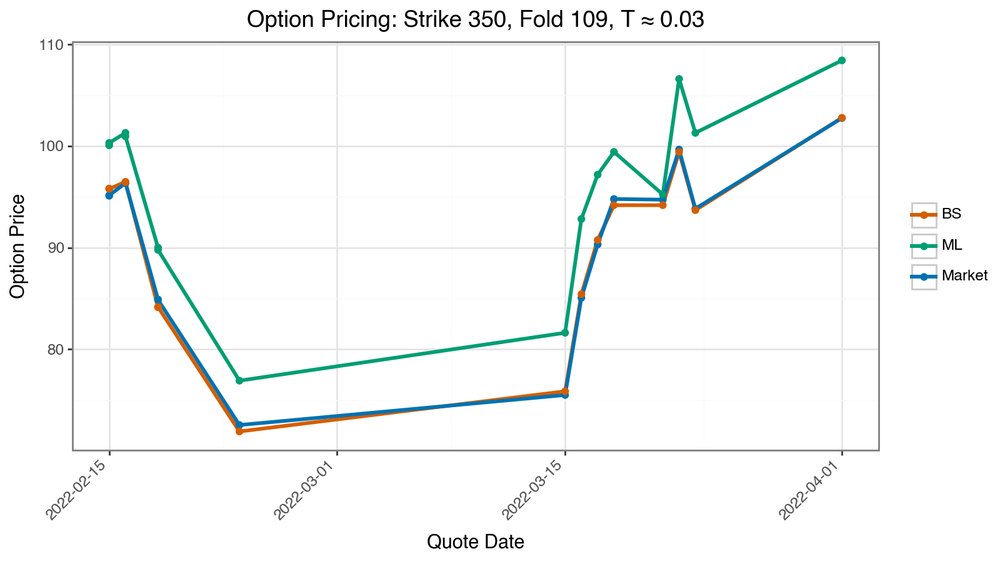

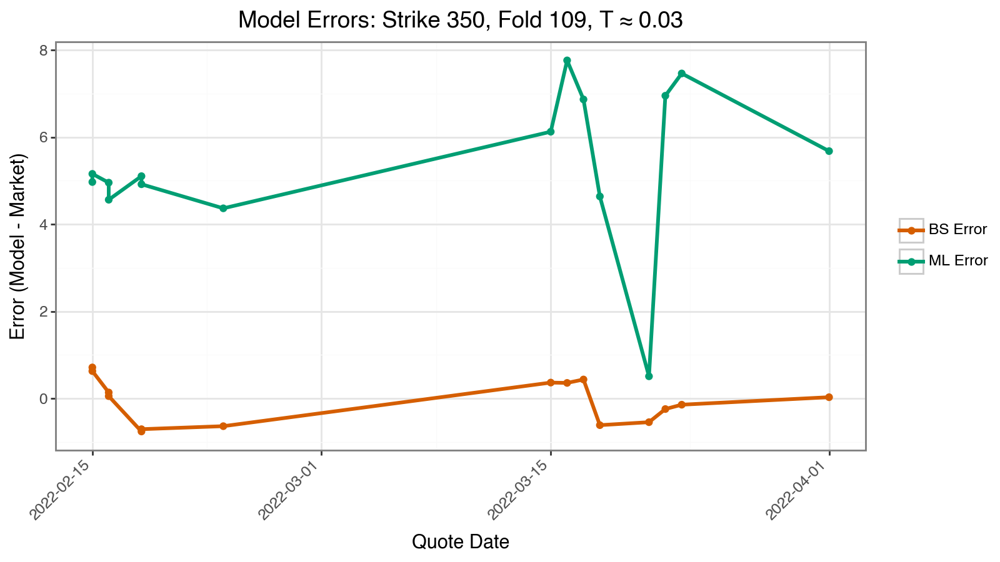

In [24]:
from plotnine import *
import pandas as pd

# --- PARAMETERS ---
fold_num = 109
strike_k = 350

# --- GET TEST DATE RANGE FOR SELECTED FOLD ---
#start, end = [(s, e) for f, start, end in test_dates if f == fold_num][0]

#start, end = [(test_start, test_end) for (fold, test_start, test_end) in test_dates if f == fold_num][0]
#start, end = [(test_start, test_end) for (f, test_start, test_end) in test_dates if f == fold_num][0]

# New (treat test_dates as a DataFrame):
#start, end = test_dates.loc[test_dates.iloc[0] == fold_num, ["Start", "End"]].iloc[0]

# Replace your old unpack line with:

#start, end = test_dates.loc[test_dates[0] == fold_num, [1, 2]].iloc[0]


# Unpack the (fold, start, end) tuple from the Python list
#start, end = [(row[1], row[2]) for row in test_dates if row[0] == fold_num][0]

start, end = test_dates.loc[test_dates["Fold"] == fold_num, ["Start", "End"]].iloc[0]


# --- FILTER FOR STRIKE, FOLD, AND INCLUDE T ---
df_k = all_results[
    (all_results["K"] == strike_k) &
    (all_results["quotedate"] >= start) &
    (all_results["quotedate"] <= end)
].copy().sort_values("quotedate")


print(df_k.head())

# --- SKIP IF EMPTY ---
if df_k.empty:
    print(f"No data for strike {strike_k} in fold {fold_num} test range.")
else:
    assert "T" in df_k.columns, "Missing 'T' in your all_results. It is required to uniquely identify contracts."

    # --- Drop duplicates based on contract-level key ---
    df_k = df_k.drop_duplicates(subset=["quotedate", "K", "T"])

    # --- PRICE PANEL ---
    price_df = pd.melt(
        df_k,
        id_vars=["quotedate", "K", "T"],
        value_vars=["market_price", "bs_price", "ml_price"],
        var_name="Series",
        value_name="value"
    )
    price_df["Series"] = price_df["Series"].map({
        "market_price": "Market",
        "bs_price": "BS",
        "ml_price": "ML"
    })
    price_df["panel"] = "Price"

    # --- ERROR PANEL ---
    df_k["bs_error"] = df_k["bs_price"] - df_k["market_price"]
    df_k["ml_error"] = df_k["ml_price"] - df_k["market_price"]
    error_df = pd.melt(
        df_k,
        id_vars=["quotedate", "K", "T"],
        value_vars=["bs_error", "ml_error"],
        var_name="Series",
        value_name="value"
    )
    error_df["Series"] = error_df["Series"].str.replace("_error", "").str.upper() + " Error"
    error_df["panel"] = "Error"

    # --- COMBINE PANELS ---
    combined = pd.concat([price_df, error_df], ignore_index=True)
    combined = combined.dropna(subset=["Series", "value", "quotedate"])
    combined["Series"] = combined["Series"].astype(str)
    combined["panel"] = combined["panel"].astype(str)

    # --- PLOTTING STYLING ---
    custom_colors = {
         "Market":  "#0072B2",
        "BS":       "#D55E00",
        "ML":       "#009E73",
        "BS Error": "#D55E00",
        "ML Error": "#009E73"
    }

    # --- Filter to a single contract: Pick a single T ---
    T_target = df_k["T"].median()  # or select T manually  # come back here to change these for visuals
    contract_df = combined[combined["T"].between(T_target - 0.01, T_target + 0.01)]

    # --- PRICE PLOT ---
    display(
        ggplot(contract_df[contract_df["panel"] == "Price"], aes(x='quotedate', y='value', color='Series')) +
        geom_line(size=1.2) +
        geom_point(size=1.5) +
        scale_color_manual(values=custom_colors) +
        theme_bw() +
        theme(
            legend_title=element_blank(),
            axis_text_x=element_text(rotation=45, hjust=1),
            figure_size=(8, 4.5)
        ) +
        labs(
            title=f"Option Pricing: Strike {strike_k}, Fold {fold_num}, T ≈ {T_target:.2f}",
            x="Quote Date",
            y="Option Price"
        )
    )

    # --- ERROR PLOT ---
    display(
        ggplot(contract_df[contract_df["panel"] == "Error"], aes(x='quotedate', y='value', color='Series')) +
        geom_line(size=1.2) +
        geom_point(size=1.5) +
        scale_color_manual(values=custom_colors) +
        theme_bw() +
        theme(
            legend_title=element_blank(),
            axis_text_x=element_text(rotation=45, hjust=1),
            figure_size=(8, 4.5)
        ) +
        labs(
            title=f"Model Errors: Strike {strike_k}, Fold {fold_num}, T ≈ {T_target:.2f}",
            x="Quote Date",
            y="Error (Model - Market)"
        )
    )


In [49]:
# For the price panel
dupes_price = combined[combined["panel"] == "Price"].duplicated(subset=["Series", "quotedate"], keep=False)
print("Price Panel Duplicates:", dupes_price.sum())

# For the error panel
dupes_error = combined[combined["panel"] == "Error"].duplicated(subset=["Series", "quotedate"], keep=False)
print("Error Panel Duplicates:", dupes_error.sum())


Price Panel Duplicates: 6
Error Panel Duplicates: 4


In [50]:
print(price_df.groupby(['Series'])['quotedate'].nunique())


Series
BS        21
ML        21
Market    21
Name: quotedate, dtype: int64


In [46]:
dupes = price_df.duplicated(subset=['Series', 'quotedate'])
print("Duplicates:", dupes.sum())


Duplicates: 75


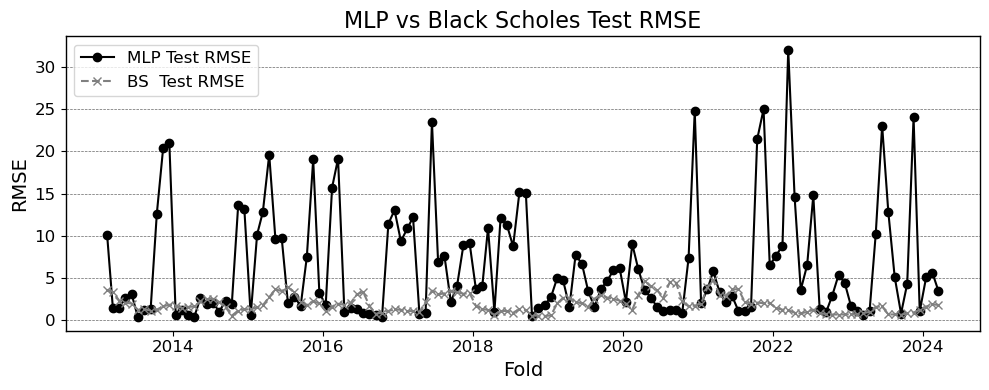

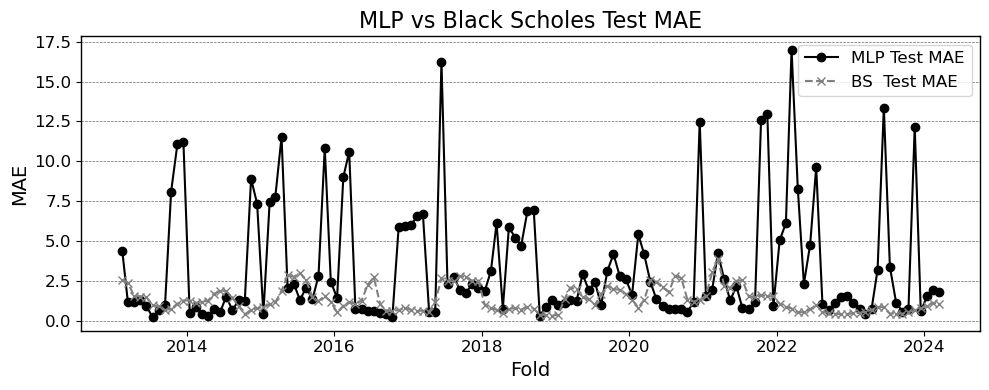

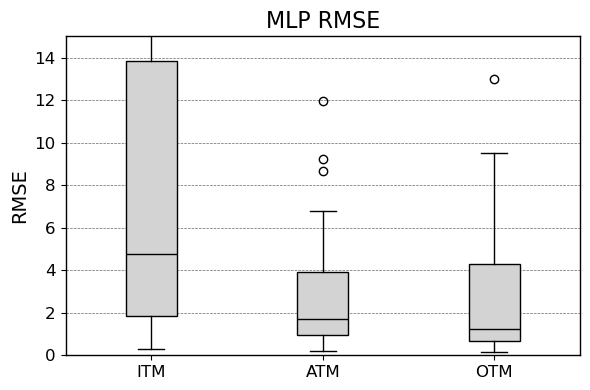

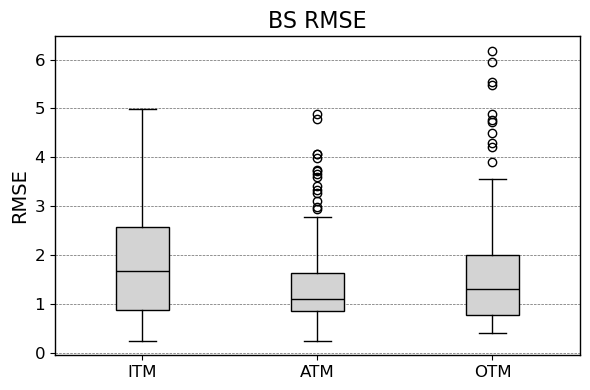

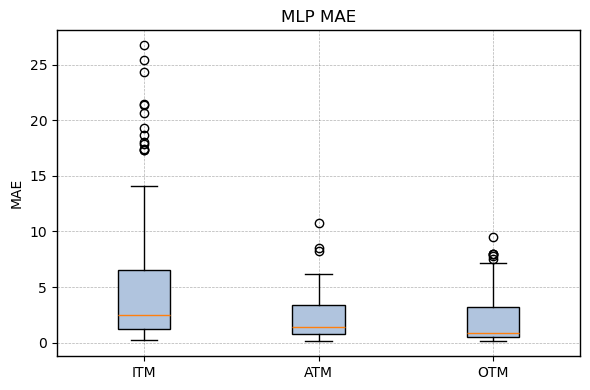

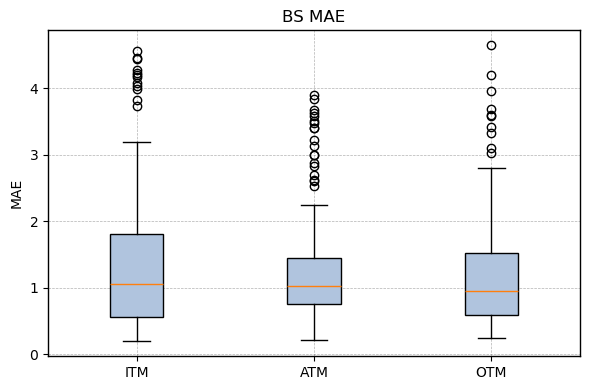

In [45]:

import matplotlib.pyplot as plt
import numpy as np
test_dates = pd.DataFrame(test_dates, columns=["Fold", "Start", "End"])


# Apply theme_bw() 
def apply_theme_bw():
    plt.rcParams.update({
        'axes.facecolor': 'white',
        'figure.facecolor': 'white',
        'axes.edgecolor': 'black',
        'axes.linewidth': 1,
        'grid.color': 'black',
        'grid.linestyle': '--',
        'grid.linewidth': 0.5,
        'xtick.color': 'black',
        'ytick.color': 'black',
        'xtick.labelsize': 12,
        'ytick.labelsize': 12,
        'axes.labelsize': 14,
        'axes.titlesize': 16,
        'legend.fontsize': 12
    })

apply_theme_bw()

# MLP vs BS Test RMSE
plt.figure(figsize=(10, 4))
plt.plot(test_dates.iloc[:,1], mlp_test_rmse, label="MLP Test RMSE", color='black', linestyle='-', marker='o')
plt.plot(test_dates.iloc[:,1], bs_test_rmse,  label="BS  Test RMSE", color='grey', linestyle='--', marker='x')
plt.xlabel("Fold")
plt.ylabel("RMSE")
plt.title("MLP vs Black Scholes Test RMSE")
plt.legend()
plt.grid(True, which='major', axis='y', alpha=0.6)
plt.tight_layout()
plt.show()

# MLP vs BS Test MAE
plt.figure(figsize=(10, 4))
plt.plot(test_dates.iloc[:,1], mlp_test_mae, label="MLP Test MAE", color='black', linestyle='-', marker='o')
plt.plot(test_dates.iloc[:,1], bs_test_mae,  label="BS  Test MAE", color='grey', linestyle='--', marker='x')
plt.xlabel("Fold")
plt.ylabel("MAE")
plt.title("MLP vs Black Scholes Test MAE")
plt.legend()
plt.grid(True, which='major', axis='y', alpha=0.6)
plt.tight_layout()
plt.show()



# Apply a theme similar to ggplot2's theme_bw
plt.style.use('default')  # start with default to avoid 'ggplot' styling

def apply_theme_bw():
    plt.rcParams.update({
        'axes.facecolor': 'white',
        'axes.edgecolor': 'black',
        'axes.linewidth': 1,
        'grid.color': 'black',
        'grid.linestyle': '--',
        'grid.linewidth': 0.5,
        'xtick.color': 'black',
        'ytick.color': 'black',
        'figure.facecolor': 'white',
    })

apply_theme_bw()

# MLP RMSE boxplot
plt.figure(figsize=(6, 4))
plt.boxplot([mlp_seg_rmse[s] for s in ["ITM", "ATM", "OTM"]],
            labels=["ITM", "ATM", "OTM"], patch_artist=True,
            boxprops=dict(facecolor='lightgrey', edgecolor='black'),
            medianprops=dict(color='black'))
plt.title("MLP RMSE", fontsize=16)
plt.ylabel("RMSE", fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.ylim(0, 15)
plt.grid(True, which='major', axis='y', alpha=0.6)
plt.tight_layout()
plt.show()

# BS RMSE boxplot
plt.figure(figsize=(6, 4))
plt.boxplot([bs_seg_rmse[s] for s in ["ITM", "ATM", "OTM"]],
            labels=["ITM", "ATM", "OTM"], patch_artist=True,
            boxprops=dict(facecolor='lightgrey', edgecolor='black'),
            medianprops=dict(color='black'))
plt.title("BS RMSE", fontsize=16)
plt.ylabel("RMSE", fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(True, which='major', axis='y', alpha=0.6)
plt.tight_layout()
plt.show()


# Segment MAE boxplots
plt.figure(figsize=(6,4))
plt.boxplot([mlp_seg_mae[s] for s in ["ITM","ATM","OTM"]],
            labels=["ITM","ATM","OTM"], patch_artist=True,
            boxprops=dict(facecolor='lightsteelblue'))
plt.title("MLP MAE"); plt.ylabel("MAE")
plt.grid(alpha=0.3); plt.tight_layout(); plt.show()

plt.figure(figsize=(6,4))
plt.boxplot([bs_seg_mae[s] for s in ["ITM","ATM","OTM"]],
            labels=["ITM","ATM","OTM"], patch_artist=True,
            boxprops=dict(facecolor='lightsteelblue'))
plt.title("BS MAE"); plt.ylabel("MAE")
plt.grid(alpha=0.3); plt.tight_layout(); plt.show()

# epoch metrics DataFrame
epoch_df = pd.DataFrame(epoch_metrics)

In [46]:
import numpy as np
import pandas as pd
from datetime import timedelta
from dateutil.relativedelta import relativedelta

# PARAMETERS 
first_date, last_date = pd.Timestamp("2012-02-14"), pd.Timestamp("2024-05-31")
train_months, test_months = 12, 2
atm_thresh = 0.01

# 1) Recompute test-fold segment counts
max_start = last_date - relativedelta(months=train_months + test_months) + timedelta(days=1)
fold_starts = []
dt = first_date
while dt <= max_start:
    fold_starts.append(dt)
    dt += relativedelta(months=1)

counts = {"ITM": [], "ATM": [], "OTM": []}
for start in fold_starts:
    train_end  = start + relativedelta(months=train_months) - timedelta(days=1)
    test_start = train_end + timedelta(days=1)
    test_end   = test_start + relativedelta(months=test_months) - timedelta(days=1)

    fold_df = run[(run["quotedate"] >= test_start) & (run["quotedate"] <= test_end)]
    if fold_df.empty:
        continue

    seg = np.where(
        fold_df["moneyness"] >  atm_thresh, "ITM",
        np.where(fold_df["moneyness"] < -atm_thresh, "OTM", "ATM")
    )
    for s in counts:
        counts[s].append((seg == s).sum())

In [47]:
rows = []
for seg in ["ITM", "ATM", "OTM"]:
    rows.append({
        "Segment":      seg,
        "Avg Count":    np.mean(counts[seg]),
        "Std Count":    np.std(counts[seg], ddof=1),
        "MLP Mean RMSE": np.mean(mlp_seg_rmse[seg]),
        "MLP Std RMSE":  np.std( mlp_seg_rmse[seg], ddof=1),
        "MLP Mean MAE":  np.mean(mlp_seg_mae[seg]),
        "MLP Std MAE":   np.std( mlp_seg_mae[seg], ddof=1),
        "BS Mean RMSE":  np.mean(bs_seg_rmse[seg]),
        "BS Std RMSE":   np.std( bs_seg_rmse[seg], ddof=1),
        "BS Mean MAE":   np.mean(bs_seg_mae[seg]),
        "BS Std MAE":    np.std( bs_seg_mae[seg], ddof=1),
    })
summary_df = pd.DataFrame(rows)

# Display Tables
print(summary_df)

  Segment   Avg Count   Std Count  MLP Mean RMSE  MLP Std RMSE  MLP Mean MAE  \
0     ITM  196.410448  122.948624       9.421478     10.019220      5.277381   
1     ATM   72.007463   46.156565       2.572663      2.125259      2.259940   
2     OTM  245.701493  182.992914       2.434575      2.480694      2.063079   

   MLP Std MAE  BS Mean RMSE  BS Std RMSE  BS Mean MAE  BS Std MAE  
0     6.080297      1.886303     1.215291     1.408359    1.122143  
1     1.981180      1.462302     0.968715     1.299754    0.874240  
2     2.275633      1.651291     1.233836     1.218650    0.889108  


## No-Arbitrage Constraints for American Call Options

### 1. Monotonicity in Strike
$$
\frac{\partial C(K)}{\partial K} \leq 0
$$

### 2. Convexity in Strike
$$
\frac{\partial^2 C(K)}{\partial K^2} \geq 0
$$

### 3. Monotonicity in Spot Price
$$
\frac{\partial C(S)}{\partial S} \geq 0
$$

### 4. Lower Bound
$$
C(K, S, T) \geq \max(S - K, 0)
$$

### 5. Upper Bound
$$
C(K, S, T) \leq S - PV(D)
$$


In [17]:
from plotnine import (
    ggplot, aes, geom_line, geom_point, facet_wrap,
    labs, theme_bw, theme, element_text
)
import numpy as np
import pandas as pd

def check_no_arbitrage_american(
    df, price_col='p_price', strike_col='K', date_col='quotedate', expiry_col='exdate'
):
    results = []

    for date, group in df.groupby(date_col):
        grp = group.sort_values(by=strike_col).reset_index(drop=True)
        strikes = grp[strike_col].values
        prices = grp[price_col].values
        S = grp['S'].iloc[0]

        # Time to maturity in years
        T = (grp[expiry_col].iloc[0] - grp[date_col].iloc[0]).days / 252
        r = grp['r'].iloc[0] if 'r' in grp.columns else 0.0
        D = grp['div'].iloc[0] if 'div' in grp.columns else 0.0

        # Present value of discrete dividend
        PV_div = D * np.exp(-r * T)
        upper_bound = S - PV_div

        # Required constraints
        mono_k = np.sum(prices[:-1] > prices[1:])
        conv_k = np.sum((prices[:-2] - 2 * prices[1:-1] + prices[2:]) < -1e-6)
        low_b  = np.sum(prices < np.maximum(S - strikes, 0) - 1e-6)
        high_b = np.sum(prices > upper_bound + 1e-6)

        # Monotonicity in S (Delta ≥ 0)
        mono_s = 0
        for k in np.unique(grp[strike_col]):
            sub = group[group[strike_col] == k].sort_values(by='S')
            if len(sub) > 1:
                p = sub[price_col].values
                mono_s += np.sum(p[:-1] > p[1:])

        results.append({
            'date': date,
            'monotonicity_in_strike': mono_k,
            'convexity_in_strike': conv_k,
            'monotonicity_in_spot': mono_s,
            'violation_of_lower_bound': low_b,
            'violation_of_upper_bound': high_b,
            'n_contracts': len(grp)
        })

    return pd.DataFrame(results)


In [38]:

# Recreate minimal working example using plotnine-compatible format (using previous 'summary' table)

from plotnine import (
    ggplot, aes, geom_line, labs,
    theme_bw, theme, element_text, facet_wrap
)

# Clean and transform data for plotnine
daily = (
    summary
    .groupby('date')[[
        'convexity_violations',
        'monotonicity_violations',
        'lower_bound_violations'
    ]]
    .sum()
    .reset_index()
)

summary_long = (
    daily
    .melt(id_vars='date', var_name='Violation_Type', value_name='Count')
    .sort_values(['Violation_Type','date'])
)

monthly = (
    summary_long
    .assign(month=summary_long['date'].dt.to_period('M').dt.to_timestamp())
    .groupby(['month','Violation_Type'])['Count']
    .sum()
    .reset_index()
)

# Final plot using facet_wrap and theme_bw
final_facet_plot = (
    ggplot(monthly, aes(x='month', y='Count', color='Violation_Type'))
    + geom_line()
    + facet_wrap('~Violation_Type', scales='free_y', ncol=1)
    + labs(x='Month', y='Total Violations', title='Monthly No-Arbitrage Violations by Type')
    + theme_bw()
    + theme(axis_text_x=element_text(rotation=45, hjust=1), figure_size=(12, 5))
)

final_facet_plot


NameError: name 'summary' is not defined

In [39]:
# 1) Sum up any duplicates in the original summary
daily = (
    summary
    .groupby('date')[[
        'convexity_violations',
        'monotonicity_violations',
        'lower_bound_violations'
    ]]
    .sum()
    .reset_index()
)

# 2) Melt the cleaned, 1-row-per-date table
summary_long = (
    daily
    .melt(
        id_vars='date',
        var_name='Violation_Type',
        value_name='Count'
    )
)


from plotnine import (
    ggplot, aes, geom_line, geom_point, labs,
    theme_bw, theme, element_text, facet_wrap
)

# ensure it's sorted
summary_long = summary_long.sort_values(['Violation_Type','date'])

(
    ggplot(summary_long, aes(
        x='date',
        y='Count',
        color='Violation_Type',
        group='Violation_Type'
    ))
    + geom_line(size=0.4, alpha=0.7)
    + geom_point(size=1.5)
    + labs(
        title='No-Arbitrage Violations Over Time',
        x='Date',
        y='Count of Violations',
        color='Violation Type'
    )
    + theme_bw()
    + theme(
        axis_text_x=element_text(rotation=45, hjust=1),
        figure_size=(12, 3)
    )
)


# example in pandas/plotnine
monthly = (
    summary_long
    .assign(month=summary_long['date'].dt.to_period('M').dt.to_timestamp())
    .groupby(['month','Violation_Type'])['Count']
    .sum()
    .reset_index()
)

(
  ggplot(monthly, aes(x='month', y='Count', color='Violation_Type'))
  + geom_line()
  + facet_wrap('~Violation_Type', scales='free_y', ncol=1)
  + labs(x='Month', y='Total Violations', title='Monthly No-Arb Violations by Type')
  +theme_bw()
)



NameError: name 'summary' is not defined

In [40]:
bad_date = summary.nlargest(1, 'convexity_violations')['date'].iloc[0]
bad_df   = run[run['quotedate'] == bad_date].sort_values('K')
print(bad_df[['K','p_price','black_scholes']])


NameError: name 'summary' is not defined